# Libraries

In [1]:
import numpy as np
import pandas as pd
from pandasql import sqldf
pysqldf = lambda q: sqldf(q, globals())

import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, date
from  sklearn.impute import KNNImputer

# Load Data

In [4]:
# polutan_1 = pd.read_csv('../Pollutants/2021 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
# polutan_2 = pd.read_csv('../Pollutants/2022 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
polutan_3 = pd.read_csv('../Pollutants/2023 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
# polutan_4 = pd.read_csv('../Pollutants/2024 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
polutan_4 = pd.read_csv('../Pollutants/2024 - Indeks Standar Pencemar Udara (ISPU) Jan-Dec.csv', sep=';', decimal='.')

cuaca_kemayoran = pd.read_csv('../Meteorological Kemayoran/kemayoran 2021 - 2024.csv', sep=';', decimal='.')
cuaca_tanjung_priok = pd.read_csv('../Meteorological Tanjung Priok/tanjung priok 2021-2024.csv', sep=';', decimal='.')

# DKI 1: Bundaran HI (Jakarta Pusat)
# DKI 2: Kelapa Gading (Jakarta Utara)
# DKI 3: Jagakarsa (Jakarta Selatan)
# DKI 4: Lubang buaya (Jakarta Timur)
# DKI 5: Kebon Jeruk (Jakarta Barat)

# Preprocessing Data

Processing Data mencakup:
1. Data Polutan
    - menyamakan format data kosong ke None
    - Memasukkan data polutan per DKI ke axis kolom, agar tidak ada baris tanggal yang duplikat dan agar bisa digabungkan dengan data cuaca
2. Data Cuaca

beberapa yang preprocess manual:

2021
1. Rename value kolom stasiun
    - DKI1 (Bundaran HI) -> DKI1
    - DKI2 (Kelapa Gading) -> DKI2
    - DKI3 (Jagakarsa) -> DKI3
    - DKI4 (Lubang buaya) -> DKI4
    - DKI5 (Kebon Jeruk) -> DKI5

2022
1. lokasi_spku -> stasiun
2. typo pada periode 202202, tahun 2020 -> 2022

2023
1. Rename value kolom stasiun:
    - DKI5 Kebon Jeruk Jakarta Barat & DKI5 Kebon Jeruk -> DKI5
    - DKI1 Bunderan HI -> DKI1
    - DKI2 Kelapa Gading -> DKI2
    - DKI3 Jagakarsa -> DKI3
    - DKI4 Lubang Buaya -> DKI4
2. Rename value parameter pencemar kritis
    - 2 -> PM25
    - 1 -> PM10
    - 5 -> O3
    - 3 -> SO2
3. typo pada periode 202212 -> 202312, 2022 -> 2023

2024
1. Rename value kolom stasiun:
    - DKI5 Kebon Jeruk Jakarta Barat & DKI5 Kebon Jeruk -> DKI5
    - DKI1 Bunderan HI & DKI1 Bundaran Hotel Indonesia (HI) -> DKI1
    - DKI2 Kelapa Gading -> DKI2
    - DKI3 Jagakarsa -> DKI3
    - DKI4 Lubang Buaya -> DKI4

2. Rename value kolom stasiun (Updated on 12 Maret 2025):
    - DKI1 Bunderan HI & DKI1 Bundaran Hotel Indonesia (HI) -> DKI1
    - DKI2 Kelapa Gading -> DKI2
    - DKI3 Jagakarsa -> DKI3
    - DKI4 Lubang Buaya -> DKI4
    - DKI5 Kebon Jeruk Jakarta Barat & DKI5 Kebon Jeruk -> DKI5

In [5]:
example = np.cos(0), np.sin(0)
example

(np.float64(1.0), np.float64(0.0))

## Data Meteorologi

Arah Angin

- (1) C: Calm
- (2) N: North
- (3) NE: North East
- (4) E: East
- (5) SE: South East
- (6) S: South
- (7) SW: South West
- (8) W: West
- (9) NW: North West

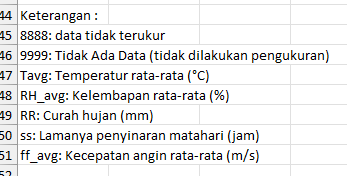

data di 23 oktober 2023 completely blank, use other imputation method

### Kemayoran

In [6]:
# cuaca_kemayoran = cuaca_kemayoran.drop(1440)
cuaca_kemayoran = cuaca_kemayoran.drop(columns=['lat', 'long', 'elevation'])

In [7]:
for i in range(len(cuaca_kemayoran['Tanggal'])):
  cuaca_kemayoran.loc[i, 'Tanggal'] = datetime.strptime(cuaca_kemayoran['Tanggal'][i], '%d-%m-%Y').date()

In [8]:
cuaca_kemayoran = cuaca_kemayoran[cuaca_kemayoran['Tanggal'] >= date(2023, 1, 1)]
cuaca_kemayoran = cuaca_kemayoran.reset_index(drop=True)
cuaca_kemayoran

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,"26,3",87.0,"14,5",0,1.0,C
1,2023-01-02,"27,5",81.0,"31,5","0,7",2.0,NW
2,2023-01-03,"26,6",82.0,"0,5",0,1.0,C
3,2023-01-04,"26,4",86.0,"2,4",NaN,1.0,C
4,2023-01-05,"27,4",83.0,"35,3",NaN,2.0,C
...,...,...,...,...,...,...,...
726,2024-12-27,"29,2",78.0,-,"1,2",2.0,C
727,2024-12-28,30,70.0,-,"3,8",2.0,C
728,2024-12-29,"29,7",73.0,-,3,1.0,C
729,2024-12-30,"28,4",76.0,1,"1,8",2.0,SW


In [9]:
cuaca_kemayoran[cuaca_kemayoran['Tanggal'] <= date(2024, 10, 31)]

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,"26,3",87.0,"14,5",0,1.0,C
1,2023-01-02,"27,5",81.0,"31,5","0,7",2.0,NW
2,2023-01-03,"26,6",82.0,"0,5",0,1.0,C
3,2023-01-04,"26,4",86.0,"2,4",NaN,1.0,C
4,2023-01-05,"27,4",83.0,"35,3",NaN,2.0,C
...,...,...,...,...,...,...,...
665,2024-10-27,"30,1",71.0,0,8,2.0,C
666,2024-10-28,"30,2",67.0,0,8,1.0,C
667,2024-10-29,"30,8",69.0,0,"0,6",1.0,C
668,2024-10-30,"30,9",65.0,0,"6,5",1.0,C


In [10]:
cuaca_kemayoran[['Tavg', 'RR', 'ss']] = cuaca_kemayoran[['Tavg', 'RR', 'ss']].apply(lambda x: x.str.replace(',','.'))

In [11]:
cuaca_kemayoran[['RR', 'ss']] = cuaca_kemayoran[['RR', 'ss']].replace('-', np.nan)
cuaca_kemayoran[['Tavg', 'RR', 'ss']] = cuaca_kemayoran[['Tavg', 'RR', 'ss']].astype(float)

In [12]:
cuaca_kemayoran['DDD_CAR'].unique()

array(['C ', 'NW', 'W ', 'S ', 'E ', nan, 'SW', 'C', 'E', 'N', 'W'],
      dtype=object)

In [13]:
cuaca_kemayoran['DDD_CAR'] = cuaca_kemayoran['DDD_CAR'].str.strip()
cuaca_kemayoran['DDD_CAR'].unique()

array(['C', 'NW', 'W', 'S', 'E', nan, 'SW', 'N'], dtype=object)

In [14]:
# manual label encoding
cuaca_kemayoran['DDD_CAR'] = cuaca_kemayoran['DDD_CAR'].replace({
  'C': 1,
  'N': 2,
  'NE': 3,
  'E': 4,
  'SE': 5,
  'S': 6,
  'SW': 7,
  'W': 8,
  'NW': 9
})

C:\Users\stevanus.febrian\AppData\Local\Temp\ipykernel_8972\1221351845.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cuaca_kemayoran['DDD_CAR'] = cuaca_kemayoran['DDD_CAR'].replace({


In [15]:
cuaca_kemayoran_processed = cuaca_kemayoran.copy()

In [16]:
cuaca_kemayoran_processed

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0
1,2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0
2,2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0
3,2023-01-04,26.4,86.0,2.4,NaN,1.0,1.0
4,2023-01-05,27.4,83.0,35.3,NaN,2.0,1.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,78.0,NaN,1.2,2.0,1.0
727,2024-12-28,30.0,70.0,NaN,3.8,2.0,1.0
728,2024-12-29,29.7,73.0,NaN,3.0,1.0,1.0
729,2024-12-30,28.4,76.0,1.0,1.8,2.0,7.0


#### Missing Values

In [17]:
pysqldf(""" select 
        count(*) 
        from cuaca_kemayoran
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,count(*)
0,200


In [18]:
pysqldf(""" select 
        *
        from cuaca_kemayoran
        where Tavg is null and
        RH_avg is null and
        RR is null and
        ss is null and
        ff_avg is null
""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-23,None,None,None,None,None,None


In [19]:
cuaca_kemayoran_processed = cuaca_kemayoran_processed.replace([9999.0, 8888.0], np.nan)

total row: 1440

rows contain null: 434

30.14% data null

#### EDA Univariate

In [20]:
cuaca_kemayoran_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Tanggal  731 non-null    object 
 1   Tavg     726 non-null    float64
 2   RH_avg   728 non-null    float64
 3   RR       538 non-null    float64
 4   ss       720 non-null    float64
 5   ff_avg   730 non-null    float64
 6   DDD_CAR  730 non-null    float64
dtypes: float64(6), object(1)
memory usage: 40.1+ KB


In [21]:
cuaca_kemayoran_processed = cuaca_kemayoran_processed.set_index('Tanggal')

In [22]:
cuaca_kemayoran_processed.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,726.000000,728.000000,538.000000,720.000000,730.000000,730.000000
mean,29.013774,74.961538,7.099257,4.441667,1.157534,1.526027
std,1.086990,6.512597,16.013209,2.593012,0.572439,1.705315
min,24.800000,56.000000,0.000000,0.000000,0.000000,1.000000
25%,28.400000,71.000000,0.000000,2.400000,1.000000,1.000000
50%,29.100000,75.000000,0.000000,4.800000,1.000000,1.000000
75%,29.700000,79.000000,4.450000,6.700000,1.000000,1.000000
max,31.800000,94.000000,140.900000,9.900000,3.000000,9.000000


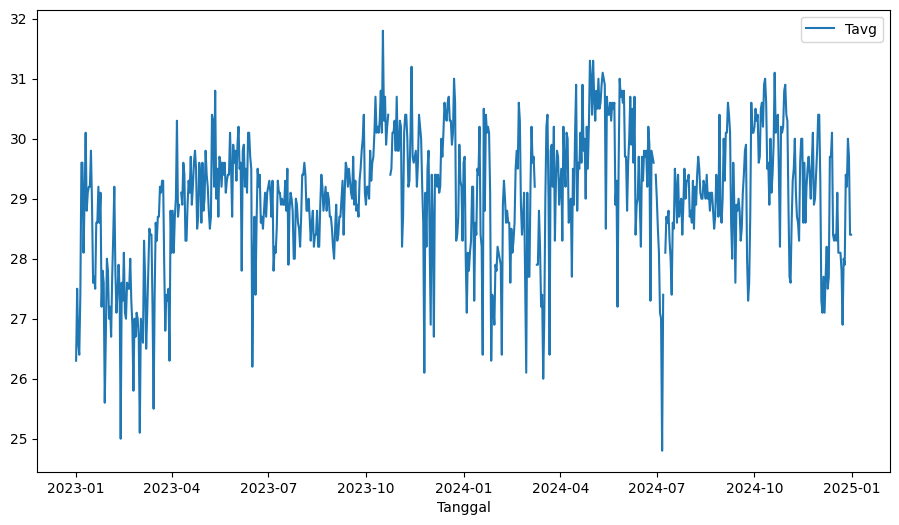

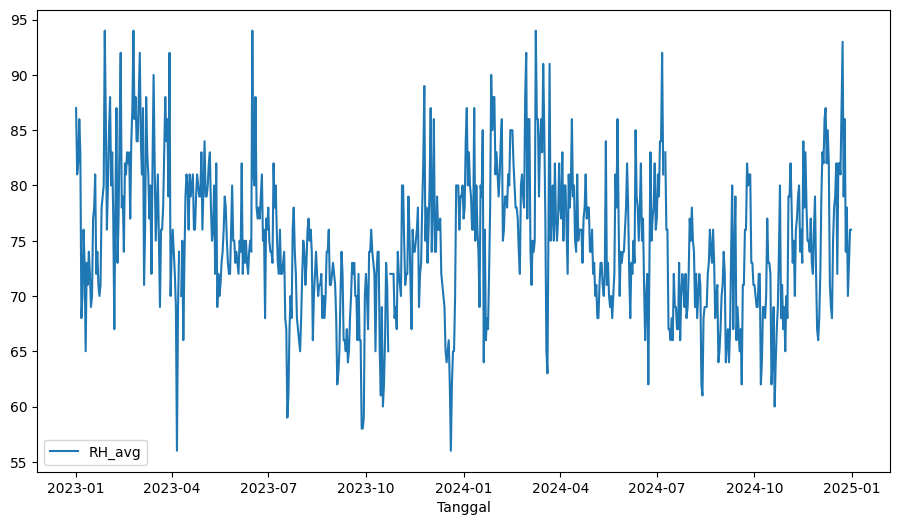

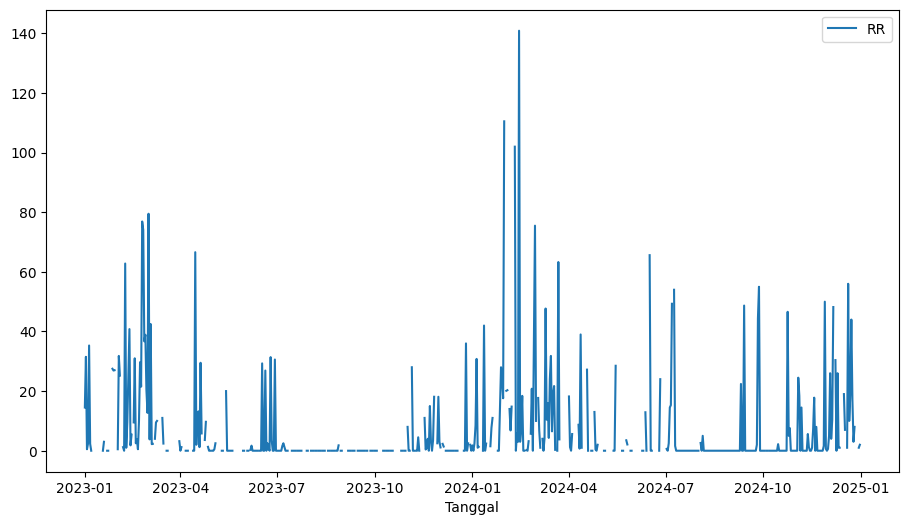

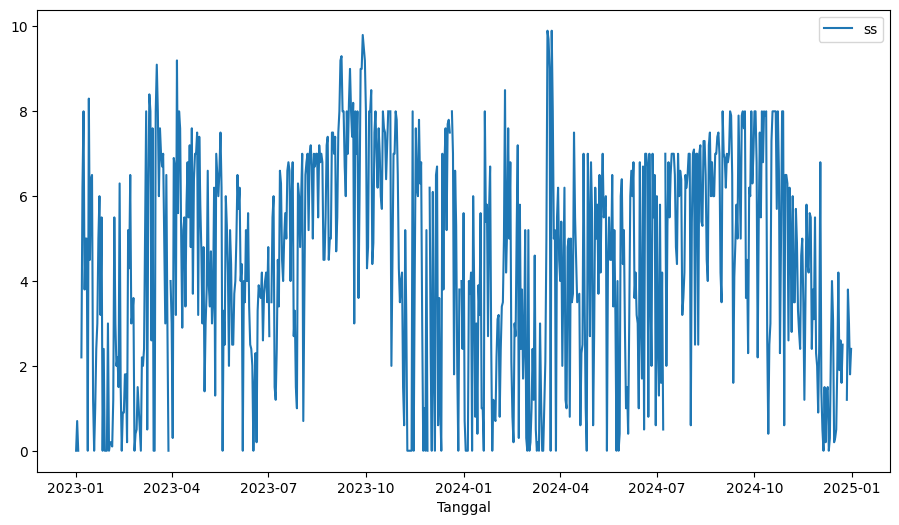

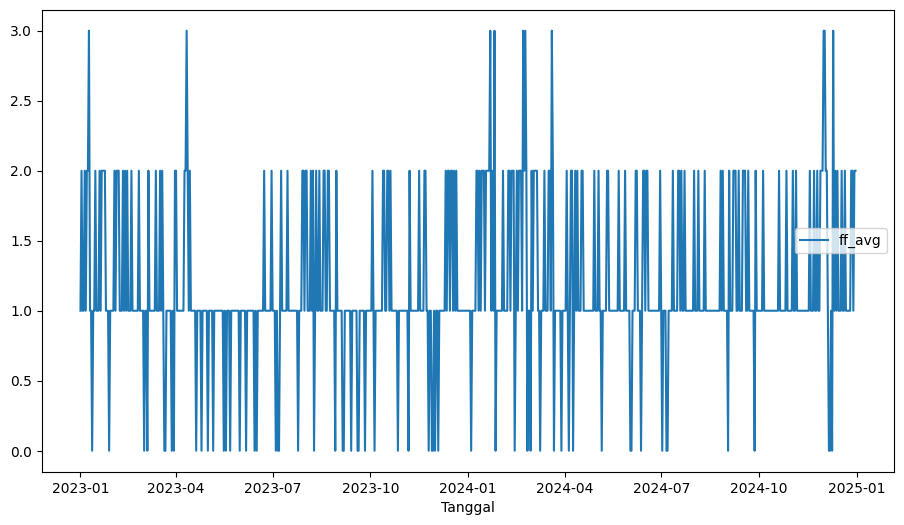

In [23]:
cuaca_kemayoran_processed.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

cuaca_kemayoran_processed.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

cuaca_kemayoran_processed.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

cuaca_kemayoran_processed.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

cuaca_kemayoran_processed.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

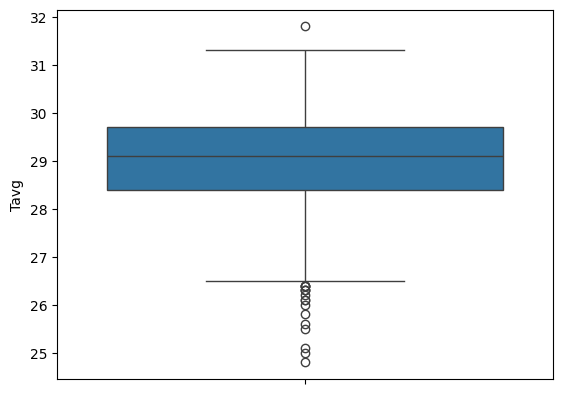

In [24]:
sns.boxplot(y=cuaca_kemayoran_processed['Tavg'])
plt.show()

Text(0, 0.5, 'counts')

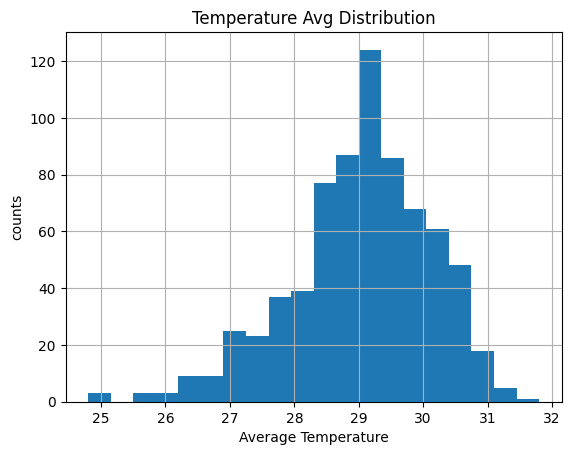

In [25]:
cuaca_kemayoran_processed['Tavg'].hist(bins = 20)
plt.title('Temperature Avg Distribution')
plt.xlabel('Average Temperature')
plt.ylabel('counts')

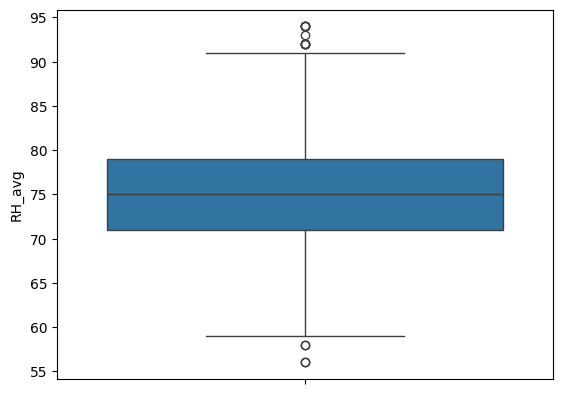

In [26]:
sns.boxplot(y=cuaca_kemayoran_processed['RH_avg'])
plt.show()

Text(0, 0.5, 'count')

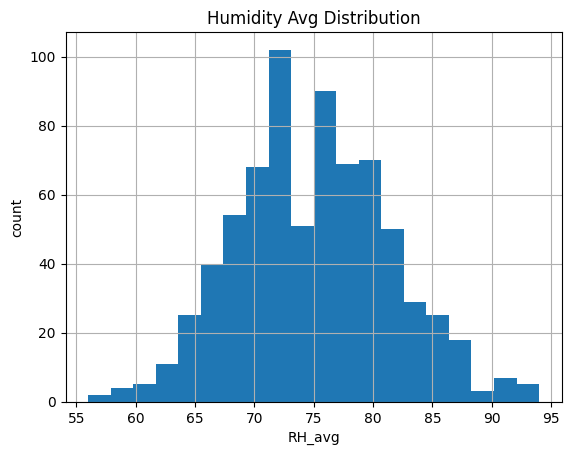

In [27]:
cuaca_kemayoran_processed['RH_avg'].hist(bins = 20)
plt.title('Humidity Avg Distribution')
plt.xlabel('RH_avg')
plt.ylabel('count')

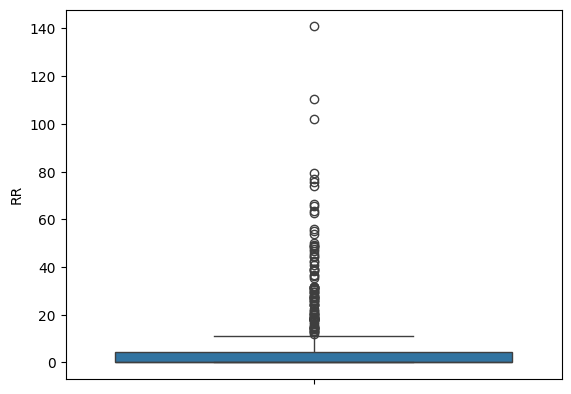

In [28]:
sns.boxplot(y=cuaca_kemayoran_processed['RR'])
plt.show()

Text(0, 0.5, 'count')

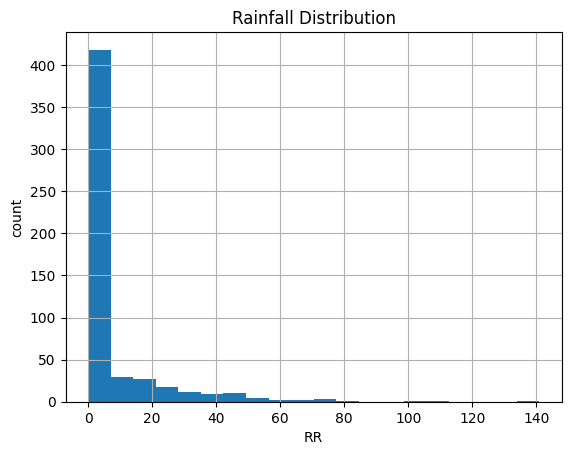

In [29]:
cuaca_kemayoran_processed['RR'].hist(bins = 20)
plt.title('Rainfall Distribution')
plt.xlabel('RR')
plt.ylabel('count')

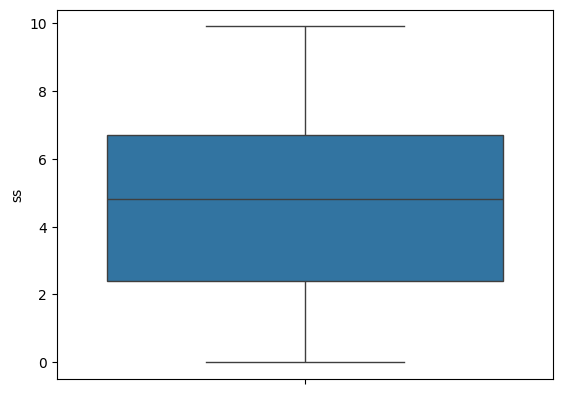

In [30]:
sns.boxplot(y=cuaca_kemayoran_processed['ss'])
plt.show()

Text(0, 0.5, 'count')

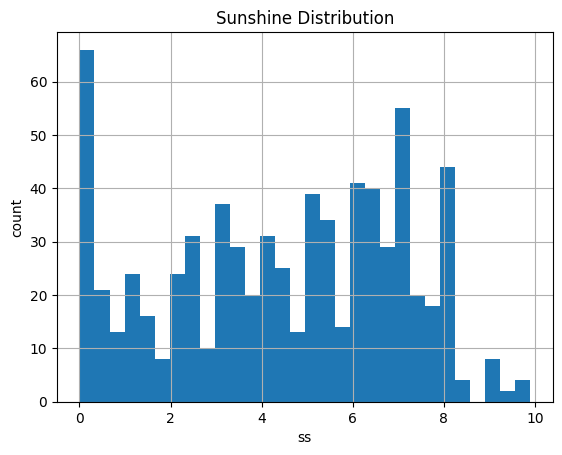

In [31]:
cuaca_kemayoran_processed['ss'].hist(bins = 30)
plt.title('Sunshine Distribution')
plt.xlabel('ss')
plt.ylabel('count')

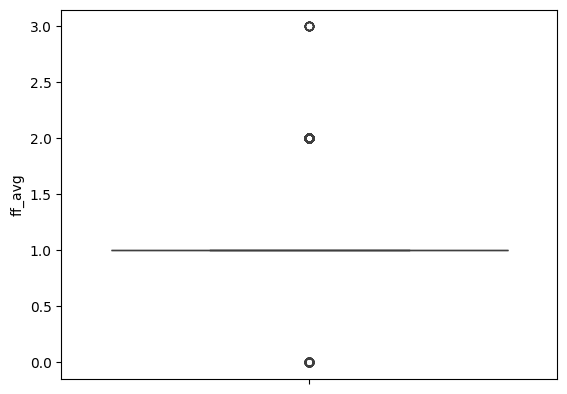

In [32]:
sns.boxplot(y=cuaca_kemayoran_processed['ff_avg'])
plt.show()

Text(0, 0.5, 'count')

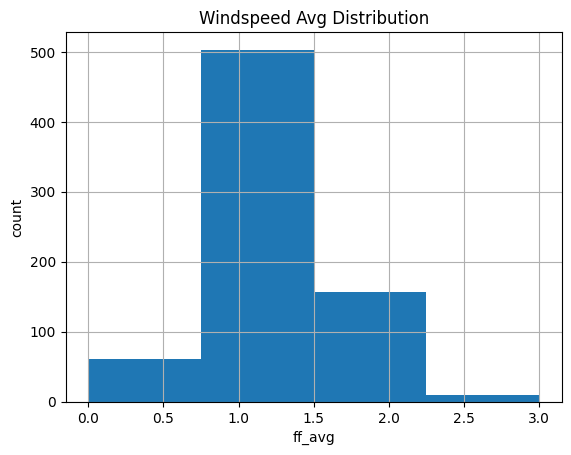

In [33]:
cuaca_kemayoran_processed['ff_avg'].hist(bins = 4)
plt.title('Windspeed Avg Distribution')
plt.xlabel('ff_avg')
plt.ylabel('count')

TRENDS
- tren Tavg semakin naik
- tren RH_avg cenderung semakin turun

DISTRIBUTIONS:
- Tavg & RH_avg mempunyai bentuk distribusi normal yang sedikit right skew

#### EDA Bivariate

In [34]:
list(cuaca_kemayoran_processed[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].columns)

['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']

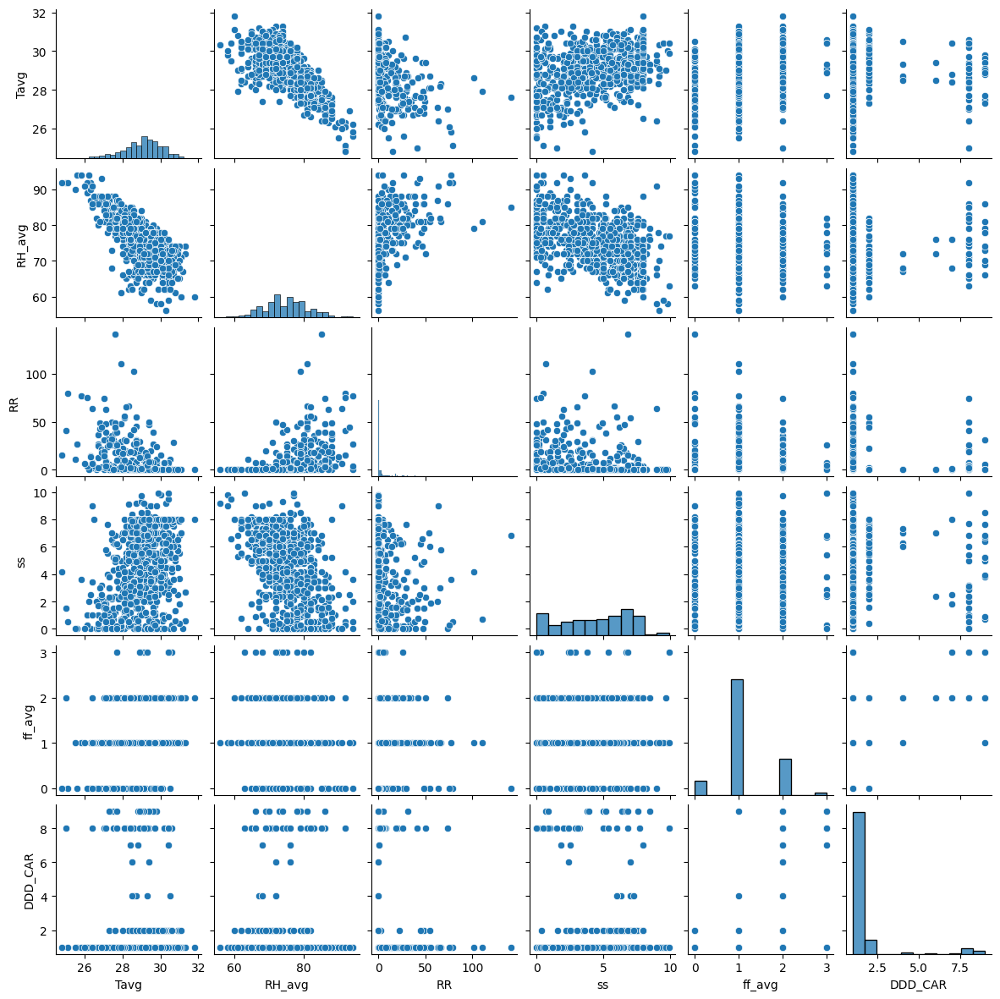

In [35]:
sns.pairplot(cuaca_kemayoran_processed, height=2)

Temperature
- LOWER Temperature - HIGHER Humidity
- LOWER Temperature - cenderung HIGHER Rainfall
- HIGHER Temperature - cendurung HIGHER Sunshine

Humidity
- HIGHER Humidity - cenderung HIGHER Rainfall
- HIGHER Humidity - cenderung LOWER sunshine

Else is hard to see the correlation

#### Impute Data

In [36]:
cuaca_kemayoran_processed

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
Tanggal,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0
2023-01-04,26.4,86.0,2.4,NaN,1.0,1.0
2023-01-05,27.4,83.0,35.3,NaN,2.0,1.0
...,...,...,...,...,...,...
2024-12-27,29.2,78.0,NaN,1.2,2.0,1.0
2024-12-28,30.0,70.0,NaN,3.8,2.0,1.0
2024-12-29,29.7,73.0,NaN,3.0,1.0,1.0


In [37]:
# KNN
imputer = KNNImputer()
imputed_cuaca_kemayoran = pd.concat(
  [
    pd.DataFrame({
      'Tanggal': cuaca_kemayoran['Tanggal']
    }),
    pd.DataFrame(imputer.fit_transform(cuaca_kemayoran_processed),columns = ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR'])
  ], axis=1
)

In [38]:
imputed_cuaca_kemayoran

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,26.3,87.0,14.50,0.00,1.0,1.0
1,2023-01-02,27.5,81.0,31.50,0.70,2.0,9.0
2,2023-01-03,26.6,82.0,0.50,0.00,1.0,1.0
3,2023-01-04,26.4,86.0,2.40,2.12,1.0,1.0
4,2023-01-05,27.4,83.0,35.30,4.94,2.0,1.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,78.0,7.52,1.20,2.0,1.0
727,2024-12-28,30.0,70.0,0.64,3.80,2.0,1.0
728,2024-12-29,29.7,73.0,0.00,3.00,1.0,1.0
729,2024-12-30,28.4,76.0,1.00,1.80,2.0,7.0


In [39]:
imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].round(1)
imputed_cuaca_kemayoran[['RH_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['RH_avg', 'DDD_CAR']].round(0)

In [40]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_kemayoran where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.9,73.0,6.5,6.4,2.0,1.0
1,2023-10-21,30.2,71.0,0.0,7.2,1.0,1.0
2,2023-10-22,30.4,65.0,0.0,8.0,1.0,1.0
3,2023-10-23,29.0,75.0,7.1,4.4,1.2,2.0
4,2023-10-24,29.4,72.0,0.0,8.0,1.0,1.0
5,2023-10-25,29.5,72.0,0.4,2.0,1.0,1.0
6,2023-10-26,30.1,72.0,0.0,4.4,1.0,1.0


In [41]:
# Linear Interpolation
imputed_cuaca_kemayoran.loc[imputed_cuaca_kemayoran['Tanggal'] == datetime.strptime('23-10-2023', '%d-%m-%Y').date(), ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = np.nan
imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].interpolate(method ='linear', limit_direction ='forward')

In [42]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_kemayoran where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.9,73.0,6.5,6.4,2.0,1.0
1,2023-10-21,30.2,71.0,0.0,7.2,1.0,1.0
2,2023-10-22,30.4,65.0,0.0,8.0,1.0,1.0
3,2023-10-23,29.9,68.5,0.0,8.0,1.0,1.0
4,2023-10-24,29.4,72.0,0.0,8.0,1.0,1.0
5,2023-10-25,29.5,72.0,0.4,2.0,1.0,1.0
6,2023-10-26,30.1,72.0,0.0,4.4,1.0,1.0


In [43]:
# imputed_cuaca_kemayoran = imputed_cuaca_kemayoran.set_index(imputed_cuaca_kemayoran['Tanggal'])

#### EDA After Cleaning & Preprocess

In [44]:
imputed_cuaca_kemayoran.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,29.010807,74.954172,6.537483,4.451984,1.157319,1.525308
std,1.089215,6.504131,14.366142,2.590828,0.572077,1.704258
min,24.800000,56.000000,0.000000,0.000000,0.000000,1.000000
25%,28.400000,71.000000,0.000000,2.400000,1.000000,1.000000
50%,29.100000,75.000000,0.200000,4.800000,1.000000,1.000000
75%,29.700000,79.000000,5.650000,6.700000,1.000000,1.000000
max,31.800000,94.000000,140.900000,9.900000,3.000000,9.000000


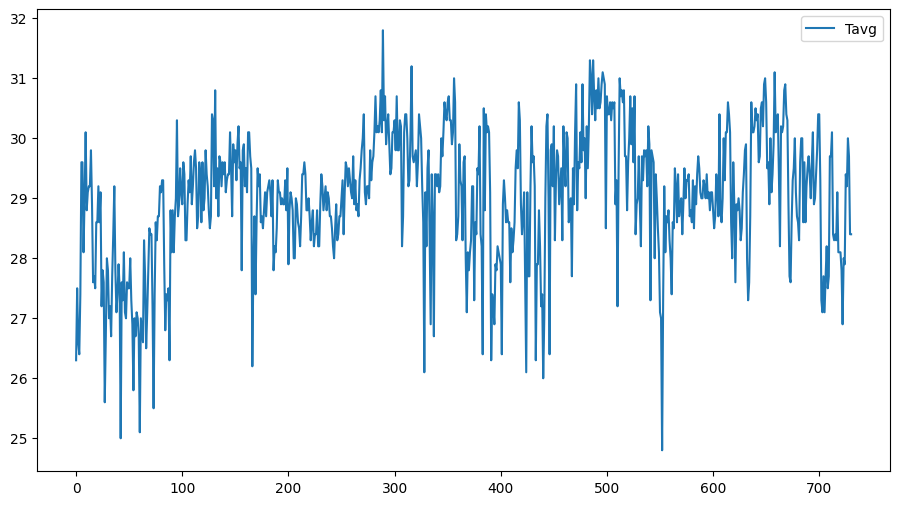

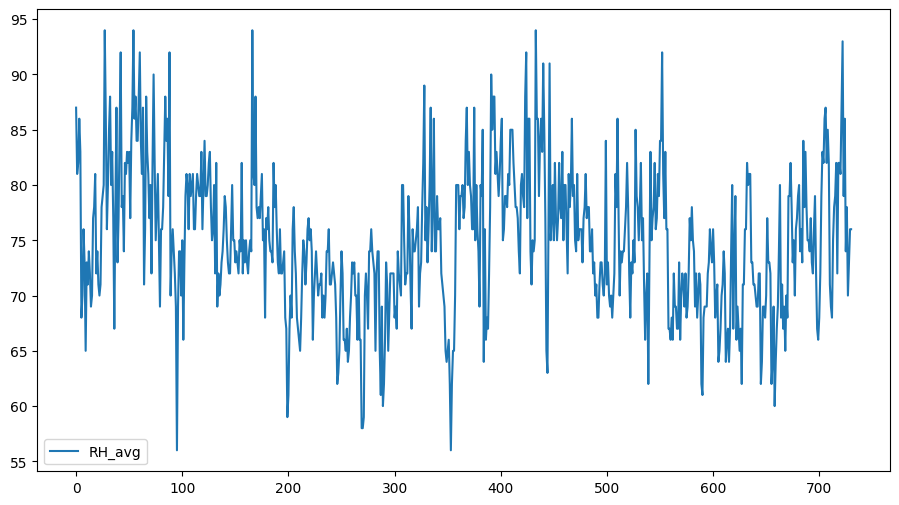

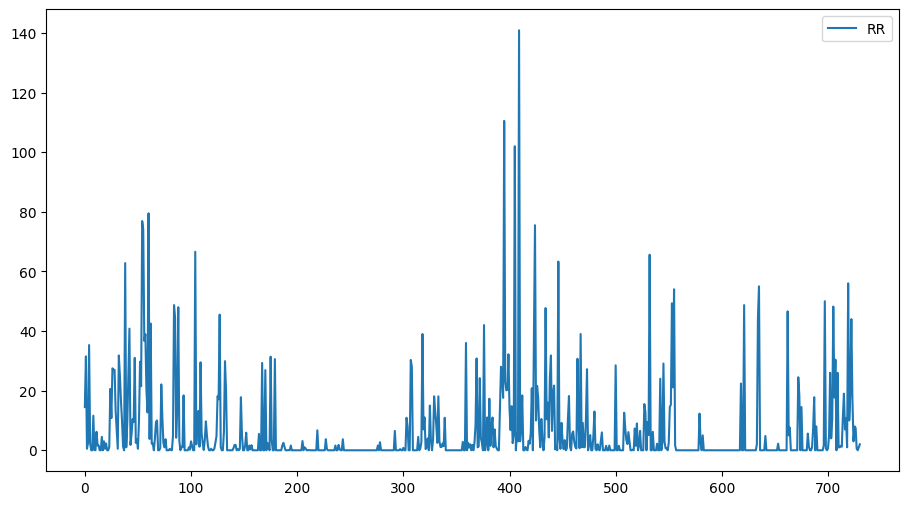

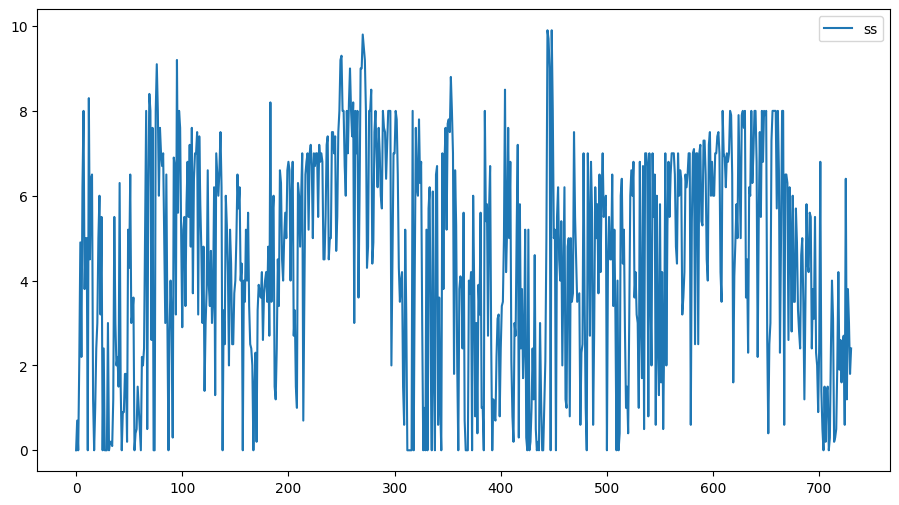

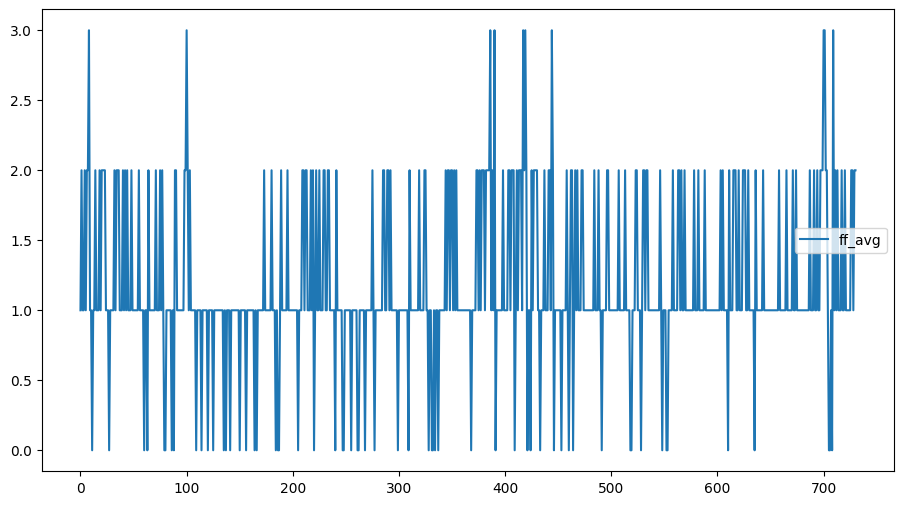

In [45]:
imputed_cuaca_kemayoran.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

imputed_cuaca_kemayoran.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

imputed_cuaca_kemayoran.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

imputed_cuaca_kemayoran.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

imputed_cuaca_kemayoran.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

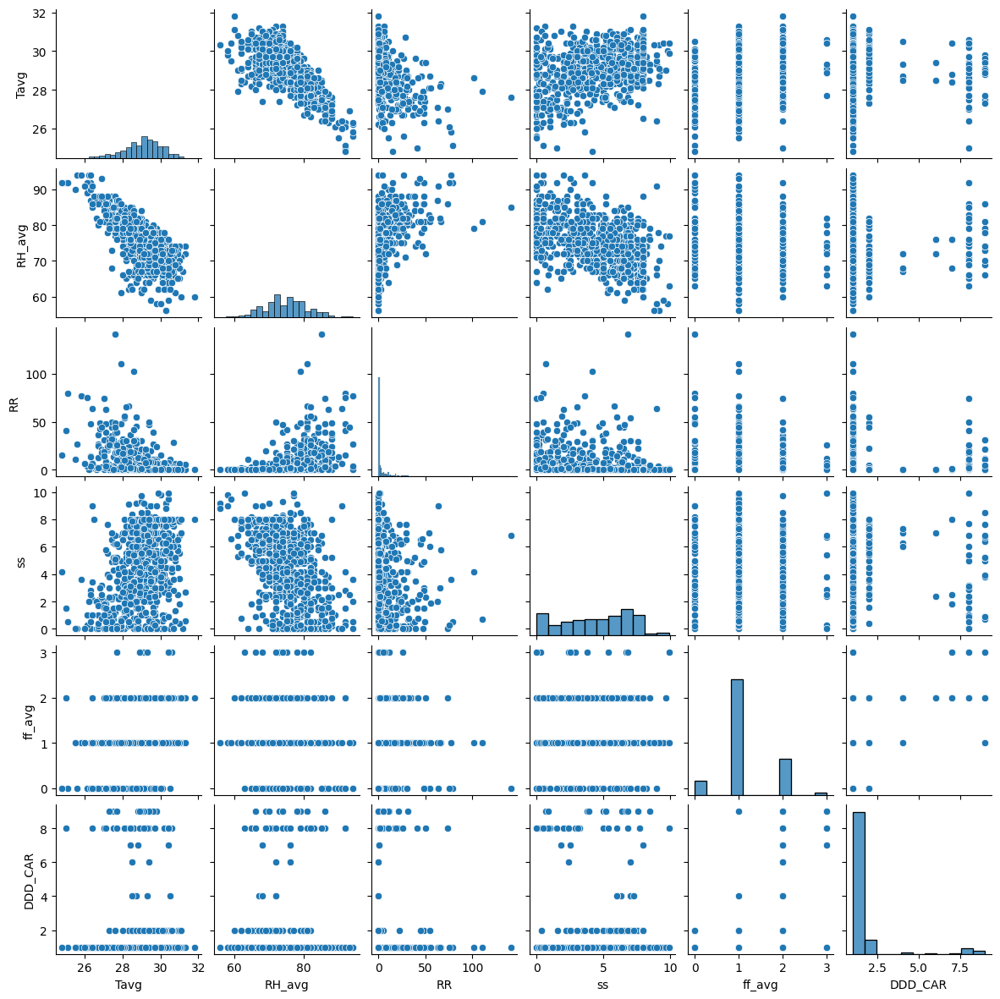

In [46]:
sns.pairplot(imputed_cuaca_kemayoran, height=2)

Rainfall menjadi kolom dengan jumlah imputasi paling banyak (300) data, namun tetap tidak terlihat perubahan yang berarti

### Tanjung Priok

In [47]:
cuaca_tanjung_priok = cuaca_tanjung_priok.drop(columns=['lat', 'long', 'elevation'])

In [48]:
cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,01-01-2021,"26,9",85.0,"7,7",0,2.0,W
1,02-01-2021,"27,3",82.0,"0,5","2,9",3.0,NW
2,03-01-2021,28,82.0,NaN,"5,5",3.0,W
3,04-01-2021,"28,6",79.0,"2,8","2,5",3.0,W
4,05-01-2021,"27,8",84.0,NaN,7,2.0,W
...,...,...,...,...,...,...,...
1456,27-12-2024,"29,2",81.0,-,"4,6",3.0,W
1457,28-12-2024,"29,6",79.0,-,"7,3",2.0,NW
1458,29-12-2024,"29,3",81.0,-,"5,9",3.0,W
1459,30-12-2024,"28,2",79.0,1,"3,7",4.0,W


In [49]:
for i in range(len(cuaca_tanjung_priok['Tanggal'])):
  cuaca_tanjung_priok.loc[i, 'Tanggal'] = datetime.strptime(cuaca_tanjung_priok['Tanggal'][i], '%d-%m-%Y').date()

In [50]:
cuaca_tanjung_priok = cuaca_tanjung_priok[cuaca_tanjung_priok['Tanggal'] >= date(2023, 1, 1)]
cuaca_tanjung_priok = cuaca_tanjung_priok.reset_index(drop=True)
cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,"25,9",93.0,38,"1,3",2.0,C
1,2023-01-02,"27,2",88.0,"134,4","0,1",3.0,W
2,2023-01-03,"26,7",83.0,"0,7","1,1",2.0,W
3,2023-01-04,27,88.0,"3,2","0,1",2.0,W
4,2023-01-05,"27,5",84.0,"31,3","3,5",3.0,W
...,...,...,...,...,...,...,...
726,2024-12-27,"29,2",81.0,-,"4,6",3.0,W
727,2024-12-28,"29,6",79.0,-,"7,3",2.0,NW
728,2024-12-29,"29,3",81.0,-,"5,9",3.0,W
729,2024-12-30,"28,2",79.0,1,"3,7",4.0,W


In [51]:
cuaca_tanjung_priok[['Tavg', 'RR', 'ss']] = cuaca_tanjung_priok[['Tavg', 'RR', 'ss']].apply(lambda x: x.str.replace(',','.'))

In [52]:
cuaca_tanjung_priok[['RR', 'ss']] = cuaca_tanjung_priok[['RR', 'ss']].replace('-', np.nan)
cuaca_tanjung_priok[['Tavg', 'RR', 'ss']] = cuaca_tanjung_priok[['Tavg', 'RR', 'ss']].astype(float)

In [53]:
cuaca_tanjung_priok['DDD_CAR'].unique()

array(['C ', 'W ', 'NW', 'N ', 'E ', 'NE', 'SE', nan, 'S ', 'SW', 'C',
       'E', 'N', 'S', 'W'], dtype=object)

In [54]:
cuaca_tanjung_priok['DDD_CAR'] = cuaca_tanjung_priok['DDD_CAR'].str.strip()
cuaca_tanjung_priok['DDD_CAR'].unique()

array(['C', 'W', 'NW', 'N', 'E', 'NE', 'SE', nan, 'S', 'SW'], dtype=object)

In [55]:
cuaca_tanjung_priok['DDD_CAR'] = cuaca_tanjung_priok['DDD_CAR'].replace({
  'C': 1,
  'N': 2,
  'NE': 3,
  'E': 4,
  'SE': 5,
  'S': 6,
  'SW': 7,
  'W': 8,
  'NW': 9
}).astype(float)

C:\Users\stevanus.febrian\AppData\Local\Temp\ipykernel_8972\2772420384.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cuaca_tanjung_priok['DDD_CAR'] = cuaca_tanjung_priok['DDD_CAR'].replace({


In [56]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok.copy()

In [57]:
cuaca_tanjung_priok_processed

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
1,2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2,2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
3,2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
4,2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,81.0,NaN,4.6,3.0,8.0
727,2024-12-28,29.6,79.0,NaN,7.3,2.0,9.0
728,2024-12-29,29.3,81.0,NaN,5.9,3.0,8.0
729,2024-12-30,28.2,79.0,1.0,3.7,4.0,8.0


#### Missing Values

In [58]:
pysqldf(""" select 
        count(*) 
        from cuaca_tanjung_priok
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,count(*)
0,156


In [59]:
pysqldf(""" select 
        *
        from cuaca_tanjung_priok
        where Tavg is null and
        RH_avg is null and
        RR is null and
        ss is null and
        ff_avg is null
""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-23,None,None,None,None,None,None


In [60]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok_processed.replace([9999.0, 8888.0], np.nan)

- total row: 731
- rows contain null: 156
- 21.18% data null

#### EDA Univariate

In [61]:
cuaca_tanjung_priok_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Tanggal  731 non-null    object 
 1   Tavg     725 non-null    float64
 2   RH_avg   728 non-null    float64
 3   RR       587 non-null    float64
 4   ss       719 non-null    float64
 5   ff_avg   729 non-null    float64
 6   DDD_CAR  730 non-null    float64
dtypes: float64(6), object(1)
memory usage: 40.1+ KB


In [62]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok_processed.set_index('Tanggal')

In [63]:
cuaca_tanjung_priok_processed.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,725.000000,728.000000,587.000000,719.000000,729.000000,730.000000
mean,29.192000,78.515110,6.101022,6.010848,2.124829,3.243836
std,1.078682,5.333684,16.997119,2.786096,0.903017,2.768775
min,24.800000,61.000000,0.000000,0.000000,0.000000,1.000000
25%,28.600000,75.000000,0.000000,4.250000,2.000000,1.000000
50%,29.300000,78.000000,0.000000,7.000000,2.000000,2.000000
75%,29.900000,82.000000,2.500000,8.000000,3.000000,5.000000
max,31.300000,96.000000,144.000000,10.100000,6.000000,9.000000


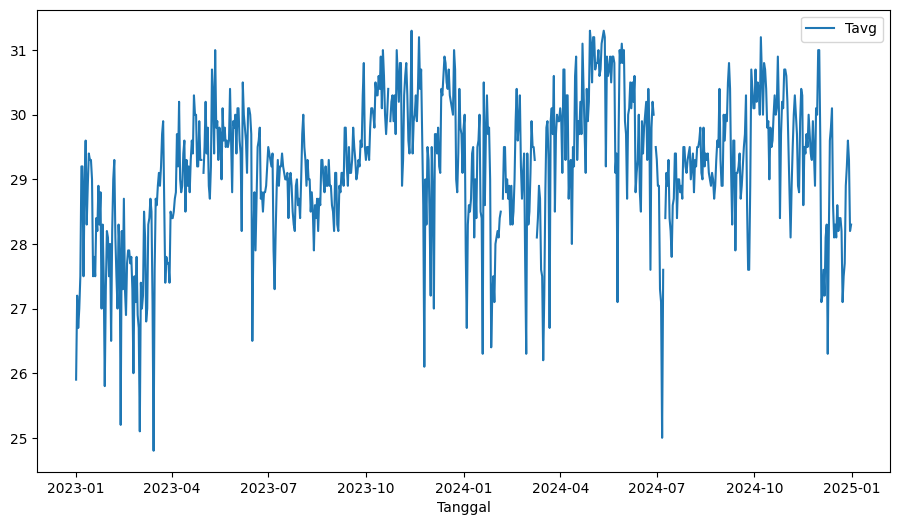

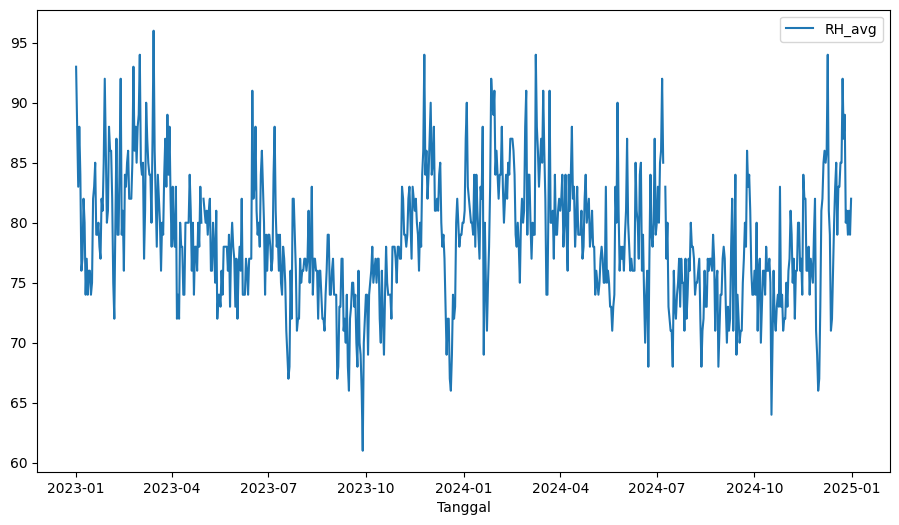

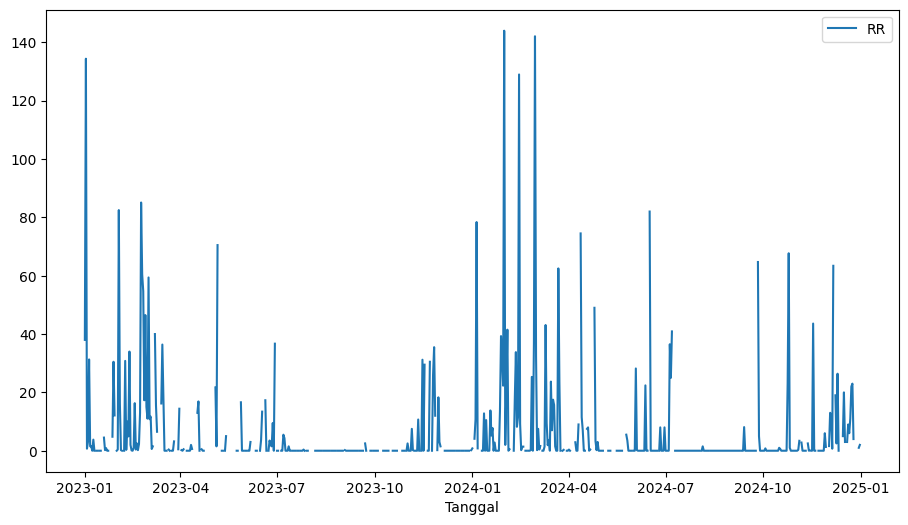

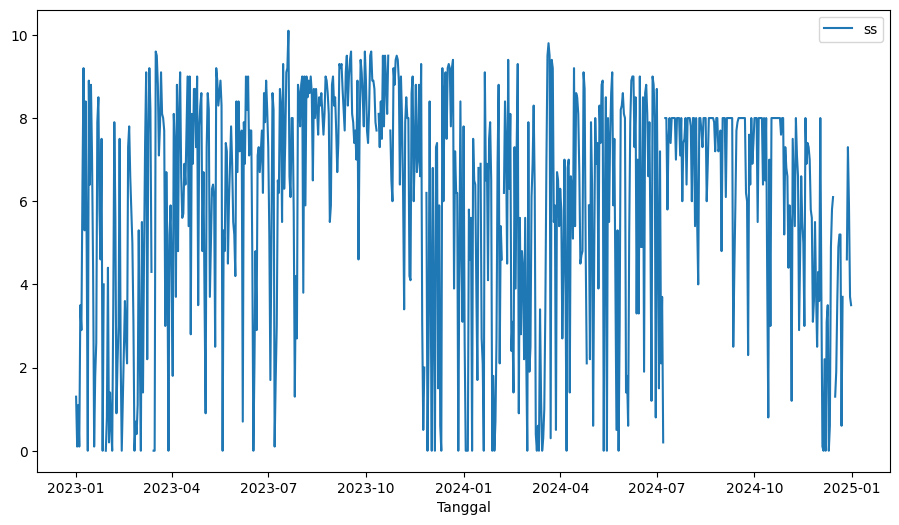

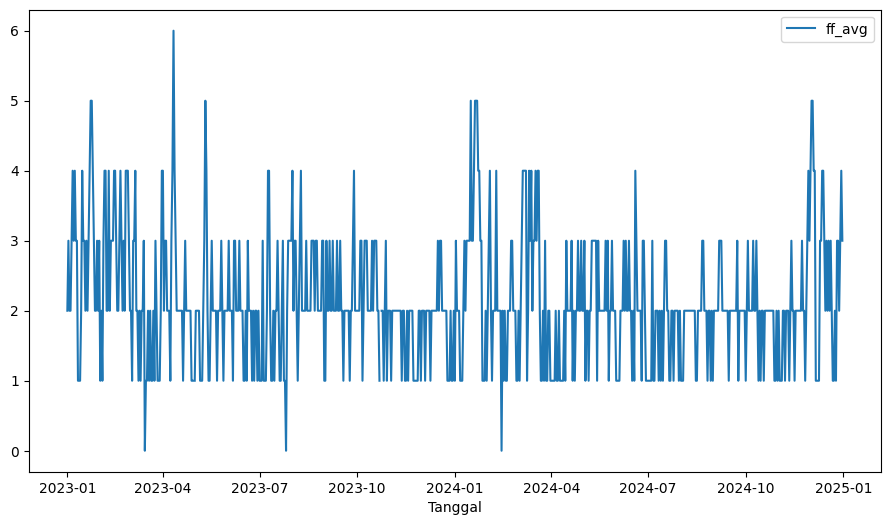

In [64]:
cuaca_tanjung_priok_processed.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

cuaca_tanjung_priok_processed.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

cuaca_tanjung_priok_processed.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

cuaca_tanjung_priok_processed.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

cuaca_tanjung_priok_processed.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

TRENDS
- Tavg has uptrend
- RH_avg in Tanjung Priok is more sideway (no trend)

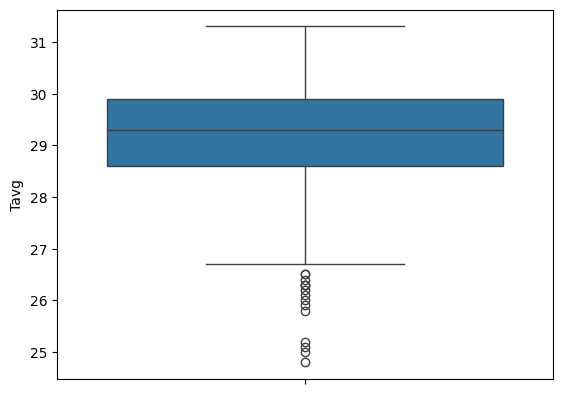

In [65]:
sns.boxplot(y=cuaca_tanjung_priok_processed['Tavg'])
plt.show()

Text(0, 0.5, 'counts')

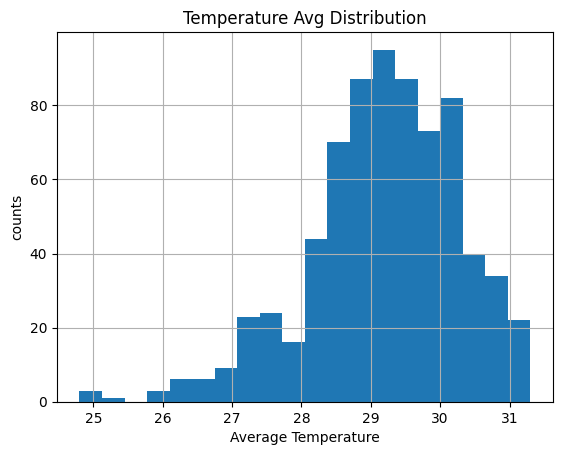

In [66]:
cuaca_tanjung_priok_processed['Tavg'].hist(bins = 20)
plt.title('Temperature Avg Distribution')
plt.xlabel('Average Temperature')
plt.ylabel('counts')

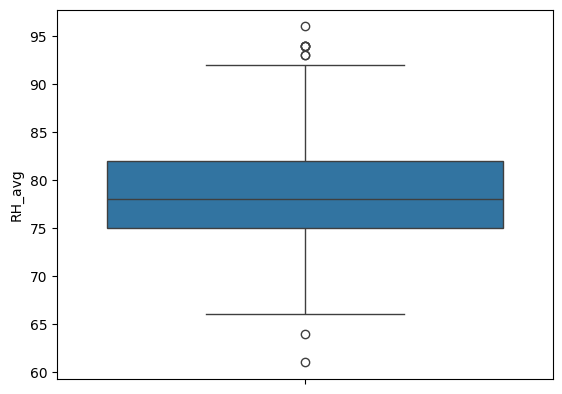

In [67]:
sns.boxplot(y=cuaca_tanjung_priok_processed['RH_avg'])
plt.show()

Text(0, 0.5, 'count')

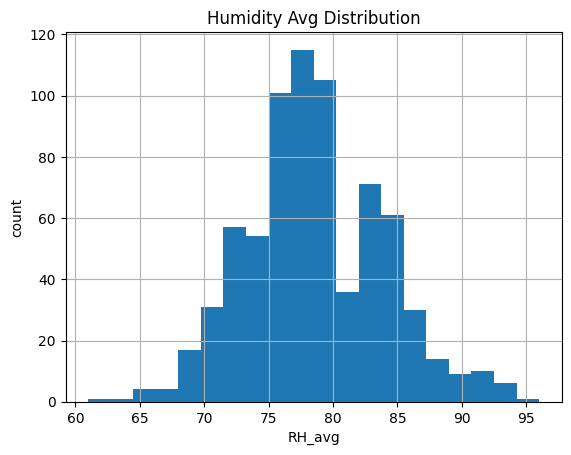

In [68]:
cuaca_tanjung_priok_processed['RH_avg'].hist(bins = 20)
plt.title('Humidity Avg Distribution')
plt.xlabel('RH_avg')
plt.ylabel('count')

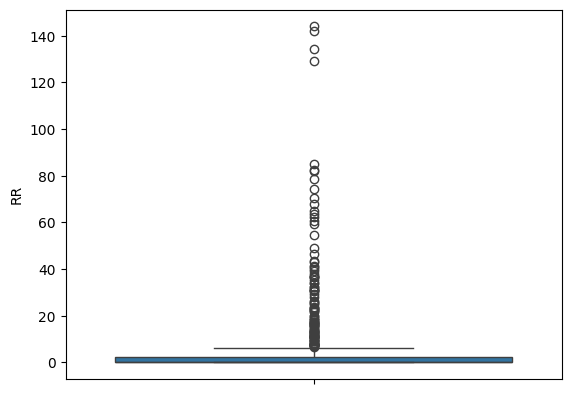

In [69]:
sns.boxplot(y=cuaca_tanjung_priok_processed['RR'])
plt.show()

Text(0, 0.5, 'count')

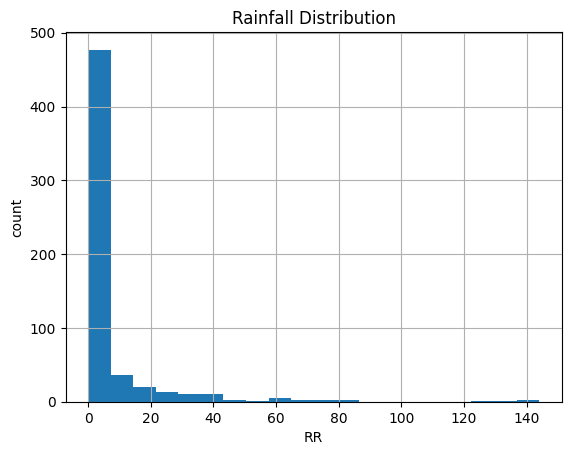

In [70]:
cuaca_tanjung_priok_processed['RR'].hist(bins = 20)
plt.title('Rainfall Distribution')
plt.xlabel('RR')
plt.ylabel('count')

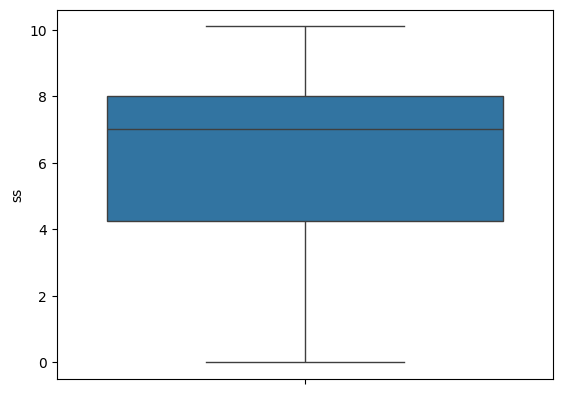

In [71]:
sns.boxplot(y=cuaca_tanjung_priok_processed['ss'])
plt.show()

Text(0, 0.5, 'count')

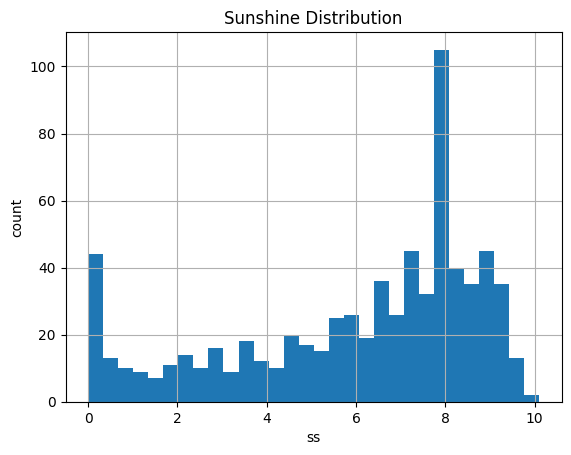

In [72]:
cuaca_tanjung_priok_processed['ss'].hist(bins = 30)
plt.title('Sunshine Distribution')
plt.xlabel('ss')
plt.ylabel('count')

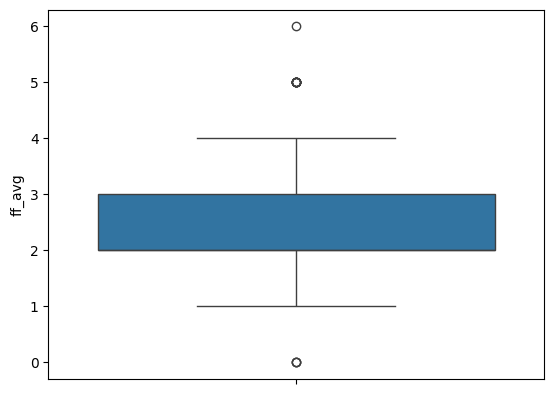

In [73]:
sns.boxplot(y=cuaca_tanjung_priok_processed['ff_avg'])
plt.show()

Text(0, 0.5, 'count')

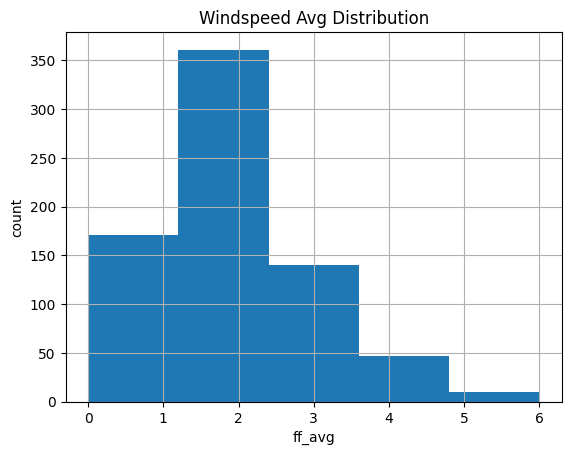

In [74]:
cuaca_tanjung_priok_processed['ff_avg'].hist(bins = 5)
plt.title('Windspeed Avg Distribution')
plt.xlabel('ff_avg')
plt.ylabel('count')

DISTRIBUTIONS
- Tavg menyerupai normal distribution namun lebih right skew dari Kemayoran
- RH_avg hampir menyerupai normal distribution
- sunshine lebih memiliki bentuk namun tetap tidak menyerupai normal distribution

#### EDA Bivariate

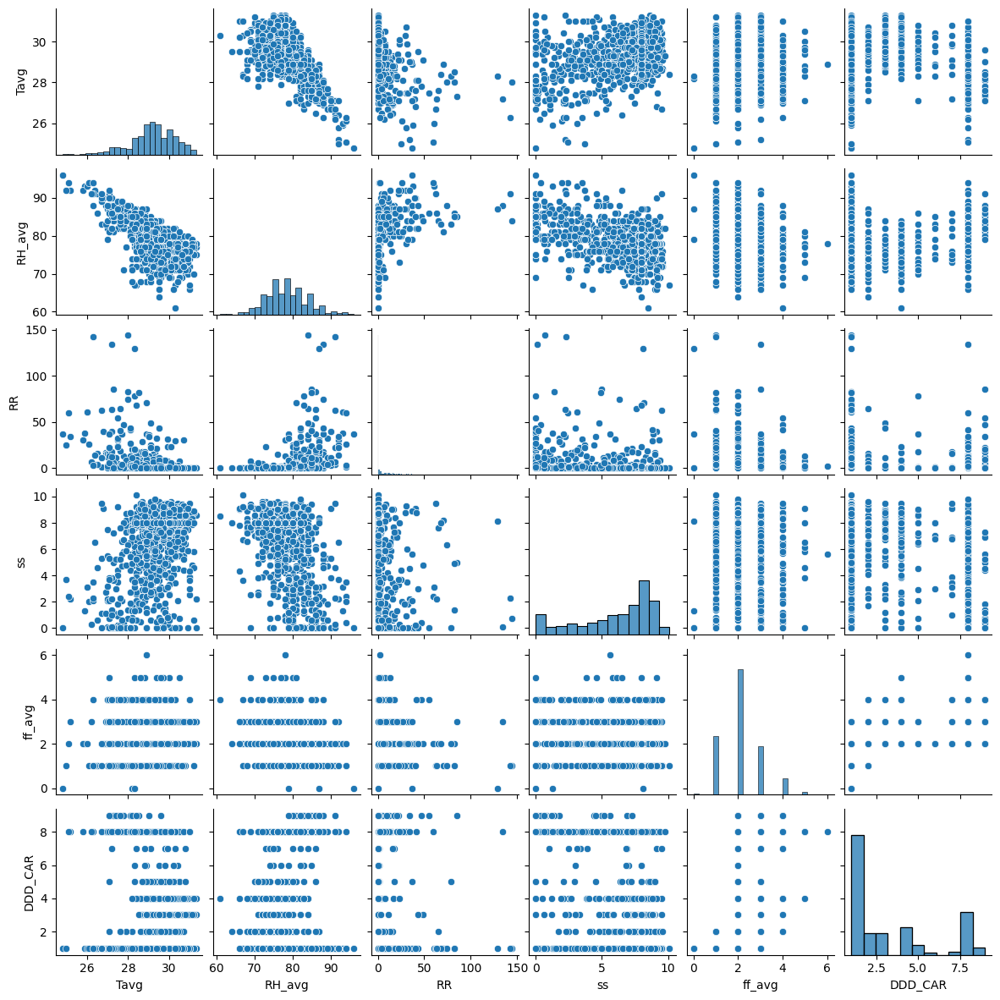

In [75]:
sns.pairplot(cuaca_tanjung_priok_processed, height=2)

Temperature wise
- LOWER Temperature - HIGHER Humidity
- no trend in Temperature & Rainfall
- no trend in Temperature & Sunshine

Humidity wise
- HIGHER Humidity - cenderung HIGHER Rainfall
- ada sedikir kecenderungan LOWER RH_avg membuat HIGHER Sunshine

Else is hard to see the correlation

#### Impute Data

In [76]:
cuaca_tanjung_priok_processed.index[0]

datetime.date(2023, 1, 1)

In [77]:
cuaca_tanjung_priok_processed

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
Tanggal,,,,,,
2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...
2024-12-27,29.2,81.0,NaN,4.6,3.0,8.0
2024-12-28,29.6,79.0,NaN,7.3,2.0,9.0
2024-12-29,29.3,81.0,NaN,5.9,3.0,8.0


In [78]:
# KNN
imputer = KNNImputer()
imputed_cuaca_tanjung_priok = pd.concat(
  [
    pd.DataFrame({
      'Tanggal': cuaca_tanjung_priok['Tanggal']
    }),
    pd.DataFrame(imputer.fit_transform(cuaca_tanjung_priok_processed),columns = ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR'])
  ], axis=1
)

In [79]:
imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].round(1)
imputed_cuaca_tanjung_priok[['RH_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['RH_avg', 'DDD_CAR']].round(0)

In [80]:
imputed_cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
1,2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2,2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
3,2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
4,2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,81.0,11.1,4.6,3.0,8.0
727,2024-12-28,29.6,79.0,0.0,7.3,2.0,9.0
728,2024-12-29,29.3,81.0,7.7,5.9,3.0,8.0
729,2024-12-30,28.2,79.0,1.0,3.7,4.0,8.0


In [81]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_tanjung_priok where Tanggal in ('2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-21,30.0,75.0,0.0,8.1,2.0,3.0
1,2023-10-22,30.4,74.0,0.0,9.5,1.0,1.0
2,2023-10-23,29.2,78.0,6.1,6.0,2.1,3.0
3,2023-10-24,29.9,74.0,0.0,7.7,2.0,4.0
4,2023-10-25,30.2,72.0,0.0,6.5,2.0,5.0


In [82]:
# Linear Interpolation
imputed_cuaca_tanjung_priok.loc[imputed_cuaca_tanjung_priok['Tanggal'] == datetime.strptime('23-10-2023', '%d-%m-%Y').date(), ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = np.nan
imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].interpolate(method ='linear', limit_direction ='forward')

In [83]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_tanjung_priok where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.70,78.0,0.0,8.9,2.0,1.0
1,2023-10-21,30.00,75.0,0.0,8.1,2.0,3.0
2,2023-10-22,30.40,74.0,0.0,9.5,1.0,1.0
3,2023-10-23,30.15,74.0,0.0,8.6,1.5,2.5
4,2023-10-24,29.90,74.0,0.0,7.7,2.0,4.0
5,2023-10-25,30.20,72.0,0.0,6.5,2.0,5.0
6,2023-10-26,30.30,78.0,0.0,6.0,1.0,1.0


In [84]:
imputed_cuaca_tanjung_priok.loc[imputed_cuaca_tanjung_priok['ff_avg'] <= 2]

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
2,2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
3,2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
10,2023-01-11,28.3,77.0,0.1,4.8,1.0,1.0
11,2023-01-12,28.9,74.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...
721,2024-12-22,28.2,85.0,11.0,0.6,1.0,1.0
722,2024-12-23,27.1,92.0,22.0,3.7,1.0,1.0
723,2024-12-24,27.5,87.0,23.0,3.7,2.0,8.0
724,2024-12-25,27.7,89.0,4.0,0.6,1.0,1.0


#### EDA After Cleaning

In [85]:
imputed_cuaca_tanjung_priok.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,29.185157,78.514364,5.770041,5.994118,2.123256,3.242818
std,1.080830,5.326928,15.608431,2.774775,0.902284,2.767015
min,24.800000,61.000000,0.000000,0.000000,0.000000,1.000000
25%,28.600000,75.000000,0.000000,4.200000,2.000000,1.000000
50%,29.300000,78.000000,0.000000,6.900000,2.000000,2.000000
75%,29.900000,82.000000,3.400000,8.000000,3.000000,5.000000
max,31.300000,96.000000,144.000000,10.100000,6.000000,9.000000


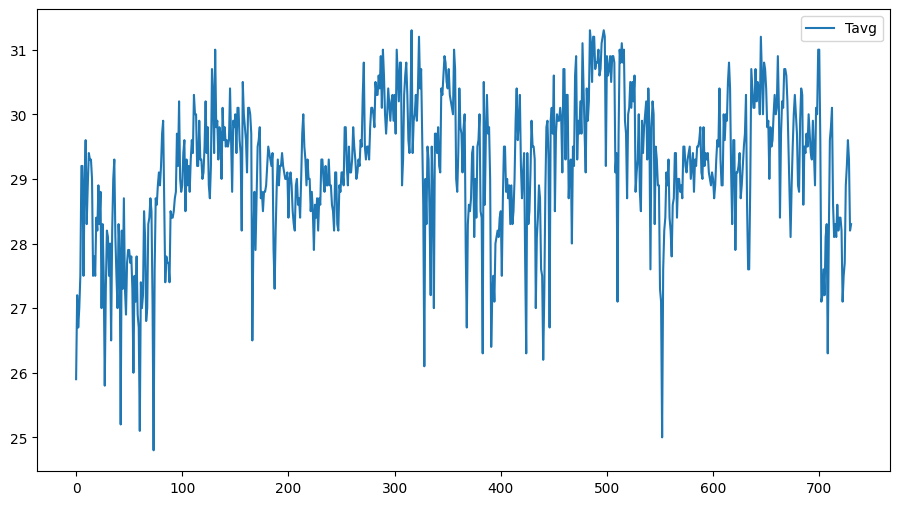

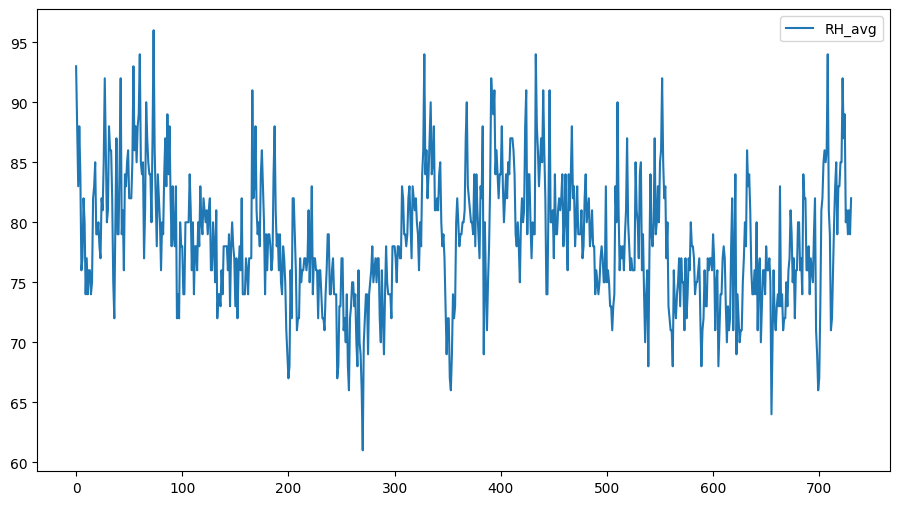

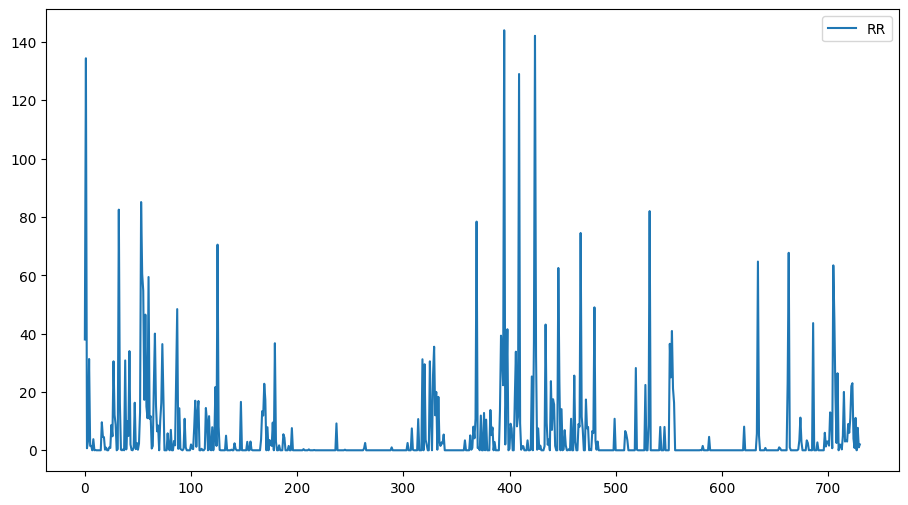

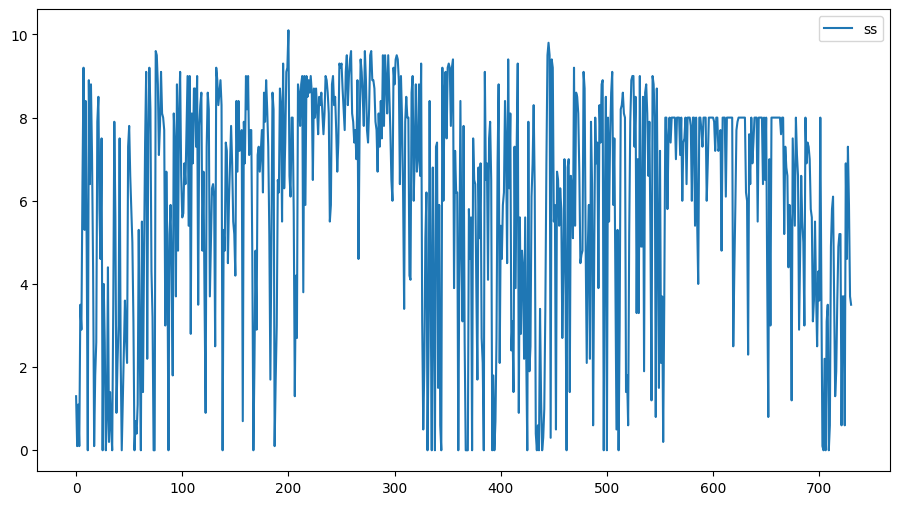

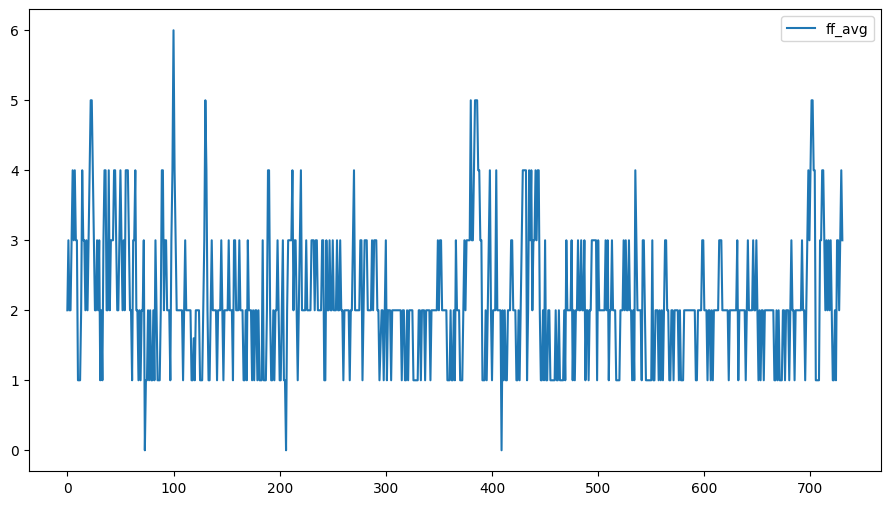

In [86]:
imputed_cuaca_tanjung_priok.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

imputed_cuaca_tanjung_priok.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

imputed_cuaca_tanjung_priok.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

imputed_cuaca_tanjung_priok.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

imputed_cuaca_tanjung_priok.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

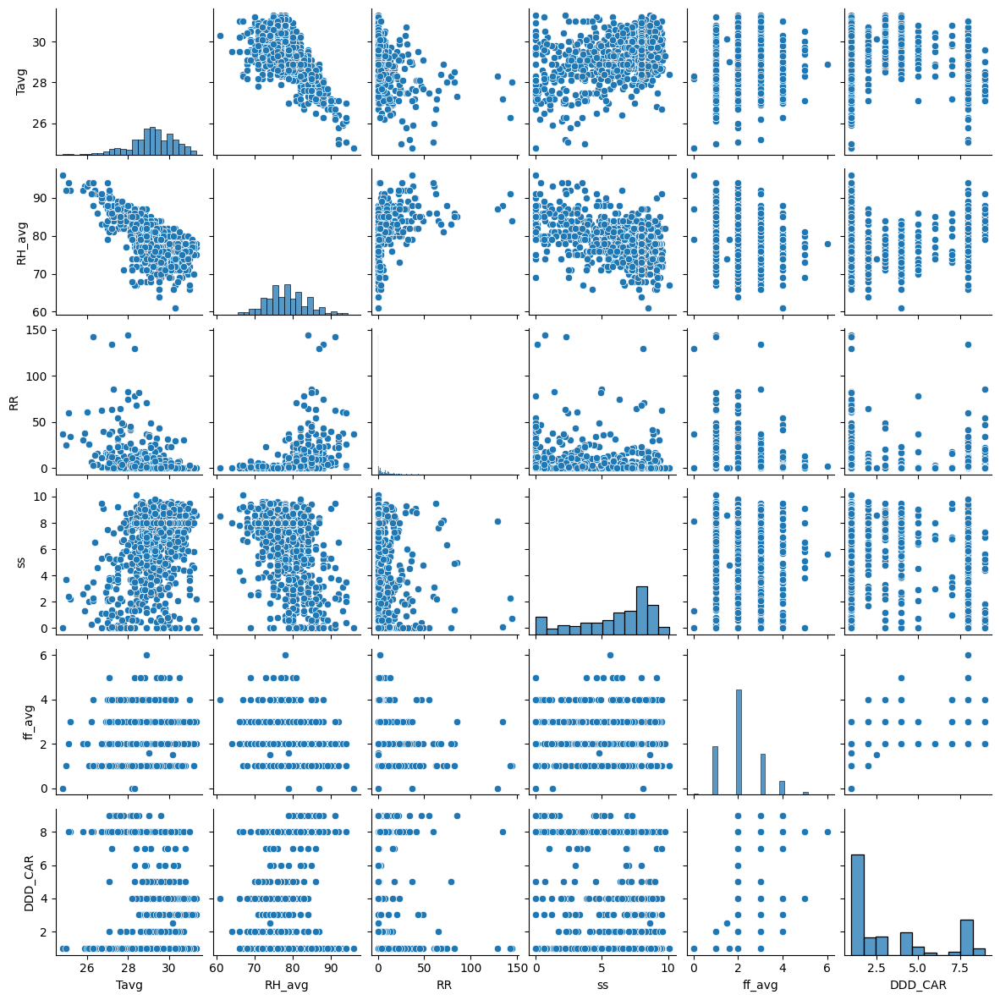

In [87]:
sns.pairplot(imputed_cuaca_tanjung_priok, height=2)

perubahan paling signifikan hanya dialami Rainfall, karena jumlah nullnya paling banyak (see .describe()). namun tetap tidak ada perubahan tren yang bermakna

### Summary EDA Data Cuaca

In [88]:
pysqldf(""" select 
        'Tanjung Priok' as Stasiun,
        count(*) as "Rows contain null"
        from cuaca_tanjung_priok 
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
        UNION
        select 
        'Kemayoran' as Stasiun,
        count(*) 
        from cuaca_kemayoran
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,Stasiun,Rows contain null
0,Kemayoran,200
1,Tanjung Priok,156


**TRENDS**

*Kemayoran*:
- Tavg
    - memiliki trend menaik dari awal ke akhir 2023, lalu 2024 tidak ada tren
    - secara keseluruhan terdapat musiman sekitar 5-6 bulan sekali dari 2023-2024
- RH_avg
    - tidak ada trend
    - terdapat musiman yang terjadi sekitar 1 tahun sekali. RH akan tinggi pada awal dan akhir tahun, lalu menurun pada pertengahan tahun
- RR
    - tidak ada trend
    - seasonality: curah hujan yang menaik saat menjelang akhir tahun dan baru menurun saat menjelang pertengahan tahun

    -> ini mengikuti pola musim hujan dan kemarau tahunan indonesia
- SS
    - tidak ada tren
    - sulit untuk melihat seasonality, namun cenderung intensitas matahari lebih tinggi di bulan 10
- ff_avg
    - tidak ada tren
    - rata-rata ff_avg 1-2 m/s

*Tanjung Priok*:
- Tavg semakin naik
- RH_avg no trend

**DISTRIBUTIONS**

*Kemayoran*:
- Tavg: mempunyai bentuk distribusi normal yang right skew
- RH_avg mempunyai bentuk distribusi normal yang hampir sempurna
- RR: sangat left skew, artinya curah hujan lebih sering rendah
- ss: tidak dapat ditentukan
- ff_avg: dominan dengan kecepatan 1

*Tanjung Priok*:
- Tavg menyerupai normal distribution namun lebih right skew dari Kemayoran
- RH_avg hampir menyerupai normal distribution
- sunshine lebih memiliki bentuk namun tetap tidak menyerupai normal distribution

**CORRELATIONS**

*Kemayoran*
1. Temperature
    - HIGHER Humidity - LOWER Temperature
    - HIGHER Rainfall - cenderung LOWER Temperature
    - HIGHER Sunshine - cendurung HIGHER Temperature
2. Humidity
    - HIGHER Rainfall - cenderung HIGHER Humidity
    - LOWER sunshine - cenderung HIGHER Humidity

*Tanjung Priok*
1. Temperature
    - LOWER Temperature - HIGHER Humidity
    - no trend in Temperature & Rainfall
    - no trend in Temperature & Sunshine
2. Humidity
    - HIGHER Humidity - cenderung HIGHER Rainfall
    - ada sedikir kecenderungan LOWER RH_avg membuat HIGHER Sunshine


**Missing Value Summary (Kemayoran & Tanjung Priok)**

**Kemayoran**
- total row: 1440
- rows contain null: 434
- 30.14% data null

List of Missing Values:
  - Tavg: 8888, blank
  - RH_avg: blank
  - RR: 8888, blank
  - ss: blank
  - ff_avg: blank
  - ddd_car: blank

**Tanjung Priok**
- total row: 1440
- rows contain null: 305
- 21.18% data null

List of Missing Values:
- Tavg: blank
- RH_avg: blank
- RR: 8888, blank
- ss: blank
- ff_avg: blank
- ddd_car: blank 

After Cleaning & Preprocessing

Tanjung Priok: Rainfall menjadi kolom dengan jumlah imputasi paling banyak (300) data, namun tetap tidak terlihat perubahan yang berarti

### Menggabung Stasiun Kemayoran & Tanjung Priok

In [89]:
imputed_cuaca_kemayoran = imputed_cuaca_kemayoran.rename(columns={
  'Tavg': 'Tavg_km',
  'RH_avg': 'RH_avg_km',
  'RR': 'RR_km',
  'ss': 'ss_km',
  'ff_avg': 'ff_avg_km',
  'DDD_CAR': 'DDD_CAR_km'
})

imputed_cuaca_kemayoran = imputed_cuaca_kemayoran.set_index('Tanggal')
imputed_cuaca_kemayoran

,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km
Tanggal,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0
2023-01-04,26.4,86.0,2.4,2.1,1.0,1.0
2023-01-05,27.4,83.0,35.3,4.9,2.0,1.0
...,...,...,...,...,...,...
2024-12-27,29.2,78.0,7.5,1.2,2.0,1.0
2024-12-28,30.0,70.0,0.6,3.8,2.0,1.0
2024-12-29,29.7,73.0,0.0,3.0,1.0,1.0


In [90]:
imputed_cuaca_tanjung_priok = imputed_cuaca_tanjung_priok.rename(columns={
  'Tavg': 'Tavg_tp',
  'RH_avg': 'RH_avg_tp',
  'RR': 'RR_tp',
  'ss': 'ss_tp',
  'ff_avg': 'ff_avg_tp',
  'DDD_CAR': 'DDD_CAR_tp'
})
imputed_cuaca_tanjung_priok = imputed_cuaca_tanjung_priok.set_index('Tanggal')
imputed_cuaca_tanjung_priok

,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
Tanggal,,,,,,
2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...
2024-12-27,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,29.3,81.0,7.7,5.9,3.0,8.0


In [91]:
data_meteorologi = imputed_cuaca_kemayoran.join(imputed_cuaca_tanjung_priok)
data_meteorologi

,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
Tanggal,,,,,,,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


## Data Polutan

### Penyamaan Kolom

#### Polutan 1 (tahun 2021)

In [92]:
# polutan_1 = polutan_1.rename(columns={'categori': 'kategori'})

#### Polutan 2 (tahun 2022)

In [93]:
# polutan_2 = polutan_2.rename(columns={
#   'pm_duakomalima': 'pm25',
#   'categori': 'kategori'
# })

#### Polutan 3 (tahun 2023)

In [94]:
polutan_3 = polutan_3.rename(columns={
  'pm_sepuluh': 'pm10',
  'pm_duakomalima': 'pm25',
  'sulfur_dioksida': 'so2',
  'karbon_monoksida': 'co',
  'ozon': 'o3',
  'nitrogen_dioksida': 'no2'
})

In [95]:
polutan_3

,periode_data,tanggal,stasiun,pm10,pm25,so2,co,o3,no2,max,critical,kategori
0,202301,01/01/2023,DKI1,44,55,47,10,24,9,55,PM25,SEDANG
1,202301,01/01/2023,DKI2,44,61,56,16,20,19,61,PM25,SEDANG
2,202301,01/01/2023,DKI3,26,43,51,5,16,2,51,SO2,SEDANG
3,202301,01/01/2023,DKI4,23,57,-,-,-,-,57,PM25,SEDANG
4,202301,01/01/2023,DKI5,30,-,21,13,14,1,52,PM10,SEDANG
...,...,...,...,...,...,...,...,...,...,...,...,...
1820,202312,31/12/2023,DKI1,54,68,49,11,19,12,68,PM25,SEDANG
1821,202312,31/12/2023,DKI2,47,58,56,21,23,24,58,PM25,SEDANG
1822,202312,31/12/2023,DKI3,48,49,-,24,14,-,49,PM25,BAIK
1823,202312,31/12/2023,DKI4,49,73,-,-,-,-,73,PM25,SEDANG


#### Polutan 4 (tahun 2024)

In [96]:
polutan_4 = polutan_4.rename(columns={
  'pm_sepuluh': 'pm10',
  'pm_duakomalima': 'pm25',
  'sulfur_dioksida': 'so2',
  'karbon_monoksida': 'co',
  'ozon': 'o3',
  'nitrogen_dioksida': 'no2'
})

In [97]:
polutan_4['tanggal_2'] = polutan_4['tanggal'].astype('str') + '/' + polutan_4['bulan'].astype('str') + '/' + '2024'

In [98]:
polutan_4.insert(1, 'tanggal_3', polutan_4['tanggal_2'])

In [99]:
polutan_4.pop('bulan')
polutan_4.pop('tanggal')
polutan_4.pop('tanggal_2')

0        21/1/2024
1        22/1/2024
2        23/1/2024
3        24/1/2024
4        25/1/2024
           ...    
1825    27/12/2024
1826    28/12/2024
1827    29/12/2024
1828    30/12/2024
1829    31/12/2024
Name: tanggal_2, Length: 1830, dtype: object

In [100]:
polutan_4 = polutan_4.rename(columns=({'tanggal_3': 'tanggal'}))

In [101]:
polutan_4

,periode_data,tanggal,stasiun,pm10,pm25,so2,co,o3,no2,max,critical,kategori
0,202401,21/1/2024,DKI3,51.0,65.0,45.0,9.0,8.0,79.0,79.0,NaN,SEDANG
1,202401,22/1/2024,DKI3,27.0,34.0,45.0,5.0,8.0,56.0,56.0,NaN,SEDANG
2,202401,23/1/2024,DKI3,NaN,52.0,46.0,6.0,9.0,51.0,52.0,PM25,SEDANG
3,202401,24/1/2024,DKI3,46.0,65.0,46.0,8.0,9.0,38.0,65.0,PM25,SEDANG
4,202401,25/1/2024,DKI3,37.0,55.0,47.0,7.0,11.0,28.0,55.0,PM25,SEDANG
...,...,...,...,...,...,...,...,...,...,...,...,...
1825,202412,27/12/2024,DKI5,NaN,55.0,27.0,9.0,30.0,12.0,55.0,PM25,SEDANG
1826,202412,28/12/2024,DKI5,NaN,40.0,26.0,6.0,30.0,12.0,40.0,PM25,BAIK
1827,202412,29/12/2024,DKI5,NaN,51.0,32.0,8.0,28.0,11.0,51.0,PM25,SEDANG
1828,202412,30/12/2024,DKI5,NaN,34.0,9.0,5.0,38.0,8.0,38.0,O3,BAIK


### Penggabungan Data 2023-2024

In [102]:
merge_polutan = pd.concat([polutan_3, polutan_4], ignore_index=True,axis=0)

In [103]:
merge_polutan.pop('periode_data')
merge_polutan.pop('max')
merge_polutan.pop('critical')
merge_polutan.pop('kategori')

0       SEDANG
1       SEDANG
2       SEDANG
3       SEDANG
4       SEDANG
         ...  
3650    SEDANG
3651      BAIK
3652    SEDANG
3653      BAIK
3654      BAIK
Name: kategori, Length: 3655, dtype: object

In [104]:
merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,01/01/2023,DKI1,44,55,47,10,24,9
1,01/01/2023,DKI2,44,61,56,16,20,19
2,01/01/2023,DKI3,26,43,51,5,16,2
3,01/01/2023,DKI4,23,57,-,-,-,-
4,01/01/2023,DKI5,30,-,21,13,14,1
...,...,...,...,...,...,...,...,...
3650,27/12/2024,DKI5,NaN,55.0,27.0,9.0,30.0,12.0
3651,28/12/2024,DKI5,NaN,40.0,26.0,6.0,30.0,12.0
3652,29/12/2024,DKI5,NaN,51.0,32.0,8.0,28.0,11.0
3653,30/12/2024,DKI5,NaN,34.0,9.0,5.0,38.0,8.0


### Data Understanding

- Check data after merged
- find the Non-NaN empty values
- formatting data

In [105]:
merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3655 entries, 0 to 3654
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   tanggal  3655 non-null   object
 1   stasiun  3655 non-null   object
 2   pm10     3543 non-null   object
 3   pm25     3635 non-null   object
 4   so2      3646 non-null   object
 5   co       3643 non-null   object
 6   o3       3646 non-null   object
 7   no2      3629 non-null   object
dtypes: object(8)
memory usage: 228.6+ KB


In [106]:
merge_polutan.describe()

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
count,3655,3655,3543,3635,3646.0,3643,3646,3629
unique,731,5,170,252,121.0,94,152,139
top,31/12/2024,DKI1,-,-,54.0,10,21,16
freq,5,731,222,295,116.0,147,81,90


In [107]:
merge_polutan['tanggal'] = pd.to_datetime(merge_polutan['tanggal'], format = '%d/%m/%Y')

In [108]:
merge_polutan = merge_polutan.sort_values(by='tanggal', ignore_index=True)

#### PM10

In [109]:
# Checking Non-NaN empty values (unique values)
pm10_uv = pysqldf(""" select distinct pm10 from merge_polutan where pm10 not like '%.0' """)

pm10_uv[~pm10_uv['pm10'].astype(str).str.isnumeric()]

# THERE IS None TOO

,pm10
25,-


#### PM2.5

In [110]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct pm25 from merge_polutan where pm25 like '%.%' order by pm25 """)['pm25'].values
pm25_uv = pysqldf(""" select distinct pm25 from merge_polutan where pm25 not like '%.0' order by pm25""") # not float
pm25_uv[~pm25_uv['pm25'].astype(str).str.isnumeric()]

# THERE IS None TOO

,pm25
0,-


#### SO2

In [111]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct so2 from merge_polutan where so2 like '%.%' order by so2 """)['so2'].values
so2_uv = pysqldf(""" select distinct so2 from merge_polutan where so2 not like '%.0' order by so2""") # not float
so2_uv[~so2_uv['so2'].astype(str).str.isnumeric()]

# THERE IS None TOO

,so2
0,-


#### CO

In [112]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct co from merge_polutan where co like '%.%' order by co """)['co'].values
co_uv = pysqldf(""" select distinct co from merge_polutan where co not like '%.0' order by co""") # not float
co_uv[~co_uv['co'].astype(str).str.isnumeric()]

# THERE IS None TOO

,co
0,-
1,---


#### O3

In [113]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct o3 from merge_polutan where o3 like '%.%' order by o3 """)['o3'].values
o3_uv = pysqldf(""" select distinct o3 from merge_polutan where o3 not like '%.0' order by o3""") # not float
o3_uv[~o3_uv['o3'].astype(str).str.isnumeric()]

# THERE IS None TOO

,o3
0,-
1,---


In [114]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct no2 from merge_polutan where no2 like '%.%' order by no2 """)['no2'].values
no2_uv = pysqldf(""" select distinct no2 from merge_polutan where no2 not like '%.0' order by no2""") # not float
no2_uv[~no2_uv['no2'].astype(str).str.isnumeric()]

# THERE IS None TOO

,no2
0,-


### Check Missing Values Pada Penggabungan Data 2021-2024

1. pm10: '-', '---', blank
2. pm25: '-', '---', blank
3. so2: '-', '---', blank
4. co: '-', '---', blank
5. o3: '-', '---', blank
6. no2: '-', '---', blank


Missing Values Pada Penggabungan Data 2023-2024

1. pm10: '-', blank
2. pm25: '-', blank
3. so2: '-', blank
4. co: '-', '---', blank
5. o3: '-', '---', blank
6. no2: '-', blank


missing values akan diubah ke dalamn NaN

In [115]:
merge_polutan = merge_polutan.replace(['-', '---'], np.nan)

In [116]:
for col in ['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']:
  merge_polutan[col] = merge_polutan[col].astype(float)

In [117]:
merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01,DKI1,44.0,55.0,47.0,10.0,24.0,9.0
1,2023-01-01,DKI2,44.0,61.0,56.0,16.0,20.0,19.0
2,2023-01-01,DKI3,26.0,43.0,51.0,5.0,16.0,2.0
3,2023-01-01,DKI4,23.0,57.0,NaN,NaN,NaN,NaN
4,2023-01-01,DKI5,30.0,NaN,21.0,13.0,14.0,1.0
...,...,...,...,...,...,...,...,...
3650,2024-12-31,DKI1,29.0,11.0,6.0,13.0,10.0,18.0
3651,2024-12-31,DKI3,29.0,11.0,6.0,13.0,10.0,18.0
3652,2024-12-31,DKI4,27.0,15.0,21.0,6.0,18.0,8.0
3653,2024-12-31,DKI2,29.0,35.0,22.0,11.0,12.0,13.0


In [118]:
# data yang mengandung null values
null_merge_polutan = merge_polutan[merge_polutan.isnull().any(axis=1)]
null_merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
3,2023-01-01,DKI4,23.0,57.0,NaN,NaN,NaN,NaN
4,2023-01-01,DKI5,30.0,NaN,21.0,13.0,14.0,1.0
5,2023-01-02,DKI5,25.0,NaN,30.0,13.0,16.0,2.0
12,2023-01-03,DKI3,25.0,32.0,53.0,4.0,15.0,NaN
14,2023-01-03,DKI5,22.0,NaN,28.0,11.0,15.0,NaN
...,...,...,...,...,...,...,...,...
3630,2024-12-27,DKI5,NaN,55.0,27.0,9.0,30.0,12.0
3635,2024-12-28,DKI5,NaN,40.0,26.0,6.0,30.0,12.0
3641,2024-12-29,DKI5,NaN,51.0,32.0,8.0,28.0,11.0
3646,2024-12-30,DKI5,NaN,34.0,9.0,5.0,38.0,8.0


In [119]:
count_null_merge_polutan = pysqldf(
"""
  select 
    stasiun, 
    sum(case when pm10 is null then 1 else 0 end) as pm10,
    sum(case when pm25 is null then 1 else 0 end) as pm25,
    sum(case when so2 is null then 1 else 0 end) as so2,
    sum(case when co is null then 1 else 0 end) as co,
    sum(case when o3 is null then 1 else 0 end) as o3,
    sum(case when no2 is null then 1 else 0 end) as no2
  from null_merge_polutan
  group by stasiun
"""
)
count_null_merge_polutan

,stasiun,pm10,pm25,so2,co,o3,no2
0,DKI1,4,7,9,17,5,4
1,DKI2,13,4,11,4,4,14
2,DKI3,17,15,6,7,7,24
3,DKI4,216,14,14,18,13,12
4,DKI5,84,275,8,10,9,38


<Axes: xlabel='stasiun'>

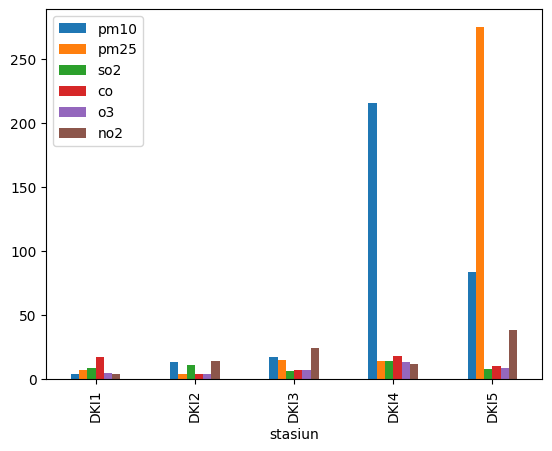

In [120]:
# see null count of every observed pollutant by each region
count_null_merge_polutan.plot(
  x='stasiun',
  kind='bar',
  stacked=False
)

**2023-2024, Missing Values Percentage: 17,88%**

3350 total rows

599 rows contain nulls

**dibawah ini adalah 2023-2024**

current total data: 5175

total rows with missing data: 906

17.55% baris data contains missing value

42 baris data Missing Completely At Random (MCAR)

**2023-2024, Missing Values Percentage: 18,91%**

3655 total rows

691 rows contain nulls

26 baris data Missing Completely At Random (MCAR)

In [121]:
# data polutan yang semua perhitungan kosong
null_rows = pysqldf(""" 
  select *
  from null_merge_polutan 
  where 
  pm10 is null and
  pm25 is null and
  so2 is null and
  co is null and
  o3 is null and
  no2 is null
""")
null_rows

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-11 00:00:00.000000,DKI3,None,None,None,None,None,None
1,2023-01-16 00:00:00.000000,DKI4,None,None,None,None,None,None
2,2023-02-08 00:00:00.000000,DKI3,None,None,None,None,None,None
3,2023-03-22 00:00:00.000000,DKI1,None,None,None,None,None,None
4,2023-03-23 00:00:00.000000,DKI1,None,None,None,None,None,None
5,2023-03-24 00:00:00.000000,DKI1,None,None,None,None,None,None
6,2023-04-01 00:00:00.000000,DKI5,None,None,None,None,None,None
7,2023-04-02 00:00:00.000000,DKI5,None,None,None,None,None,None
8,2023-04-03 00:00:00.000000,DKI5,None,None,None,None,None,None
9,2023-04-06 00:00:00.000000,DKI5,None,None,None,None,None,None


In [122]:
# melihat count baris kosong
null_row_plot = pysqldf(""" 
  select strftime('%Y', tanggal) as year,
    SUM(CASE WHEN stasiun = 'DKI1' THEN 1 ELSE 0 END) AS DKI1,
    SUM(CASE WHEN stasiun = 'DKI2' THEN 1 ELSE 0 END) AS DKI2,
    SUM(CASE WHEN stasiun = 'DKI3' THEN 1 ELSE 0 END) AS DKI3,
    SUM(CASE WHEN stasiun = 'DKI4' THEN 1 ELSE 0 END) AS DKI4,
    SUM(CASE WHEN stasiun = 'DKI5' THEN 1 ELSE 0 END) AS DKI5
  from null_merge_polutan 
  where 
  pm10 is null and
  pm25 is null and
  so2 is null and
  co is null and
  o3 is null and
  no2 is null
  group by strftime('%Y', tanggal)
  order by stasiun,
strftime('%Y', tanggal) asc
""")

null_row_plot

,year,DKI1,DKI2,DKI3,DKI4,DKI5
0,2024,0,1,1,4,0
1,2023,4,2,4,4,7


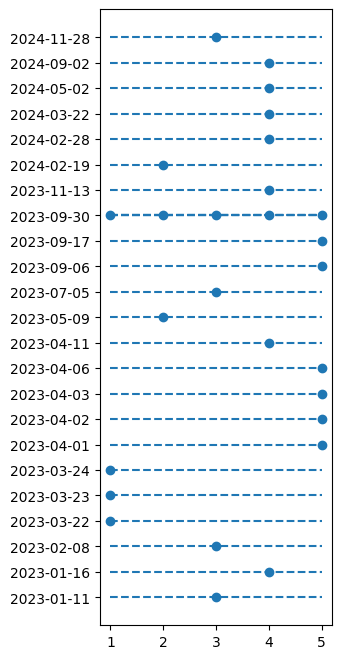

In [123]:
# melihat tanggal dari baris yg kosong

null_row_occurence = pysqldf(""" 
  select 
    substring(tanggal, 0, 11) as tanggal,
    case 
      when stasiun = 'DKI1' then 1
      when stasiun = 'DKI2' then 2
      when stasiun = 'DKI3' then 3
      when stasiun = 'DKI4' then 4
      when stasiun = 'DKI5' then 5             
    end as data
  from null_merge_polutan 
  where 
  pm10 is null and
  pm25 is null and
  so2 is null and
  co is null and
  o3 is null and
  no2 is null
  order by tanggal
""")

plt.figure(figsize=(3, 8))
plt.scatter(null_row_occurence['data'], null_row_occurence['tanggal'])
plt.hlines(y=null_row_occurence['tanggal'], xmax=5, xmin=1, linestyles='dashed')
# plt.xticks(rotation=90)

<Axes: xlabel='year'>

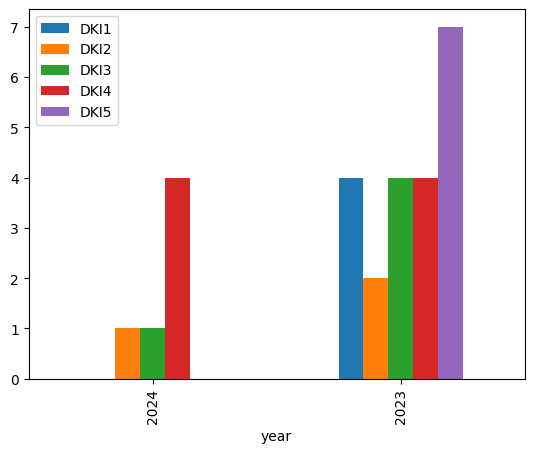

In [124]:
# see null ROW count of every observed pollutant by each region
null_row_plot.plot(
  x='year',
  kind='bar',
  stacked=False,
)

1. baris yg ga punya data samsek bisa 1 hari aja atau lebih
2. paling sering gada datanya samsek dari DKI4
3. anomali di 2023 september 30: tidak ada data pada kelima stasiun

rencana akan pake KNN or RF buat handle missing values

### Seperate Pollutant Data By stasiun

#### DKI1

In [125]:
merge_polutan_dki1 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI1'""")
merge_polutan_dki1

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI1,44.0,55.0,47.0,10.0,24.0,9.0
1,2023-01-02 00:00:00.000000,DKI1,32.0,43.0,52.0,9.0,24.0,8.0
2,2023-01-03 00:00:00.000000,DKI1,31.0,35.0,49.0,9.0,12.0,7.0
3,2023-01-04 00:00:00.000000,DKI1,30.0,47.0,53.0,11.0,15.0,9.0
4,2023-01-05 00:00:00.000000,DKI1,38.0,50.0,50.0,13.0,26.0,11.0
...,...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,DKI1,53.0,83.0,12.0,10.0,11.0,36.0
727,2024-12-28 00:00:00.000000,DKI1,64.0,101.0,14.0,9.0,11.0,35.0
728,2024-12-29 00:00:00.000000,DKI1,51.0,21.0,13.0,10.0,13.0,35.0
729,2024-12-30 00:00:00.000000,DKI1,35.0,10.0,13.0,5.0,12.0,13.0


In [126]:
merge_polutan_dki1 = merge_polutan_dki1.rename(columns={
  'pm10': 'pm10_dki1',
  'pm25': 'pm25_dki1',
  'so2': 'so2_dki1',
  'co': 'co_dki1',
  'o3': 'o3_dki1',
  'no2': 'no2_dki1'
})
merge_polutan_dki1.pop('stasiun')

0      DKI1
1      DKI1
2      DKI1
3      DKI1
4      DKI1
       ... 
726    DKI1
727    DKI1
728    DKI1
729    DKI1
730    DKI1
Name: stasiun, Length: 731, dtype: object

In [127]:
merge_polutan_dki1

,tanggal,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1
0,2023-01-01 00:00:00.000000,44.0,55.0,47.0,10.0,24.0,9.0
1,2023-01-02 00:00:00.000000,32.0,43.0,52.0,9.0,24.0,8.0
2,2023-01-03 00:00:00.000000,31.0,35.0,49.0,9.0,12.0,7.0
3,2023-01-04 00:00:00.000000,30.0,47.0,53.0,11.0,15.0,9.0
4,2023-01-05 00:00:00.000000,38.0,50.0,50.0,13.0,26.0,11.0
...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,53.0,83.0,12.0,10.0,11.0,36.0
727,2024-12-28 00:00:00.000000,64.0,101.0,14.0,9.0,11.0,35.0
728,2024-12-29 00:00:00.000000,51.0,21.0,13.0,10.0,13.0,35.0
729,2024-12-30 00:00:00.000000,35.0,10.0,13.0,5.0,12.0,13.0


#### DKI2

In [128]:
merge_polutan_dki2 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI2'""")
merge_polutan_dki2

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI2,44.0,61.0,56.0,16.0,20.0,19.0
1,2023-01-02 00:00:00.000000,DKI2,34.0,43.0,59.0,15.0,21.0,19.0
2,2023-01-03 00:00:00.000000,DKI2,28.0,34.0,57.0,13.0,21.0,16.0
3,2023-01-04 00:00:00.000000,DKI2,31.0,49.0,60.0,17.0,21.0,26.0
4,2023-01-05 00:00:00.000000,DKI2,37.0,53.0,57.0,26.0,21.0,35.0
...,...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,DKI2,41.0,55.0,24.0,15.0,12.0,11.0
727,2024-12-28 00:00:00.000000,DKI2,46.0,59.0,25.0,14.0,12.0,15.0
728,2024-12-29 00:00:00.000000,DKI2,49.0,61.0,26.0,13.0,14.0,12.0
729,2024-12-30 00:00:00.000000,DKI2,34.0,50.0,21.0,11.0,14.0,11.0


In [129]:
merge_polutan_dki2 = merge_polutan_dki2.rename(columns={
  'tanggal': 'tanggal_dki2',
  'pm10': 'pm10_dki2',
  'pm25': 'pm25_dki2',
  'so2': 'so2_dki2',
  'co': 'co_dki2',
  'o3': 'o3_dki2',
  'no2': 'no2_dki2'
})
merge_polutan_dki2.pop('stasiun')

0      DKI2
1      DKI2
2      DKI2
3      DKI2
4      DKI2
       ... 
726    DKI2
727    DKI2
728    DKI2
729    DKI2
730    DKI2
Name: stasiun, Length: 731, dtype: object

In [130]:
merge_polutan_dki2

,tanggal_dki2,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2
0,2023-01-01 00:00:00.000000,44.0,61.0,56.0,16.0,20.0,19.0
1,2023-01-02 00:00:00.000000,34.0,43.0,59.0,15.0,21.0,19.0
2,2023-01-03 00:00:00.000000,28.0,34.0,57.0,13.0,21.0,16.0
3,2023-01-04 00:00:00.000000,31.0,49.0,60.0,17.0,21.0,26.0
4,2023-01-05 00:00:00.000000,37.0,53.0,57.0,26.0,21.0,35.0
...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,41.0,55.0,24.0,15.0,12.0,11.0
727,2024-12-28 00:00:00.000000,46.0,59.0,25.0,14.0,12.0,15.0
728,2024-12-29 00:00:00.000000,49.0,61.0,26.0,13.0,14.0,12.0
729,2024-12-30 00:00:00.000000,34.0,50.0,21.0,11.0,14.0,11.0


#### DKI3

In [131]:
merge_polutan_dki3 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI3'""")
merge_polutan_dki3

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI3,26.0,43.0,51.0,5.0,16.0,2.0
1,2023-01-02 00:00:00.000000,DKI3,23.0,40.0,51.0,5.0,16.0,3.0
2,2023-01-03 00:00:00.000000,DKI3,25.0,32.0,53.0,4.0,15.0,NaN
3,2023-01-04 00:00:00.000000,DKI3,30.0,44.0,53.0,5.0,15.0,4.0
4,2023-01-05 00:00:00.000000,DKI3,40.0,59.0,53.0,10.0,18.0,7.0
...,...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,DKI3,53.0,83.0,12.0,10.0,11.0,36.0
727,2024-12-28 00:00:00.000000,DKI3,64.0,101.0,14.0,9.0,11.0,35.0
728,2024-12-29 00:00:00.000000,DKI3,51.0,21.0,13.0,10.0,13.0,35.0
729,2024-12-30 00:00:00.000000,DKI3,35.0,10.0,13.0,5.0,12.0,13.0


In [132]:
merge_polutan_dki3 = merge_polutan_dki3.rename(columns={
  'tanggal': 'tanggal_dki3',
  'pm10': 'pm10_dki3',
  'pm25': 'pm25_dki3',
  'so2': 'so2_dki3',
  'co': 'co_dki3',
  'o3': 'o3_dki3',
  'no2': 'no2_dki3'
})
merge_polutan_dki3.pop('stasiun')

0      DKI3
1      DKI3
2      DKI3
3      DKI3
4      DKI3
       ... 
726    DKI3
727    DKI3
728    DKI3
729    DKI3
730    DKI3
Name: stasiun, Length: 731, dtype: object

In [133]:
merge_polutan_dki3

,tanggal_dki3,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3
0,2023-01-01 00:00:00.000000,26.0,43.0,51.0,5.0,16.0,2.0
1,2023-01-02 00:00:00.000000,23.0,40.0,51.0,5.0,16.0,3.0
2,2023-01-03 00:00:00.000000,25.0,32.0,53.0,4.0,15.0,NaN
3,2023-01-04 00:00:00.000000,30.0,44.0,53.0,5.0,15.0,4.0
4,2023-01-05 00:00:00.000000,40.0,59.0,53.0,10.0,18.0,7.0
...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,53.0,83.0,12.0,10.0,11.0,36.0
727,2024-12-28 00:00:00.000000,64.0,101.0,14.0,9.0,11.0,35.0
728,2024-12-29 00:00:00.000000,51.0,21.0,13.0,10.0,13.0,35.0
729,2024-12-30 00:00:00.000000,35.0,10.0,13.0,5.0,12.0,13.0


#### DKI4

In [134]:
merge_polutan_dki4 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI4'""")
merge_polutan_dki4

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI4,23.0,57.0,NaN,NaN,NaN,NaN
1,2023-01-02 00:00:00.000000,DKI4,27.0,53.0,53.0,3.0,12.0,10.0
2,2023-01-03 00:00:00.000000,DKI4,19.0,43.0,53.0,3.0,11.0,9.0
3,2023-01-04 00:00:00.000000,DKI4,17.0,51.0,53.0,4.0,9.0,10.0
4,2023-01-05 00:00:00.000000,DKI4,21.0,59.0,53.0,19.0,14.0,11.0
...,...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,DKI4,44.0,29.0,21.0,11.0,17.0,14.0
727,2024-12-28 00:00:00.000000,DKI4,50.0,33.0,23.0,9.0,20.0,13.0
728,2024-12-29 00:00:00.000000,DKI4,53.0,37.0,23.0,12.0,19.0,14.0
729,2024-12-30 00:00:00.000000,DKI4,39.0,19.0,22.0,7.0,22.0,11.0


In [135]:
merge_polutan_dki4 = merge_polutan_dki4.rename(columns={
  'tanggal': 'tanggal_dki4',
  'pm10': 'pm10_dki4',
  'pm25': 'pm25_dki4',
  'so2': 'so2_dki4',
  'co': 'co_dki4',
  'o3': 'o3_dki4',
  'no2': 'no2_dki4'
})
merge_polutan_dki4.pop('stasiun')

0      DKI4
1      DKI4
2      DKI4
3      DKI4
4      DKI4
       ... 
726    DKI4
727    DKI4
728    DKI4
729    DKI4
730    DKI4
Name: stasiun, Length: 731, dtype: object

In [136]:
merge_polutan_dki4

,tanggal_dki4,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4
0,2023-01-01 00:00:00.000000,23.0,57.0,NaN,NaN,NaN,NaN
1,2023-01-02 00:00:00.000000,27.0,53.0,53.0,3.0,12.0,10.0
2,2023-01-03 00:00:00.000000,19.0,43.0,53.0,3.0,11.0,9.0
3,2023-01-04 00:00:00.000000,17.0,51.0,53.0,4.0,9.0,10.0
4,2023-01-05 00:00:00.000000,21.0,59.0,53.0,19.0,14.0,11.0
...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,44.0,29.0,21.0,11.0,17.0,14.0
727,2024-12-28 00:00:00.000000,50.0,33.0,23.0,9.0,20.0,13.0
728,2024-12-29 00:00:00.000000,53.0,37.0,23.0,12.0,19.0,14.0
729,2024-12-30 00:00:00.000000,39.0,19.0,22.0,7.0,22.0,11.0


#### DKI5

In [137]:
merge_polutan_dki5 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI5'""")
merge_polutan_dki5

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI5,30.0,NaN,21.0,13.0,14.0,1.0
1,2023-01-02 00:00:00.000000,DKI5,25.0,NaN,30.0,13.0,16.0,2.0
2,2023-01-03 00:00:00.000000,DKI5,22.0,NaN,28.0,11.0,15.0,NaN
3,2023-01-04 00:00:00.000000,DKI5,26.0,NaN,31.0,12.0,17.0,2.0
4,2023-01-05 00:00:00.000000,DKI5,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,DKI5,NaN,55.0,27.0,9.0,30.0,12.0
727,2024-12-28 00:00:00.000000,DKI5,NaN,40.0,26.0,6.0,30.0,12.0
728,2024-12-29 00:00:00.000000,DKI5,NaN,51.0,32.0,8.0,28.0,11.0
729,2024-12-30 00:00:00.000000,DKI5,NaN,34.0,9.0,5.0,38.0,8.0


In [138]:
merge_polutan_dki5 = merge_polutan_dki5.rename(columns={
  'tanggal': 'tanggal_dki5',
  'pm10': 'pm10_dki5',
  'pm25': 'pm25_dki5',
  'so2': 'so2_dki5',
  'co': 'co_dki5',
  'o3': 'o3_dki5',
  'no2': 'no2_dki5'
})
merge_polutan_dki5.pop('stasiun')

0      DKI5
1      DKI5
2      DKI5
3      DKI5
4      DKI5
       ... 
726    DKI5
727    DKI5
728    DKI5
729    DKI5
730    DKI5
Name: stasiun, Length: 731, dtype: object

In [139]:
merge_polutan_dki5

,tanggal_dki5,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
0,2023-01-01 00:00:00.000000,30.0,NaN,21.0,13.0,14.0,1.0
1,2023-01-02 00:00:00.000000,25.0,NaN,30.0,13.0,16.0,2.0
2,2023-01-03 00:00:00.000000,22.0,NaN,28.0,11.0,15.0,NaN
3,2023-01-04 00:00:00.000000,26.0,NaN,31.0,12.0,17.0,2.0
4,2023-01-05 00:00:00.000000,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...
726,2024-12-27 00:00:00.000000,NaN,55.0,27.0,9.0,30.0,12.0
727,2024-12-28 00:00:00.000000,NaN,40.0,26.0,6.0,30.0,12.0
728,2024-12-29 00:00:00.000000,NaN,51.0,32.0,8.0,28.0,11.0
729,2024-12-30 00:00:00.000000,NaN,34.0,9.0,5.0,38.0,8.0


### Univarite Visualization

#### DKI 1

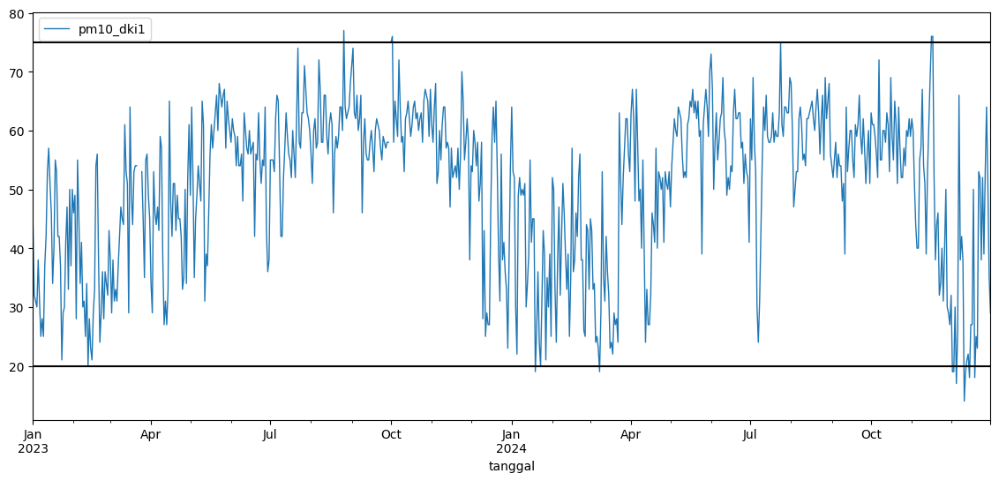

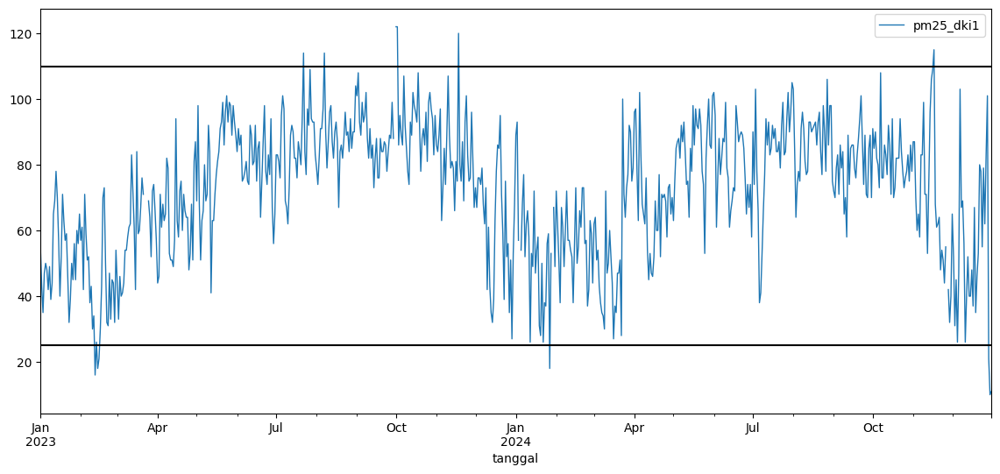

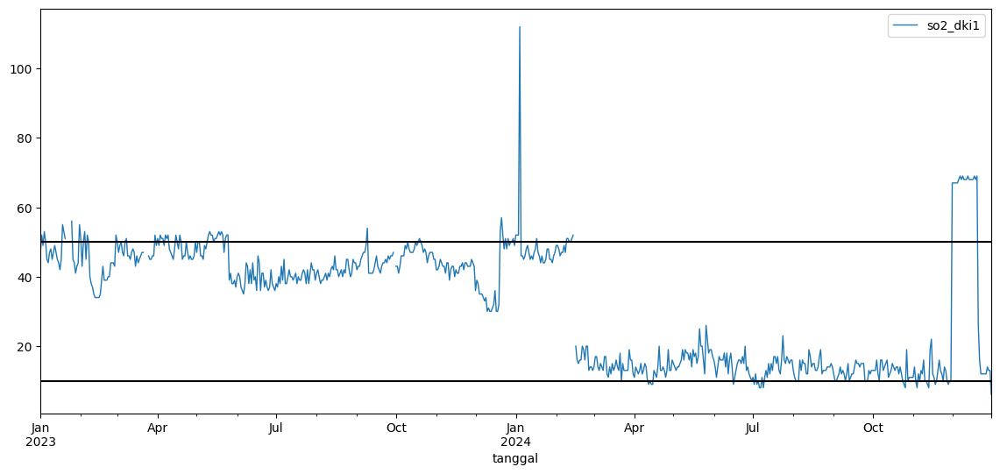

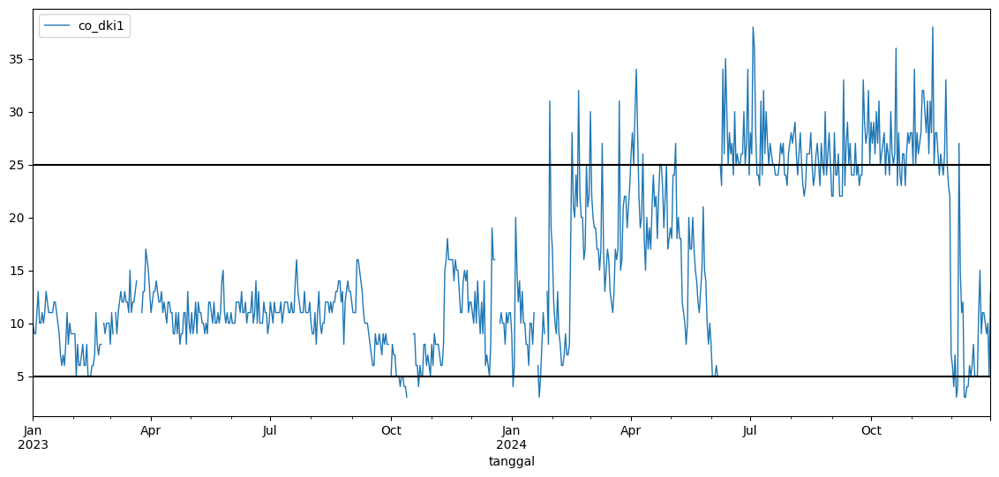

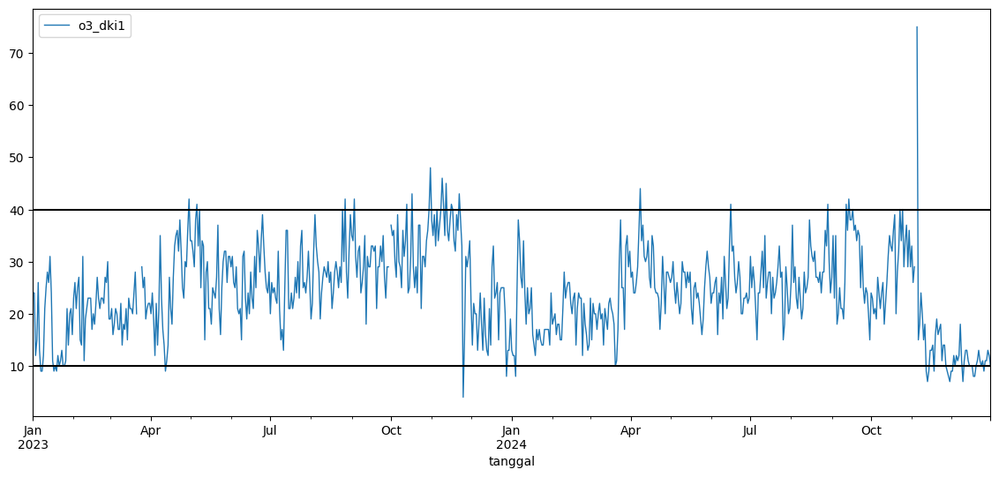

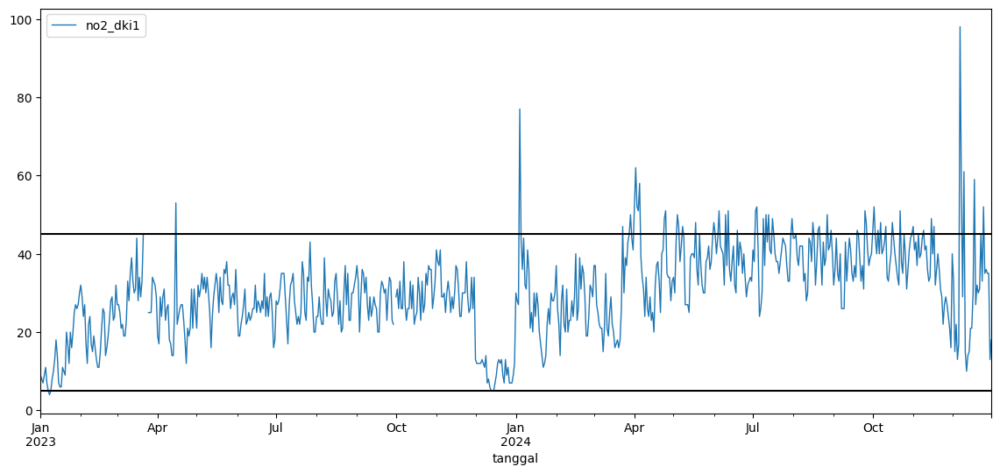

In [140]:
merge_polutan_dki1_temp = merge_polutan_dki1.copy()
merge_polutan_dki1_temp['tanggal'] = pd.to_datetime(merge_polutan_dki1_temp['tanggal'])
merge_polutan_dki1_temp = merge_polutan_dki1_temp.set_index('tanggal')

merge_polutan_dki1_temp.plot(y='pm10_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki1_temp.plot(y='pm25_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki1_temp.plot(y='so2_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki1_temp.plot(y='co_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki1_temp.plot(y='o3_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki1_temp.plot(y='no2_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 2

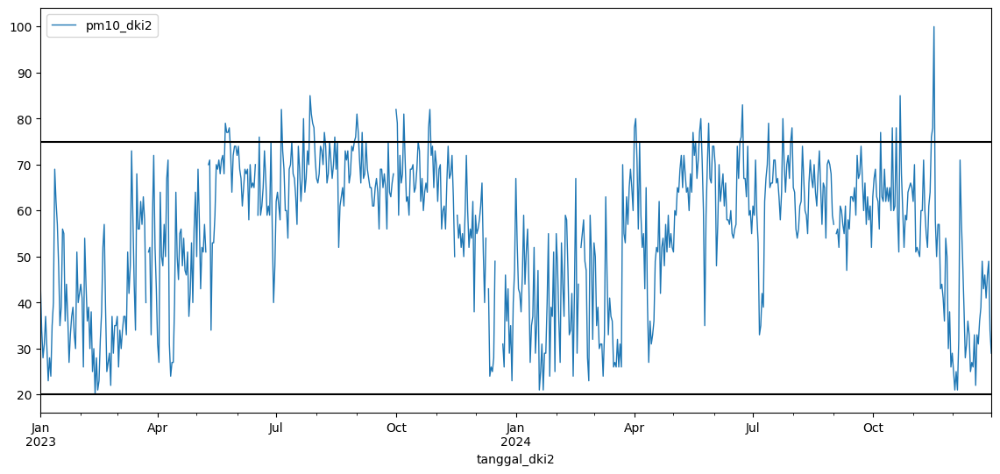

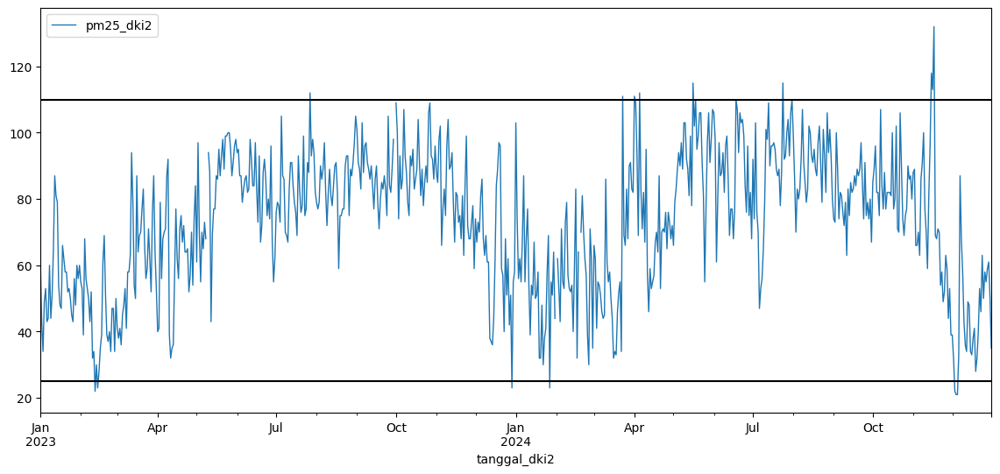

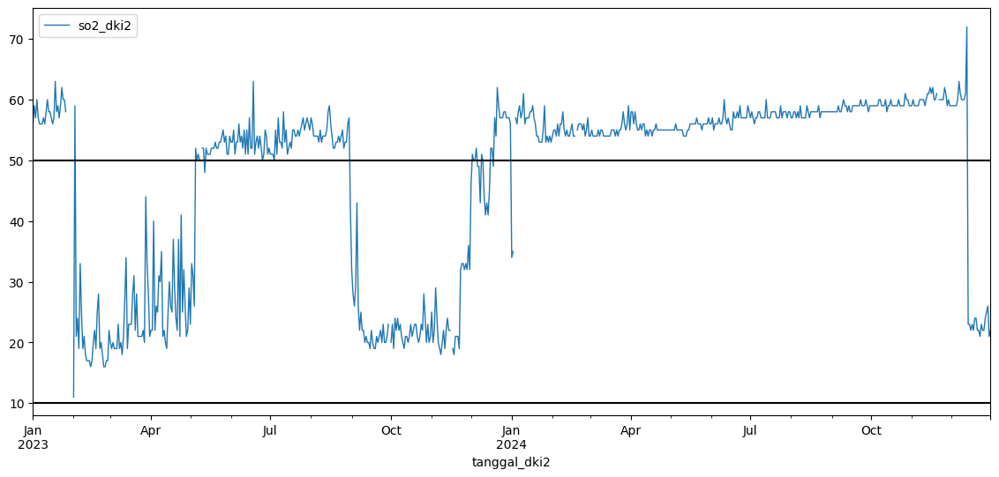

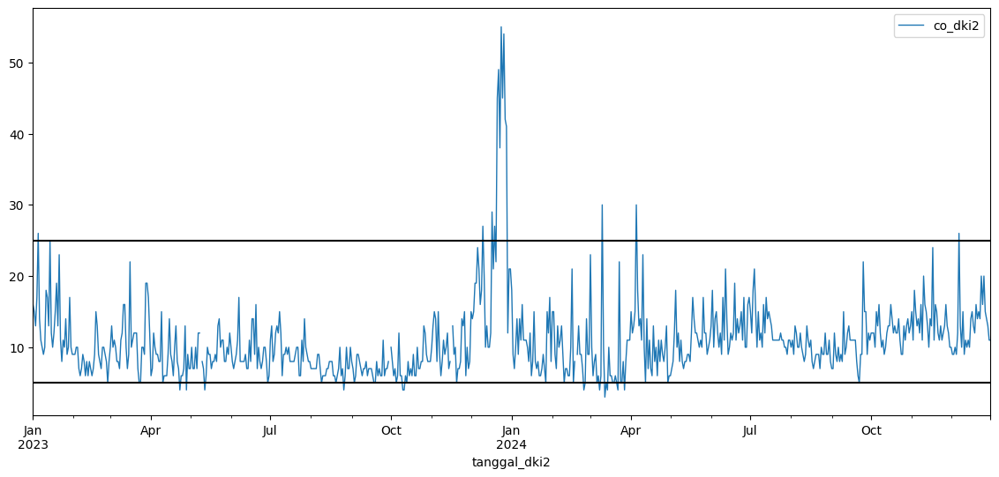

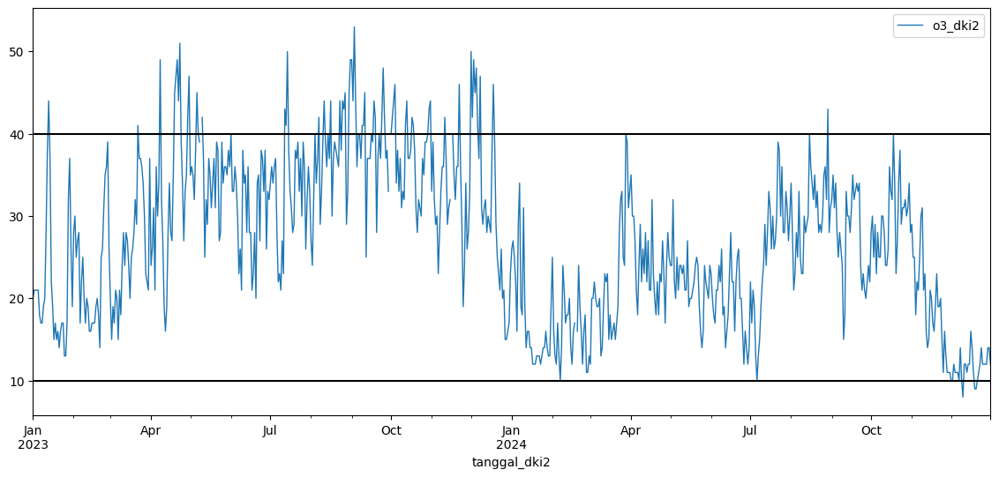

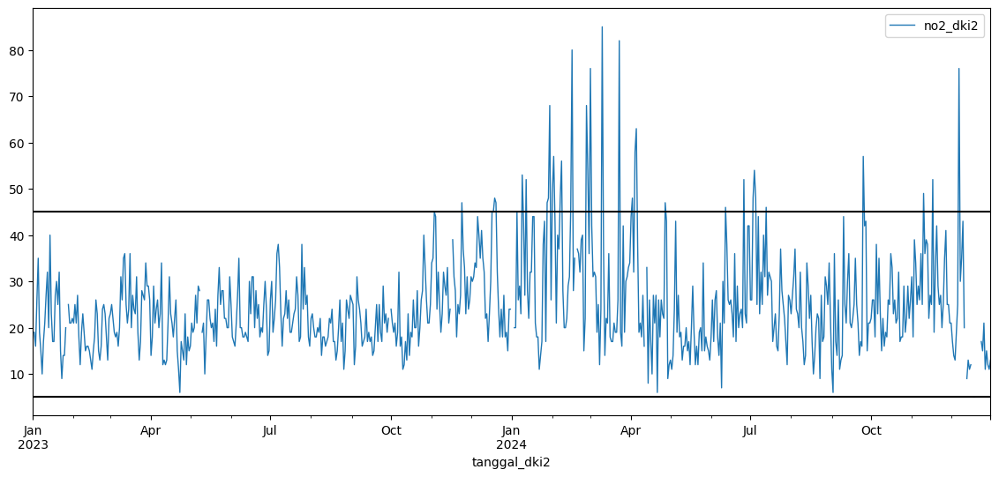

In [141]:
merge_polutan_dki2_temp = merge_polutan_dki2.copy()
merge_polutan_dki2_temp['tanggal_dki2'] = pd.to_datetime(merge_polutan_dki2_temp['tanggal_dki2'])
merge_polutan_dki2_temp = merge_polutan_dki2_temp.set_index('tanggal_dki2')

merge_polutan_dki2_temp.plot(y='pm10_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki2_temp.plot(y='pm25_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki2_temp.plot(y='so2_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki2_temp.plot(y='co_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki2_temp.plot(y='o3_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki2_temp.plot(y='no2_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 3

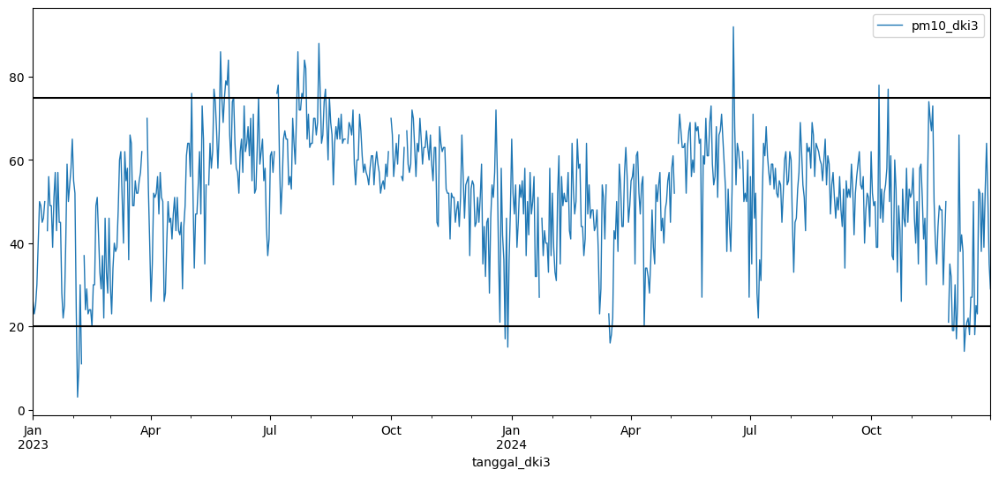

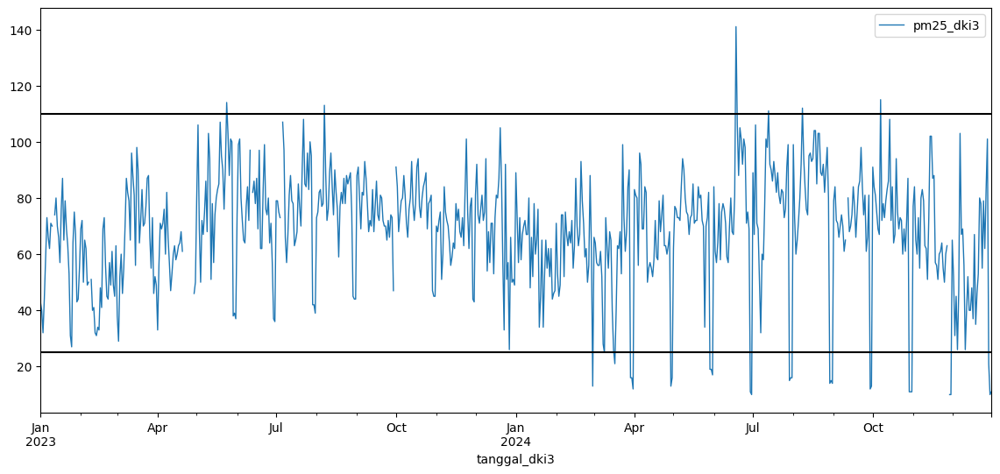

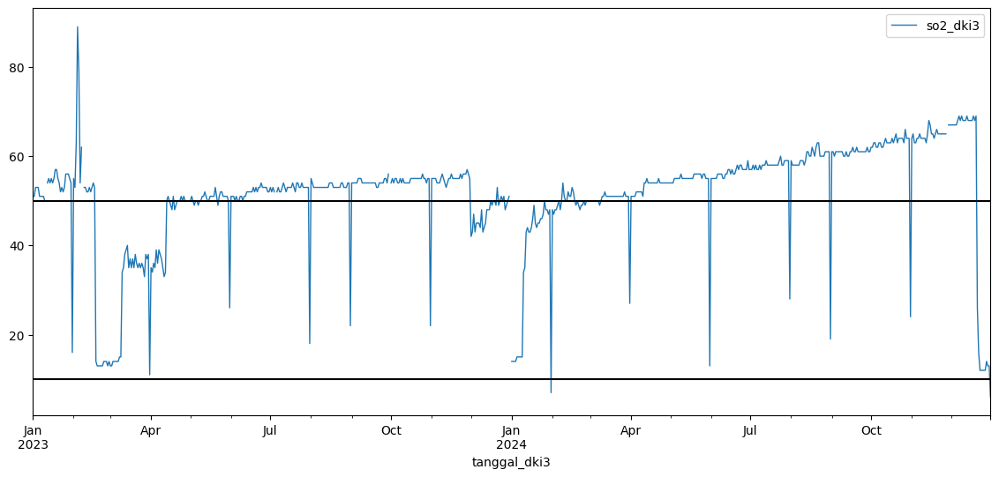

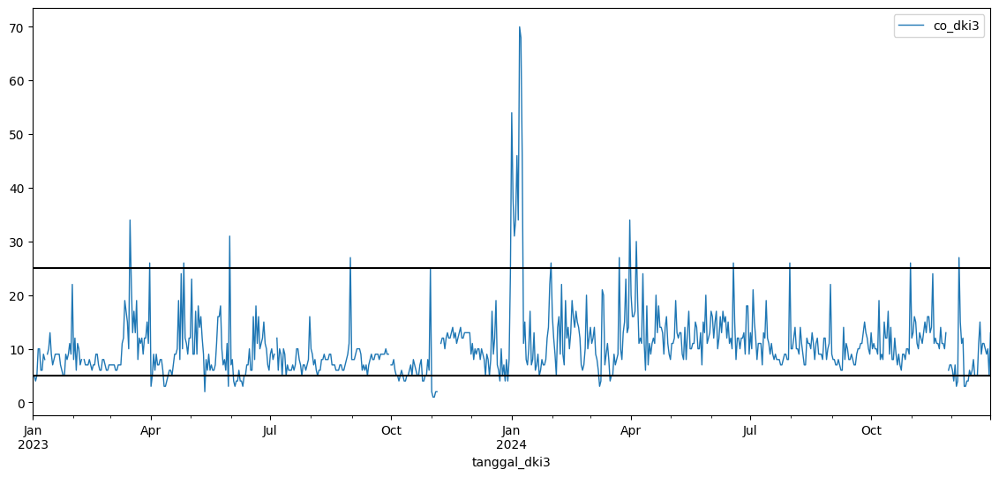

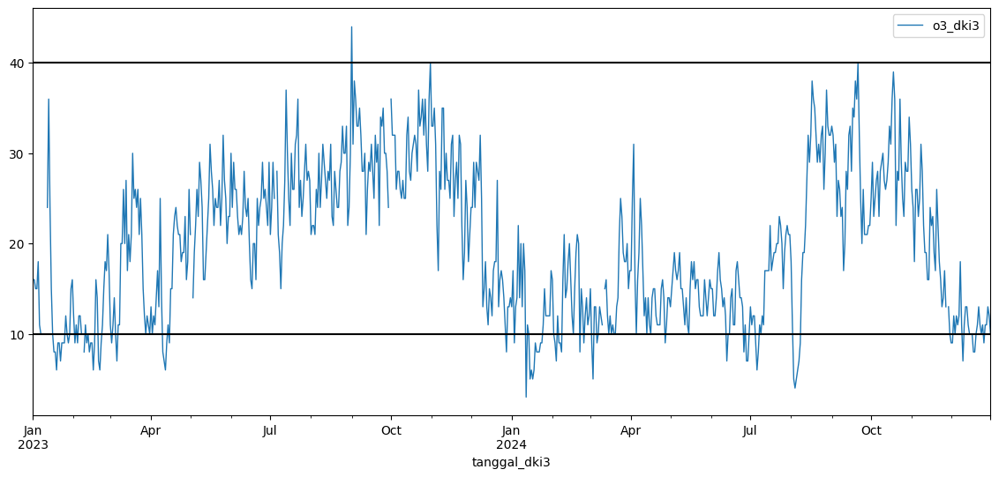

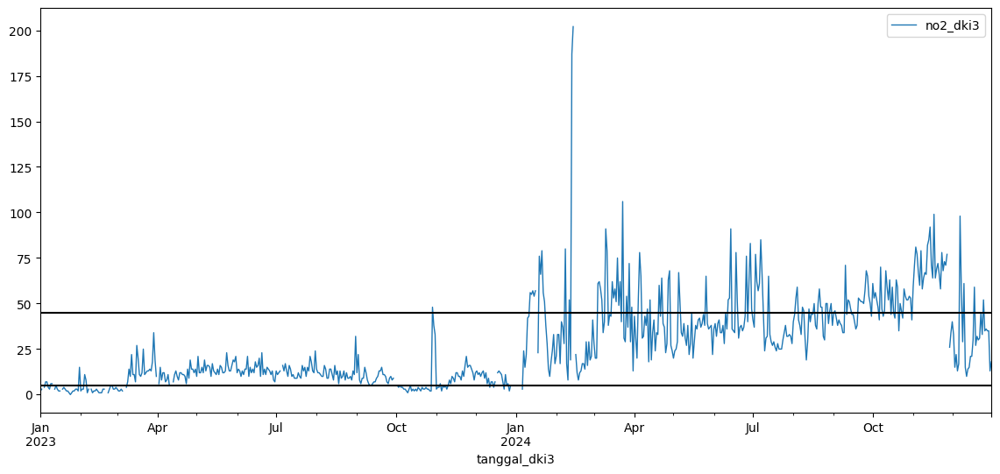

In [142]:
merge_polutan_dki3_temp = merge_polutan_dki3.copy()
merge_polutan_dki3_temp['tanggal_dki3'] = pd.to_datetime(merge_polutan_dki3_temp['tanggal_dki3'])
merge_polutan_dki3_temp = merge_polutan_dki3_temp.set_index('tanggal_dki3')

merge_polutan_dki3_temp.plot(y='pm10_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki3_temp.plot(y='pm25_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki3_temp.plot(y='so2_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki3_temp.plot(y='co_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki3_temp.plot(y='o3_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki3_temp.plot(y='no2_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 4

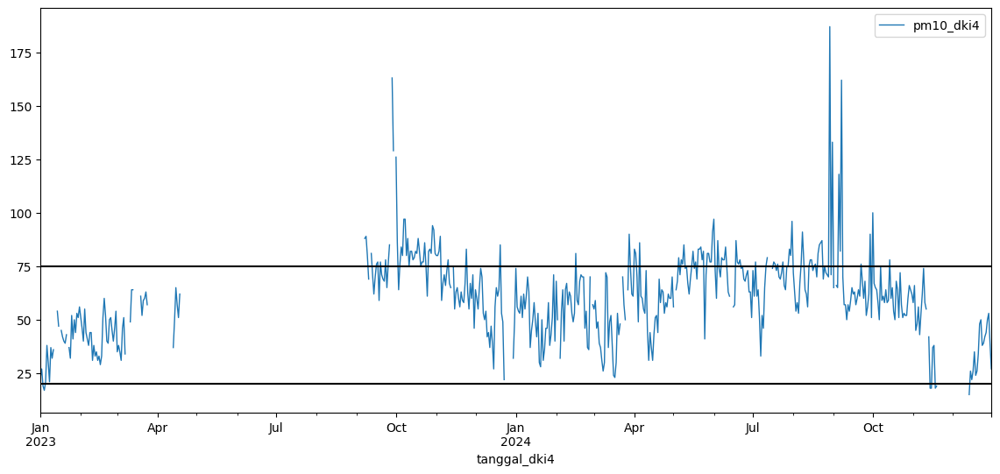

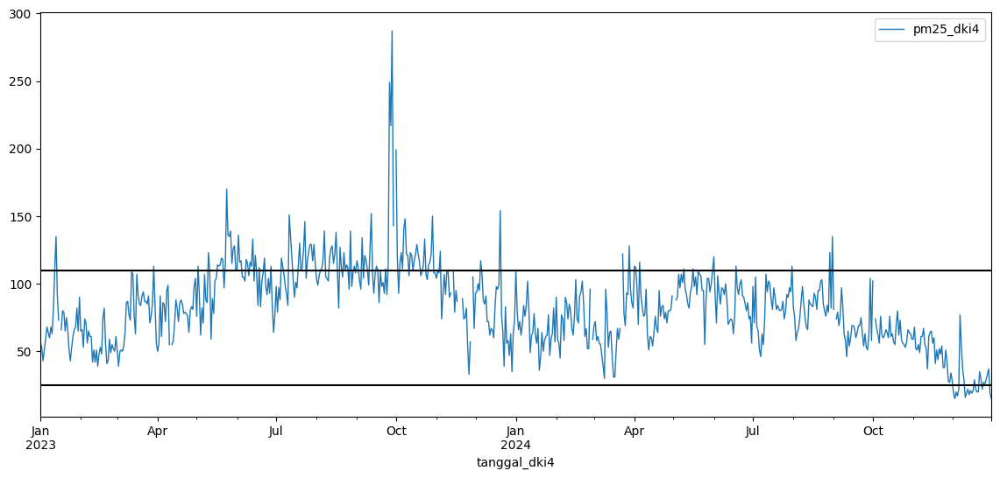

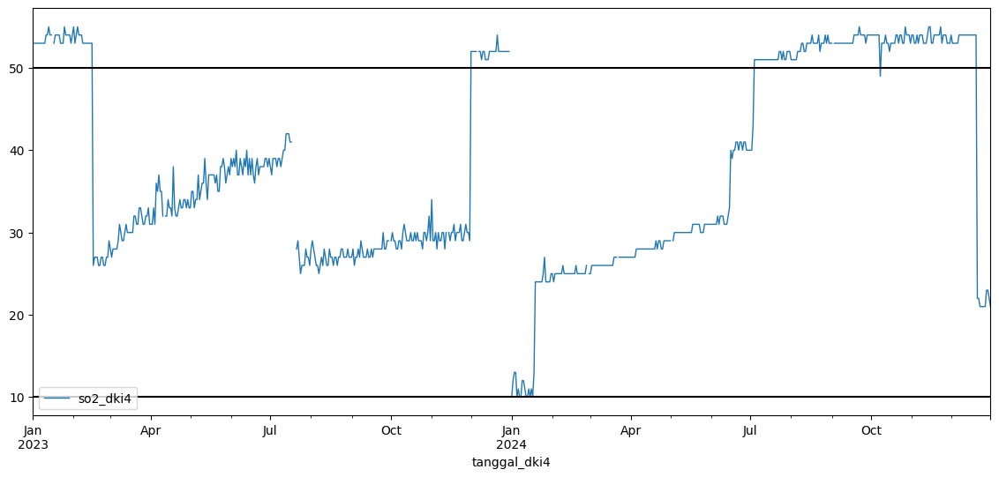

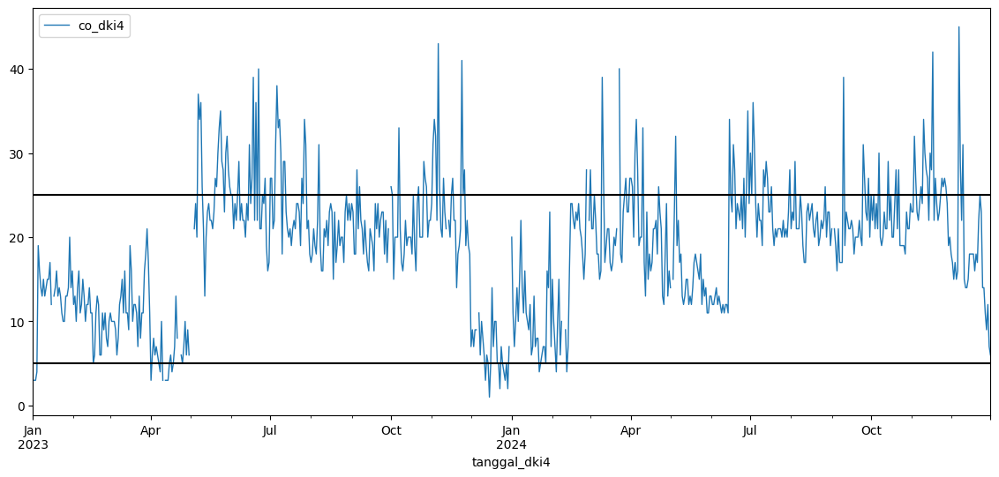

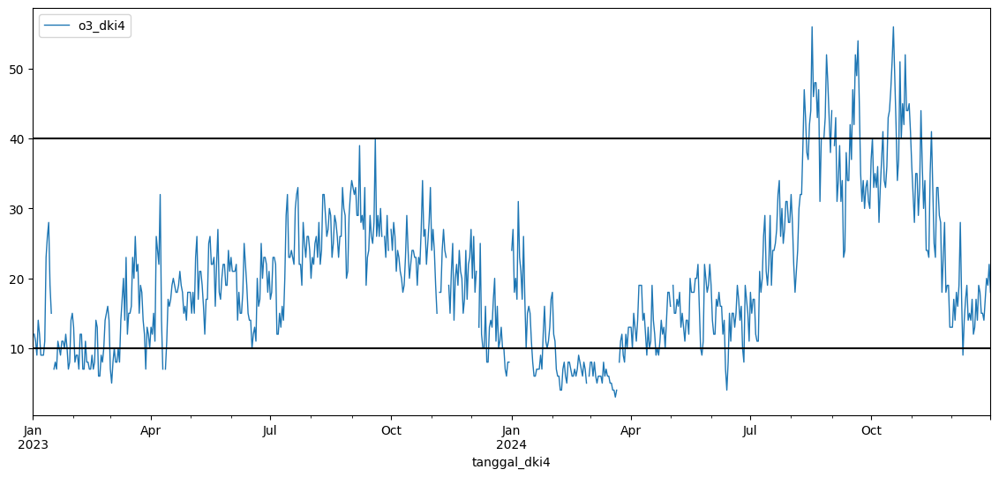

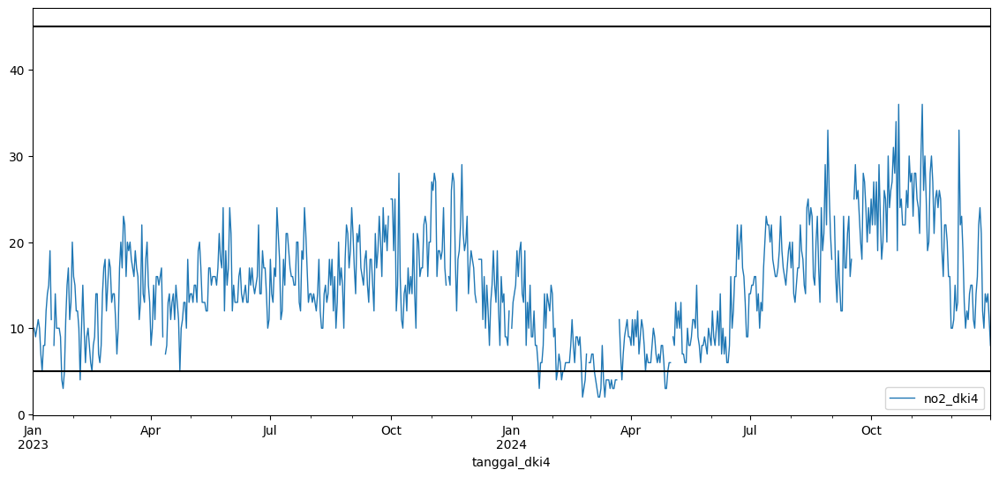

In [143]:
merge_polutan_dki4_temp = merge_polutan_dki4.copy()
merge_polutan_dki4_temp['tanggal_dki4'] = pd.to_datetime(merge_polutan_dki4_temp['tanggal_dki4'])
merge_polutan_dki4_temp = merge_polutan_dki4_temp.set_index('tanggal_dki4')

merge_polutan_dki4_temp.plot(y='pm10_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki4_temp.plot(y='pm25_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki4_temp.plot(y='so2_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki4_temp.plot(y='co_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki4_temp.plot(y='o3_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki4_temp.plot(y='no2_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 5

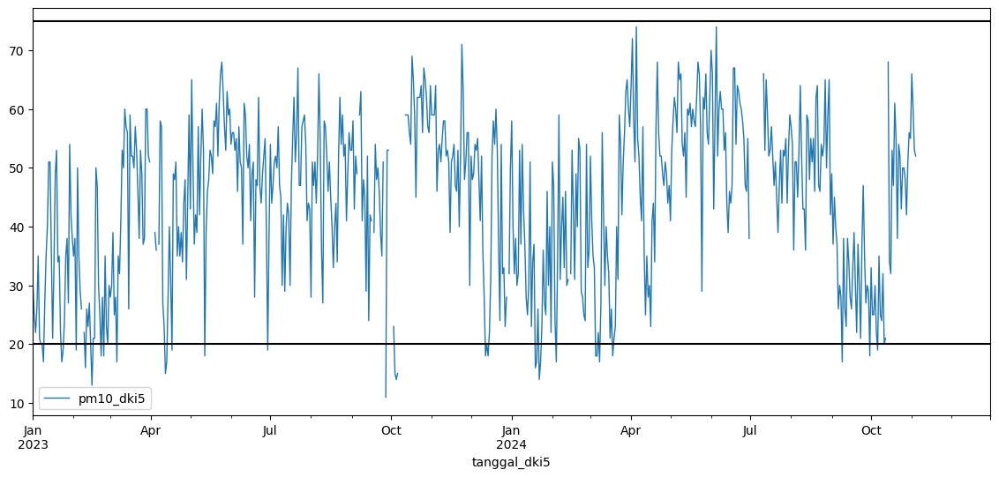

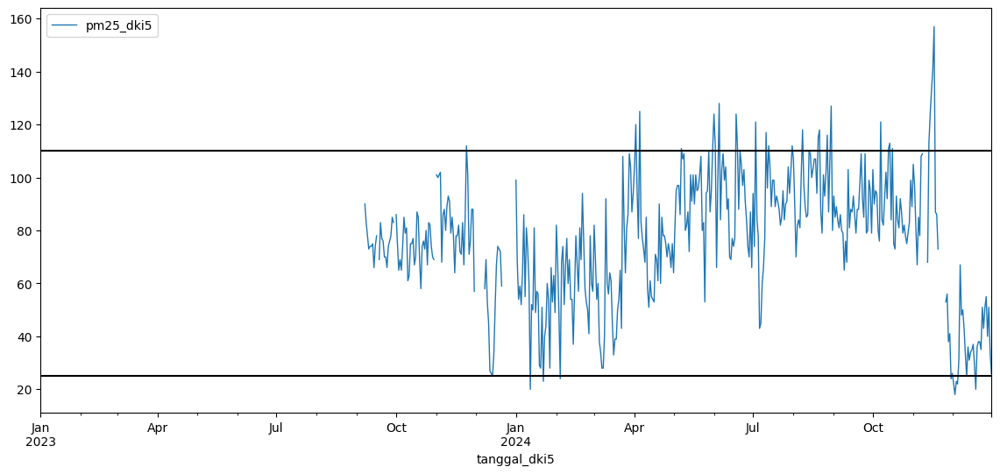

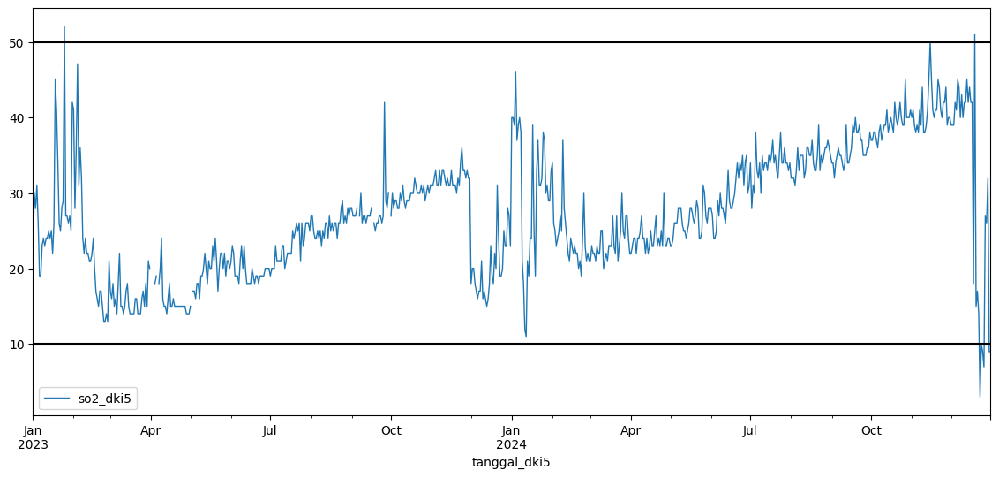

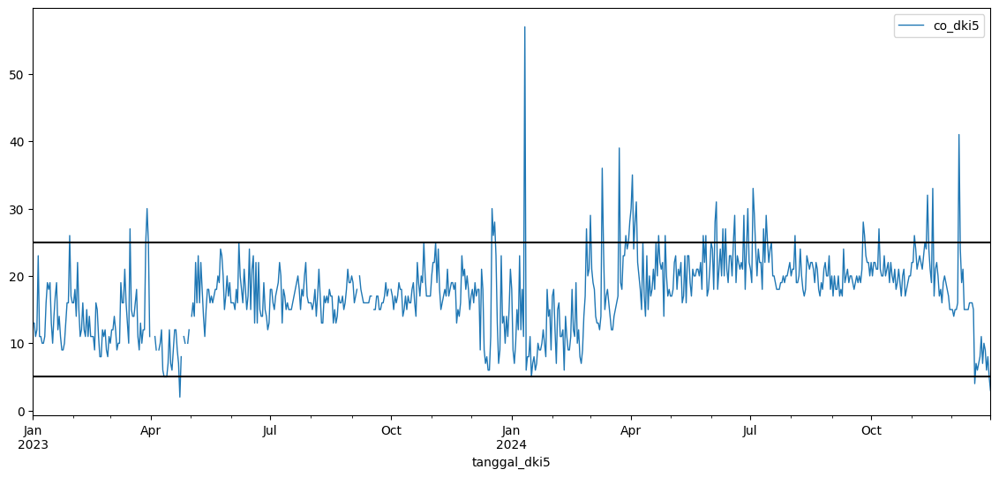

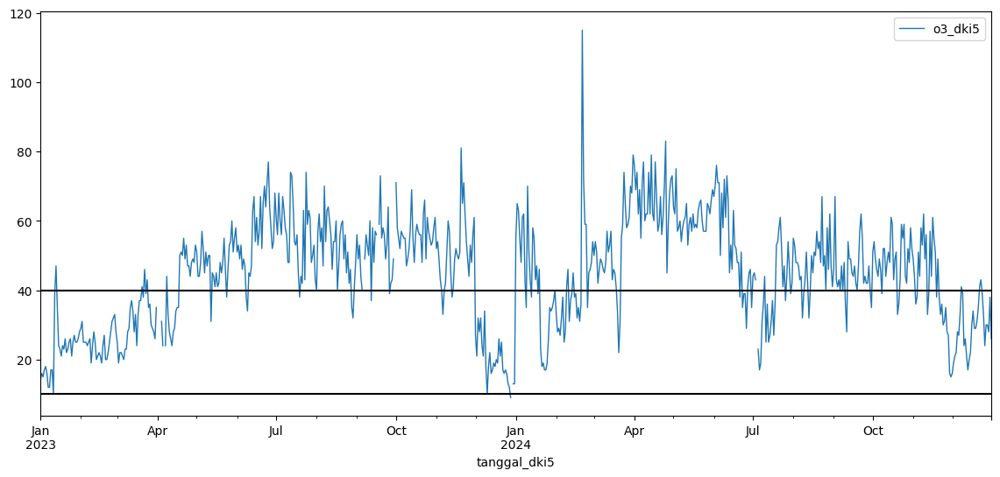

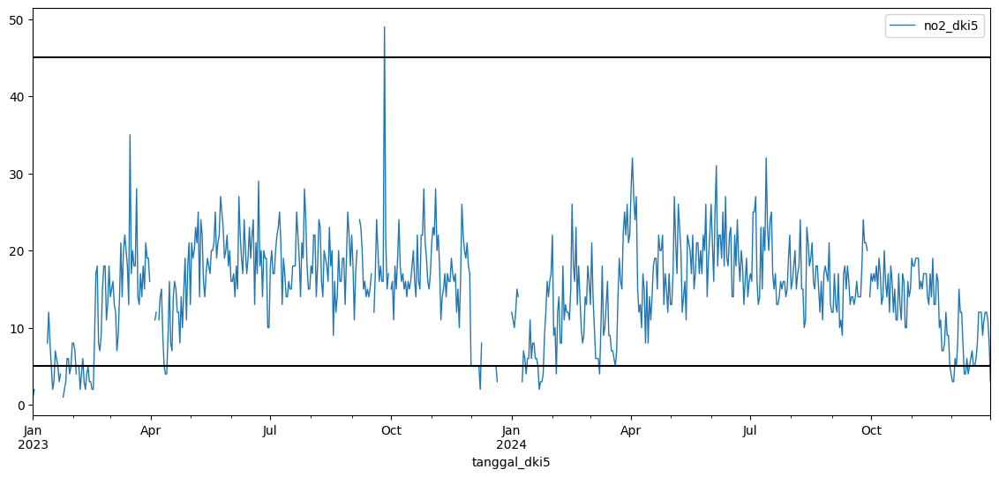

In [144]:
merge_polutan_dki5_temp = merge_polutan_dki5.copy()
merge_polutan_dki5_temp['tanggal_dki5'] = pd.to_datetime(merge_polutan_dki5_temp['tanggal_dki5'])
merge_polutan_dki5_temp = merge_polutan_dki5_temp.set_index('tanggal_dki5')

merge_polutan_dki5_temp.plot(y='pm10_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki5_temp.plot(y='pm25_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki5_temp.plot(y='so2_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki5_temp.plot(y='co_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki5_temp.plot(y='o3_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki5_temp.plot(y='no2_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

Analisis 2021-2024
1. PM10
- semua memiliki seasonality yang sama, namun tidak ada trend
- dki4 memiliki missing value terbanyak

2. PM2.5
- semua memiliki seasonality yang sama, namun tidak ada trend
- dki5 memiliki missing value terbanyak

3. SO2:
- DKI1: memiliki trend yang berbeda tiap tahun
- DKI2: memiliki seasonality untuk naik turun pada beberapa Waktu
- DKI3: memiliki trend menaik pada 2023-2024 & nilai fluktuatif sepanjang tahun
- DKI4: hanya memiliki trend yang menetap 2023 - mid 2024 & fluktuasi pada periode tersebut
- DKI5: memiliki trend menaik setiap tahun

hampir tidak kelihatan kemiripan nilai SO2 pada setiap wilayah dan juga masing" DKI mempunyai fluktuasi yang berbeda"

4. CO:
- DKI1, DKI4, DKI5 memiliki pola CO yang mirip
- DKI2, DKI3 memiliki pola CO yang mirip

5. O3: setiap stasiun memiliki trend & seasonality yang mirip dengan variasi intensitas O3 pada beberapa Waktu & setiap stasiun

6. NO2:
- DKI1, DKI4, DKI5 memiliki trend naik & turun pada Waktu yang mirip
- DKI2: tidak memiliki trend, hanya fluktuasi pada sekitar Q1 2024
- DKI3: 2021-2023 tidak memiliki trend, namun terjadi kenaikan NO2 sepanjang tahun 2024

### Menggabungkan semua data polutan ke axis y

In [145]:
all_merge_polutan = pd.concat([merge_polutan_dki1, merge_polutan_dki2, merge_polutan_dki3, merge_polutan_dki4, merge_polutan_dki5], axis=1)

In [146]:
all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 35 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   tanggal       731 non-null    object 
 1   pm10_dki1     727 non-null    float64
 2   pm25_dki1     724 non-null    float64
 3   so2_dki1      722 non-null    float64
 4   co_dki1       714 non-null    float64
 5   o3_dki1       726 non-null    float64
 6   no2_dki1      727 non-null    float64
 7   tanggal_dki2  731 non-null    object 
 8   pm10_dki2     718 non-null    float64
 9   pm25_dki2     727 non-null    float64
 10  so2_dki2      720 non-null    float64
 11  co_dki2       727 non-null    float64
 12  o3_dki2       727 non-null    float64
 13  no2_dki2      717 non-null    float64
 14  tanggal_dki3  731 non-null    object 
 15  pm10_dki3     714 non-null    float64
 16  pm25_dki3     716 non-null    float64
 17  so2_dki3      725 non-null    float64
 18  co_dki3       724 non-null    

In [147]:
all_merge_polutan = all_merge_polutan.drop(['tanggal_dki2', 'tanggal_dki3', 'tanggal_dki4', 'tanggal_dki5'], axis=1)
all_merge_polutan = all_merge_polutan.set_index('tanggal')

In [148]:
all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 731 entries, 2023-01-01 00:00:00.000000 to 2024-12-31 00:00:00.000000
Data columns (total 30 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   pm10_dki1  727 non-null    float64
 1   pm25_dki1  724 non-null    float64
 2   so2_dki1   722 non-null    float64
 3   co_dki1    714 non-null    float64
 4   o3_dki1    726 non-null    float64
 5   no2_dki1   727 non-null    float64
 6   pm10_dki2  718 non-null    float64
 7   pm25_dki2  727 non-null    float64
 8   so2_dki2   720 non-null    float64
 9   co_dki2    727 non-null    float64
 10  o3_dki2    727 non-null    float64
 11  no2_dki2   717 non-null    float64
 12  pm10_dki3  714 non-null    float64
 13  pm25_dki3  716 non-null    float64
 14  so2_dki3   725 non-null    float64
 15  co_dki3    724 non-null    float64
 16  o3_dki3    724 non-null    float64
 17  no2_dki3   707 non-null    float64
 18  pm10_dki4  515 non-null    float64
 19  pm25_dk

### Visualization Bivariate

In [149]:
all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
tanggal,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00.000000,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,...,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0
2023-01-02 00:00:00.000000,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,...,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0
2023-01-03 00:00:00.000000,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,...,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN
2023-01-04 00:00:00.000000,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,...,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0
2023-01-05 00:00:00.000000,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,...,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27 00:00:00.000000,53.0,83.0,12.0,10.0,11.0,36.0,41.0,55.0,24.0,15.0,...,21.0,11.0,17.0,14.0,NaN,55.0,27.0,9.0,30.0,12.0
2024-12-28 00:00:00.000000,64.0,101.0,14.0,9.0,11.0,35.0,46.0,59.0,25.0,14.0,...,23.0,9.0,20.0,13.0,NaN,40.0,26.0,6.0,30.0,12.0
2024-12-29 00:00:00.000000,51.0,21.0,13.0,10.0,13.0,35.0,49.0,61.0,26.0,13.0,...,23.0,12.0,19.0,14.0,NaN,51.0,32.0,8.0,28.0,11.0


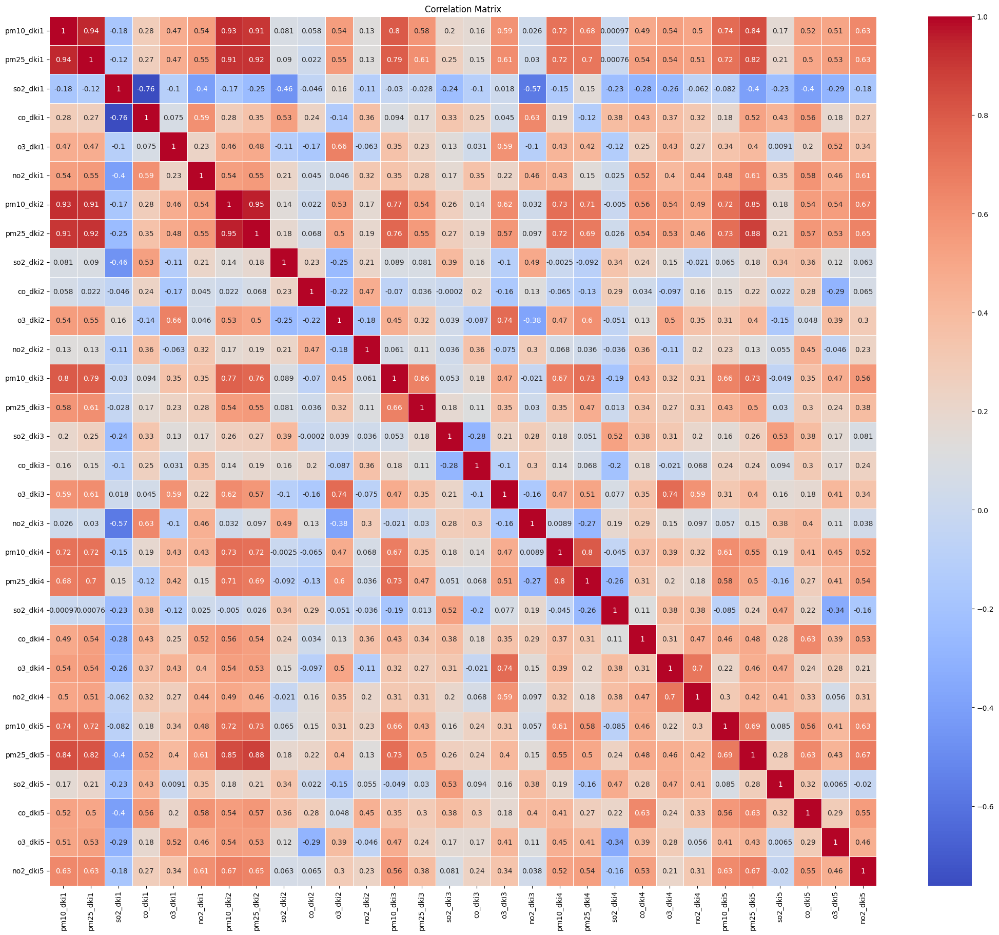

In [150]:
# Create a heatmap
plt.figure(figsize=(26, 22))
sns.heatmap(all_merge_polutan.loc[:, all_merge_polutan.columns != 'tanggal'].corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

### Cek Missing Value

1. cek berapa banyak baris yang mengandung missing values
2. cek berapa banyak baris yang seluruh datanya kosong
3. melihat berapa banyak baris dimana stasiun tidak memiliki pengukuran
4. melihat stasiun apa yang paling banyak mengandung missing values


#### 1. cek berapa banyak baris yang mengandung missing values

In [151]:
#1. cek berapa banyak baris yang mengandung missing values
all_merge_polutan[all_merge_polutan.isna().any(axis=1)]

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
tanggal,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00.000000,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,...,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0
2023-01-02 00:00:00.000000,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,...,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0
2023-01-03 00:00:00.000000,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,...,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN
2023-01-04 00:00:00.000000,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,...,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0
2023-01-05 00:00:00.000000,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,...,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27 00:00:00.000000,53.0,83.0,12.0,10.0,11.0,36.0,41.0,55.0,24.0,15.0,...,21.0,11.0,17.0,14.0,NaN,55.0,27.0,9.0,30.0,12.0
2024-12-28 00:00:00.000000,64.0,101.0,14.0,9.0,11.0,35.0,46.0,59.0,25.0,14.0,...,23.0,9.0,20.0,13.0,NaN,40.0,26.0,6.0,30.0,12.0
2024-12-29 00:00:00.000000,51.0,21.0,13.0,10.0,13.0,35.0,49.0,61.0,26.0,13.0,...,23.0,12.0,19.0,14.0,NaN,51.0,32.0,8.0,28.0,11.0


#### 2. cek berapa banyak baris yang seluruh datanya kosong

In [152]:
#2. cek berapa banyak baris yang seluruh datanya kosong
all_merge_polutan[all_merge_polutan.isna().all(axis=1)]

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
tanggal,,,,,,,,,,,,,,,,,,,,,
2023-09-30 00:00:00.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**2023-2024: 47.01% rows containing missing values**

total rows: 670

contains null: 355


**2021-2024: 51.94% rows containing missing values**

total data: 1035

baris yang mengandung null values: 548  

**Updated on 12 Mar 2025**

**2023-2024: 56.49% rows containing missing values**

total rows: 731

contains null: 413

#### 3. melihat berapa banyak baris dimana stasiun tidak memiliki pengukuran

In [153]:
#3. melihat berapa banyak baris dimana stasiun tidak memiliki pengukuran
complete_null_polutan_dki1 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI1')]
complete_null_polutan_dki2 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI2')]
complete_null_polutan_dki3 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI3')]
complete_null_polutan_dki4 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI4')]
complete_null_polutan_dki5 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI5')]


In [154]:
complete_null_polutan_dki1

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
400,2023-03-22,DKI1,NaN,NaN,NaN,NaN,NaN,NaN
408,2023-03-23,DKI1,NaN,NaN,NaN,NaN,NaN,NaN
410,2023-03-24,DKI1,NaN,NaN,NaN,NaN,NaN,NaN
1360,2023-09-30,DKI1,NaN,NaN,NaN,NaN,NaN,NaN


In [155]:
complete_null_polutan_dki2

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
641,2023-05-09,DKI2,NaN,NaN,NaN,NaN,NaN,NaN
1361,2023-09-30,DKI2,NaN,NaN,NaN,NaN,NaN,NaN
2071,2024-02-19,DKI2,NaN,NaN,NaN,NaN,NaN,NaN


In [156]:
complete_null_polutan_dki3

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
52,2023-01-11,DKI3,NaN,NaN,NaN,NaN,NaN,NaN
192,2023-02-08,DKI3,NaN,NaN,NaN,NaN,NaN,NaN
926,2023-07-05,DKI3,NaN,NaN,NaN,NaN,NaN,NaN
1362,2023-09-30,DKI3,NaN,NaN,NaN,NaN,NaN,NaN
3486,2024-11-28,DKI3,NaN,NaN,NaN,NaN,NaN,NaN


In [157]:
complete_null_polutan_dki4

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
76,2023-01-16,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
503,2023-04-11,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
1363,2023-09-30,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
1583,2023-11-13,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
2118,2024-02-28,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
2234,2024-03-22,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
2437,2024-05-02,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
3051,2024-09-02,DKI4,NaN,NaN,NaN,NaN,NaN,NaN


In [158]:
complete_null_polutan_dki5

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
451,2023-04-01,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
459,2023-04-02,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
464,2023-04-03,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
479,2023-04-06,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
1244,2023-09-06,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
1295,2023-09-17,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
1364,2023-09-30,DKI5,NaN,NaN,NaN,NaN,NaN,NaN


#### 4. melihat stasiun apa yang paling banyak mengandung missing values

In [159]:
#4. melihat stasiun apa yang paling banyak mengandung missing values
null_merge_polutan = merge_polutan[merge_polutan.isnull().any(axis=1)]

count_null_merge_polutan = pysqldf(
"""
  select 
    stasiun, 
    sum(case when pm10 is null then 1 else 0 end) as pm10,
    sum(case when pm25 is null then 1 else 0 end) as pm25,
    sum(case when so2 is null then 1 else 0 end) as so2,
    sum(case when co is null then 1 else 0 end) as co,
    sum(case when o3 is null then 1 else 0 end) as o3,
    sum(case when no2 is null then 1 else 0 end) as no2
  from null_merge_polutan
  group by stasiun
"""
)

count_null_merge_polutan

,stasiun,pm10,pm25,so2,co,o3,no2
0,DKI1,4,7,9,17,5,4
1,DKI2,13,4,11,4,4,14
2,DKI3,17,15,6,7,7,24
3,DKI4,216,14,14,18,13,12
4,DKI5,84,275,8,10,9,38


<Axes: xlabel='stasiun'>

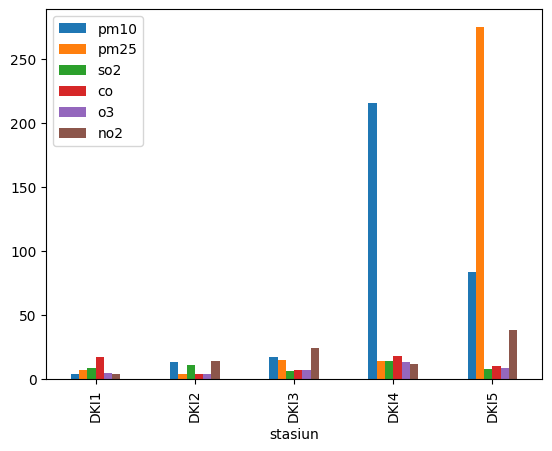

In [160]:
# see null count of every observed pollutant by each region
count_null_merge_polutan.plot(
  x='stasiun',
  kind='bar',
  stacked=False
)

### Proses Missing Values

1. data polutan akan digabung terlebih dahulu dengan data meteorologi, karena Dinas Lingkungan Hidup menyatakan bahwa data meteorologi mempengaruhi perhitungan ispu
2. setelah itu, missing pada data polutan akan diimpute menggunakan KNNImputer
3. dan juga, untuk baris yang semua datanya kosong, akan digunakan linear interpolation untuk imputasinya

In [161]:
pd.set_option("display.max_columns", None)

In [162]:
temp_all_merge_polutan = all_merge_polutan.copy()

temp_all_merge_polutan = temp_all_merge_polutan.reset_index()
temp_all_merge_polutan['tanggal'] = pd.to_datetime(temp_all_merge_polutan['tanggal']).dt.date
temp_all_merge_polutan_index = temp_all_merge_polutan['tanggal']
temp_all_merge_polutan = temp_all_merge_polutan.set_index('tanggal')
temp_all_merge_polutan = temp_all_merge_polutan.join(data_meteorologi)
temp_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,NaN,19.0,43.0,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,53.0,83.0,12.0,10.0,11.0,36.0,41.0,55.0,24.0,15.0,12.0,11.0,53.0,83.0,12.0,10.0,11.0,36.0,44.0,29.0,21.0,11.0,17.0,14.0,NaN,55.0,27.0,9.0,30.0,12.0,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,64.0,101.0,14.0,9.0,11.0,35.0,46.0,59.0,25.0,14.0,12.0,15.0,64.0,101.0,14.0,9.0,11.0,35.0,50.0,33.0,23.0,9.0,20.0,13.0,NaN,40.0,26.0,6.0,30.0,12.0,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,51.0,21.0,13.0,10.0,13.0,35.0,49.0,61.0,26.0,13.0,14.0,12.0,51.0,21.0,13.0,10.0,13.0,35.0,53.0,37.0,23.0,12.0,19.0,14.0,NaN,51.0,32.0,8.0,28.0,11.0,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


In [163]:
data_meteorologi

,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
Tanggal,,,,,,,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


In [164]:
temp_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,NaN,19.0,43.0,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,53.0,83.0,12.0,10.0,11.0,36.0,41.0,55.0,24.0,15.0,12.0,11.0,53.0,83.0,12.0,10.0,11.0,36.0,44.0,29.0,21.0,11.0,17.0,14.0,NaN,55.0,27.0,9.0,30.0,12.0,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,64.0,101.0,14.0,9.0,11.0,35.0,46.0,59.0,25.0,14.0,12.0,15.0,64.0,101.0,14.0,9.0,11.0,35.0,50.0,33.0,23.0,9.0,20.0,13.0,NaN,40.0,26.0,6.0,30.0,12.0,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,51.0,21.0,13.0,10.0,13.0,35.0,49.0,61.0,26.0,13.0,14.0,12.0,51.0,21.0,13.0,10.0,13.0,35.0,53.0,37.0,23.0,12.0,19.0,14.0,NaN,51.0,32.0,8.0,28.0,11.0,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


In [165]:
imputer = KNNImputer()
imputed_all_merge_polutan = imputer.fit_transform(temp_all_merge_polutan)

In [166]:
# temp_all_merge_polutan = temp_all_merge_polutan.reset_index()
imputed_all_merge_polutan = pd.DataFrame(imputed_all_merge_polutan, columns=temp_all_merge_polutan.columns, index=temp_all_merge_polutan_index)

In [167]:
imputed_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,47.4,10.0,10.8,10.8,30.0,54.4,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,47.2,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,2.2,19.0,43.0,53.0,3.0,11.0,9.0,22.0,26.4,28.0,11.0,15.0,4.2,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,32.4,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,54.4,26.0,23.0,18.0,5.6,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,53.0,83.0,12.0,10.0,11.0,36.0,41.0,55.0,24.0,15.0,12.0,11.0,53.0,83.0,12.0,10.0,11.0,36.0,44.0,29.0,21.0,11.0,17.0,14.0,38.8,55.0,27.0,9.0,30.0,12.0,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,64.0,101.0,14.0,9.0,11.0,35.0,46.0,59.0,25.0,14.0,12.0,15.0,64.0,101.0,14.0,9.0,11.0,35.0,50.0,33.0,23.0,9.0,20.0,13.0,45.4,40.0,26.0,6.0,30.0,12.0,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,51.0,21.0,13.0,10.0,13.0,35.0,49.0,61.0,26.0,13.0,14.0,12.0,51.0,21.0,13.0,10.0,13.0,35.0,53.0,37.0,23.0,12.0,19.0,14.0,25.6,51.0,32.0,8.0,28.0,11.0,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


In [168]:
imputed_all_merge_polutan.to_csv('./preprocessed_main_data.csv')

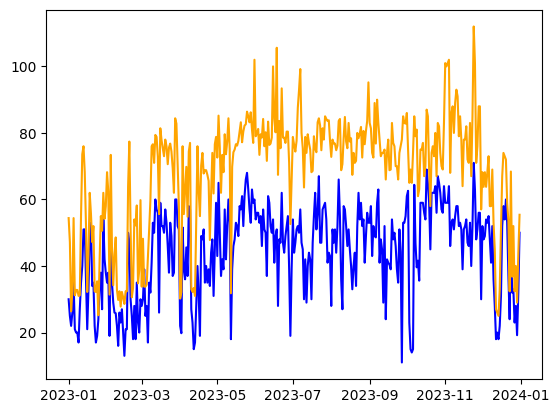

In [169]:
# impute with meteorological
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm10_dki5'], label='pm10_dki5', c='blue')
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm25_dki5'], label='pm25_dki5', c='orange')

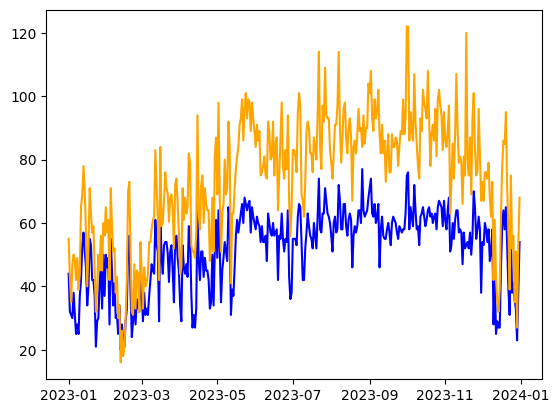

In [170]:
# impute with meteorological
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm10_dki1'], label='pm10_dki1', c='blue')
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm25_dki1'], label='pm25_dki1', c='orange')

In [171]:
imputed_all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 731 entries, 2023-01-01 to 2024-12-31
Data columns (total 42 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   pm10_dki1   731 non-null    float64
 1   pm25_dki1   731 non-null    float64
 2   so2_dki1    731 non-null    float64
 3   co_dki1     731 non-null    float64
 4   o3_dki1     731 non-null    float64
 5   no2_dki1    731 non-null    float64
 6   pm10_dki2   731 non-null    float64
 7   pm25_dki2   731 non-null    float64
 8   so2_dki2    731 non-null    float64
 9   co_dki2     731 non-null    float64
 10  o3_dki2     731 non-null    float64
 11  no2_dki2    731 non-null    float64
 12  pm10_dki3   731 non-null    float64
 13  pm25_dki3   731 non-null    float64
 14  so2_dki3    731 non-null    float64
 15  co_dki3     731 non-null    float64
 16  o3_dki3     731 non-null    float64
 17  no2_dki3    731 non-null    float64
 18  pm10_dki4   731 non-null    float64
 19  pm25_dki4   731 no

In [172]:
imputed_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,47.4,10.0,10.8,10.8,30.0,54.4,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,47.2,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,2.2,19.0,43.0,53.0,3.0,11.0,9.0,22.0,26.4,28.0,11.0,15.0,4.2,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,32.4,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,54.4,26.0,23.0,18.0,5.6,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,53.0,83.0,12.0,10.0,11.0,36.0,41.0,55.0,24.0,15.0,12.0,11.0,53.0,83.0,12.0,10.0,11.0,36.0,44.0,29.0,21.0,11.0,17.0,14.0,38.8,55.0,27.0,9.0,30.0,12.0,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,64.0,101.0,14.0,9.0,11.0,35.0,46.0,59.0,25.0,14.0,12.0,15.0,64.0,101.0,14.0,9.0,11.0,35.0,50.0,33.0,23.0,9.0,20.0,13.0,45.4,40.0,26.0,6.0,30.0,12.0,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,51.0,21.0,13.0,10.0,13.0,35.0,49.0,61.0,26.0,13.0,14.0,12.0,51.0,21.0,13.0,10.0,13.0,35.0,53.0,37.0,23.0,12.0,19.0,14.0,25.6,51.0,32.0,8.0,28.0,11.0,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


In [173]:
imputed_all_merge_polutan2 = imputed_all_merge_polutan.reset_index()
# imputed_all_merge_polutan2['tanggal'] = (imputed_all_merge_polutan2['tanggal'])  # Ensure 'tanggal' is datetime
imputed_all_merge_polutan2['season'] = pd.to_datetime(imputed_all_merge_polutan2['tanggal']).dt.dayofweek.map(lambda x: 1 if x >= 5 else 0)


In [174]:
imputed_all_merge_polutan2 = imputed_all_merge_polutan2.set_index('tanggal')

In [175]:
imputed_all_merge_polutan = imputed_all_merge_polutan2.copy()

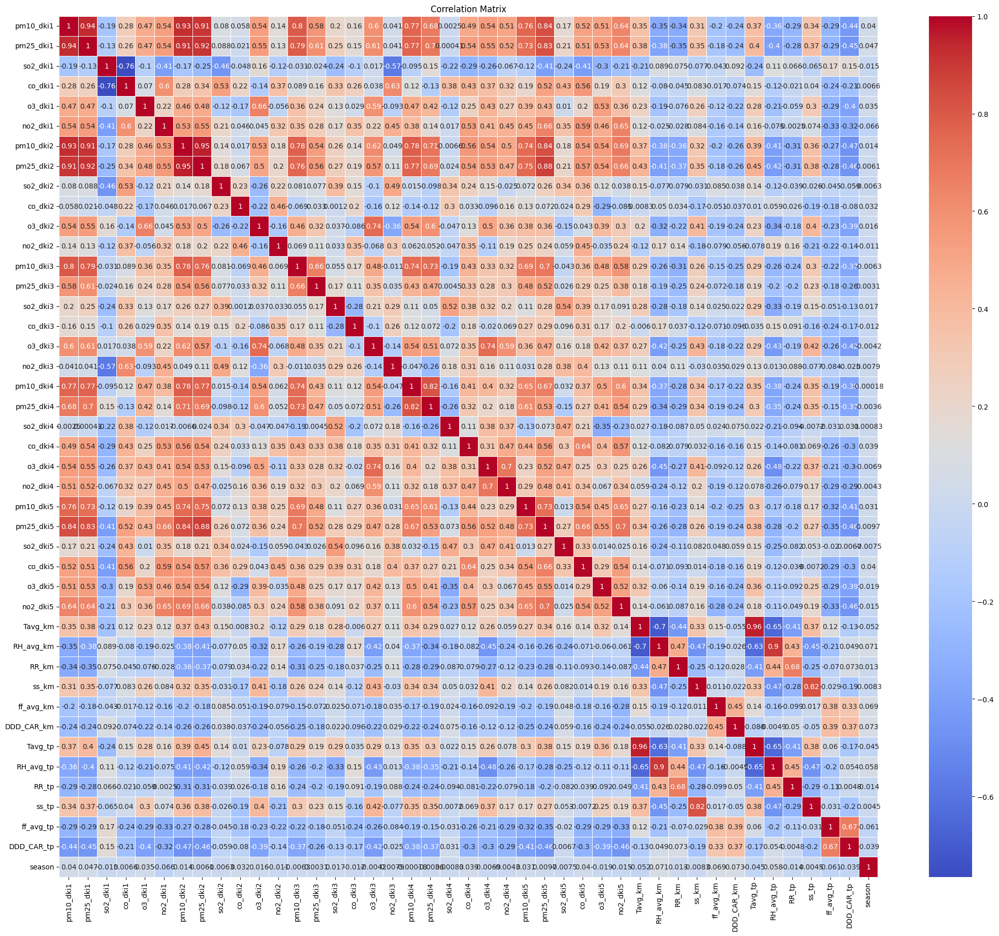

In [176]:
# Create a heatmap
plt.figure(figsize=(26, 22))
sns.heatmap(imputed_all_merge_polutan.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [177]:
holidays_2023 = {
    '2023-01-01': 'New Year 2023',
    '2023-01-22': 'Chinese New Year 2574 Kongzili',
    '2023-02-18': 'Isra Mi’raj (Ascension Day) of Prophet Muhammad.',
    '2023-03-22': 'the Holy Day of Silence, Saka New Year 1945',
    '2023-04-07': 'Good Friday',
    '2023-04-22': 'Eid Al-Fitr 1444 Hijri',
    '2023-04-23': 'Eid Al-Fitr 1444 Hijri',
    '2023-05-01': 'International Labor Day',
    '2023-05-18': 'Ascension of Jesus Christ',
    '2023-06-01': 'Pancasila Day',
    '2023-06-04': 'Vesak Day 2567',
    '2023-06-29': 'Eid al-Adha 1444 Hijri',
    '2023-07-19': 'Islamic New Year 1445 Hijri',
    '2023-08-17': 'Independence Day of the Republic of Indonesia',
    '2023-09-28': 'Birthday of Prophet Muhammad',
    '2023-12-25': 'Christmas Day'
}

collective_leaves_2023 = {
    '2023-01-23': 'Chinese New Year 2574 Kongzili (Collective Leave)',
    '2023-03-23': 'the Holy Day of Silence, Saka New Year 1945 (Collective Leave)',
    '2023-04-21': 'Eid Al-Fitr 1444 Hijri (Collective Leave)',
    '2023-04-24': 'Eid Al-Fitr 1444 Hijri (Collective Leave)',
    '2023-04-25': 'Eid Al-Fitr 1444 Hijri (Collective Leave)',
    '2023-04-26': 'Eid Al-Fitr 1444 Hijri (Collective Leave)',
    '2023-06-02': 'Vesak Day 2567 (Collective Leave)',
    '2023-12-26': 'Christmas Day (Collective Leave)'
}

holidays_2024 = {
    '2024-01-01': 'New Year 2024',
    '2024-02-08': 'Isra Mi’raj (Ascension Day) of Prophet Muhammad.',
    '2024-02-10': 'Chinese New Year 2575 Kongzili',
    '2024-03-11': 'the Holy Day of Silence, Saka New Year 1946',
    '2024-03-29': 'Good Friday',
    '2024-03-31': 'Easter Day',
    '2024-04-10': 'Eid Al-Fitr 1445 Hijri',
    '2024-04-11': 'Eid Al-Fitr 1445 Hijri',
    '2024-05-01': 'International Labor Day',
    '2024-05-09': 'Ascension of Jesus Christ',
    '2024-05-23': 'Vesak Day 2568 BE',
    '2024-06-01': 'Pancasila Day',
    '2024-06-17': 'Eid al-Adha 1445 Hijri',
    '2024-07-07': 'Islamic New Year 1446 Hijri',
    '2024-08-17': 'Independence Day of the Republic of Indonesia',
    '2024-09-16': 'Birthday of Prophet Muhammad',
    '2024-12-25': 'Christmas Day'
}

collective_leaves_2024 = {
    '2024-02-09': 'Chinese New Year 2575 Kongzili (Collective Leave)',
    '2024-03-12': 'the Holy Day of Silence, Saka New Year 1946 (Collective Leave)',
    '2024-04-08': 'Eid Al-Fitr 1445 Hijri (Collective Leave)',
    '2024-04-09': 'Eid Al-Fitr 1445 Hijri (Collective Leave)',
    '2024-04-12': 'Eid Al-Fitr 1445 Hijri (Collective Leave)',
    '2024-04-15': 'Eid Al-Fitr 1445 Hijri (Collective Leave)',
    '2024-05-10': 'Ascension of Jesus Christ (Collective Leave)',
    '2024-05-24': 'Vesak Day (Collective Leave)',
    '2024-06-18': 'Eid al-Adha 1445 Hijri (Collective Leave)',
    '2024-12-26': 'Christmas Day (Collective Leave)'
}

all_dates_2024 = {**holidays_2023, **collective_leaves_2023, **holidays_2024, **collective_leaves_2024}

holidays = pd.Series(all_dates_2024)
holidays = holidays.index


In [178]:
imputed_all_merge_polutan['holiday'] = 0
for date_str in holidays:
  date = pd.to_datetime(date_str).date()
  if date in imputed_all_merge_polutan.index:
        imputed_all_merge_polutan.loc[date, 'holiday'] = 1

In [179]:
imputed_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp,season,holiday
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,47.4,10.0,10.8,10.8,30.0,54.4,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0,1,1
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,47.2,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0,0,0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,2.2,19.0,43.0,53.0,3.0,11.0,9.0,22.0,26.4,28.0,11.0,15.0,4.2,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0,0,0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,32.4,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0,0,0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,54.4,26.0,23.0,18.0,5.6,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,53.0,83.0,12.0,10.0,11.0,36.0,41.0,55.0,24.0,15.0,12.0,11.0,53.0,83.0,12.0,10.0,11.0,36.0,44.0,29.0,21.0,11.0,17.0,14.0,38.8,55.0,27.0,9.0,30.0,12.0,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0,0,0
2024-12-28,64.0,101.0,14.0,9.0,11.0,35.0,46.0,59.0,25.0,14.0,12.0,15.0,64.0,101.0,14.0,9.0,11.0,35.0,50.0,33.0,23.0,9.0,20.0,13.0,45.4,40.0,26.0,6.0,30.0,12.0,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0,1,0
2024-12-29,51.0,21.0,13.0,10.0,13.0,35.0,49.0,61.0,26.0,13.0,14.0,12.0,51.0,21.0,13.0,10.0,13.0,35.0,53.0,37.0,23.0,12.0,19.0,14.0,25.6,51.0,32.0,8.0,28.0,11.0,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0,1,0


In [180]:
dataset_dki1 = imputed_all_merge_polutan[['pm10_dki1', 'pm25_dki1', 'so2_dki1', 'co_dki1', 'o3_dki1', 'no2_dki1', 'Tavg_km', 'RH_avg_km', 'RR_km', 'ss_km','ff_avg_km', 'DDD_CAR_km', 'Tavg_tp', 'RH_avg_tp', 'RR_tp', 'ss_tp','ff_avg_tp', 'DDD_CAR_tp', 'season', 'holiday']]
dataset_dki2 = imputed_all_merge_polutan[['pm10_dki2', 'pm25_dki2', 'so2_dki2', 'co_dki2', 'o3_dki2', 'no2_dki2', 'Tavg_km', 'RH_avg_km', 'RR_km', 'ss_km','ff_avg_km', 'DDD_CAR_km', 'Tavg_tp', 'RH_avg_tp', 'RR_tp', 'ss_tp','ff_avg_tp', 'DDD_CAR_tp', 'season', 'holiday']]
dataset_dki3 = imputed_all_merge_polutan[['pm10_dki3', 'pm25_dki3', 'so2_dki3', 'co_dki3', 'o3_dki3', 'no2_dki3', 'Tavg_km', 'RH_avg_km', 'RR_km', 'ss_km','ff_avg_km', 'DDD_CAR_km', 'Tavg_tp', 'RH_avg_tp', 'RR_tp', 'ss_tp','ff_avg_tp', 'DDD_CAR_tp', 'season', 'holiday']]
dataset_dki4 = imputed_all_merge_polutan[['pm10_dki4', 'pm25_dki4', 'so2_dki4', 'co_dki4', 'o3_dki4', 'no2_dki4', 'Tavg_km', 'RH_avg_km', 'RR_km', 'ss_km','ff_avg_km', 'DDD_CAR_km', 'Tavg_tp', 'RH_avg_tp', 'RR_tp', 'ss_tp','ff_avg_tp', 'DDD_CAR_tp', 'season', 'holiday']]
dataset_dki5 = imputed_all_merge_polutan[['pm10_dki5', 'pm25_dki5', 'so2_dki5', 'co_dki5', 'o3_dki5', 'no2_dki5', 'Tavg_km', 'RH_avg_km', 'RR_km', 'ss_km','ff_avg_km', 'DDD_CAR_km', 'Tavg_tp', 'RH_avg_tp', 'RR_tp', 'ss_tp','ff_avg_tp', 'DDD_CAR_tp', 'season', 'holiday']]


In [181]:
dataset_dki1

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp,season,holiday
tanggal,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0,1,1
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0,0,0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0,0,0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0,0,0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,53.0,83.0,12.0,10.0,11.0,36.0,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0,0,0
2024-12-28,64.0,101.0,14.0,9.0,11.0,35.0,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0,1,0
2024-12-29,51.0,21.0,13.0,10.0,13.0,35.0,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0,1,0


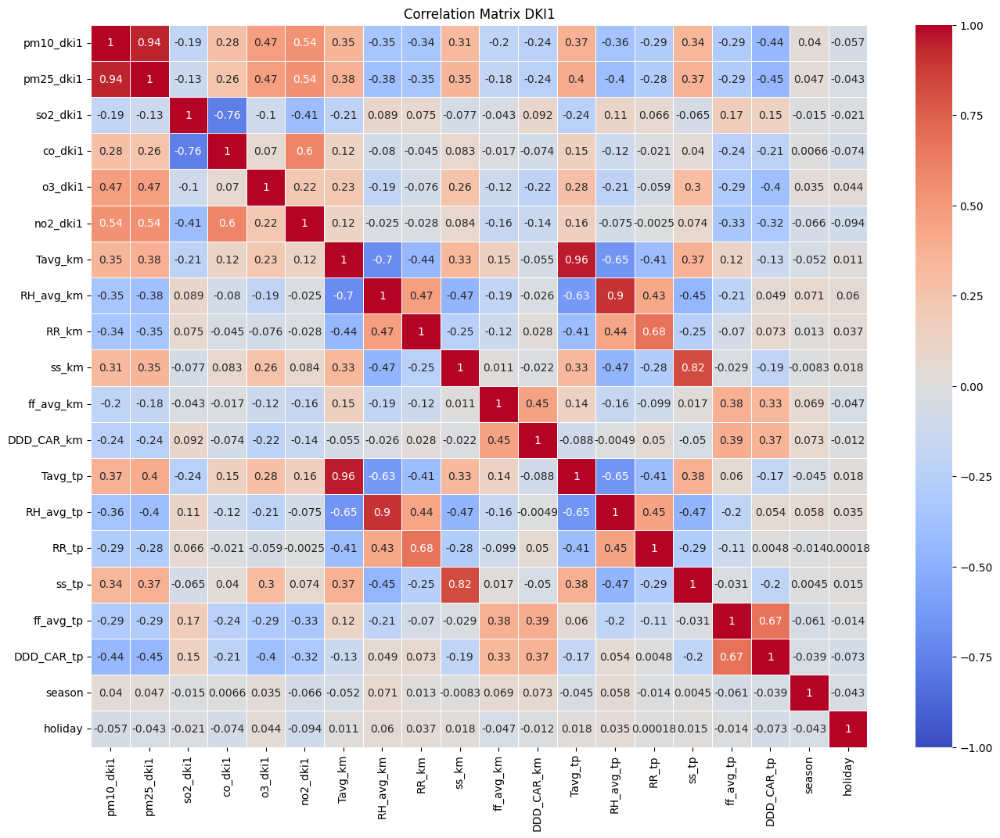

In [182]:
plt.figure(figsize=(16,12))
sns.heatmap(dataset_dki1.corr(), annot=True, cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Matrix DKI1')
plt.show()

# tambah lib stats, func perason cpy.stats.pearsonr
# ambil p value (0-1) dan dijadiin heatmap
# cari p value < alpha (0.05)

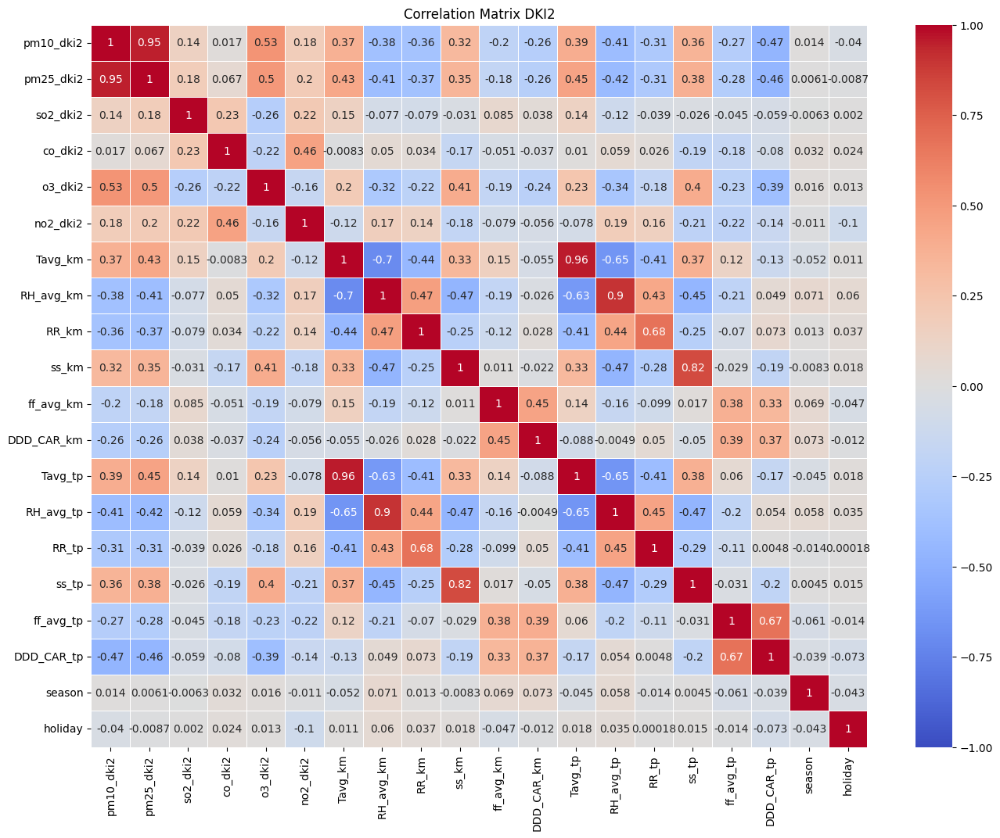

In [183]:
plt.figure(figsize=(16,12))
sns.heatmap(dataset_dki2.corr(), annot=True, cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Matrix DKI2')
plt.show()

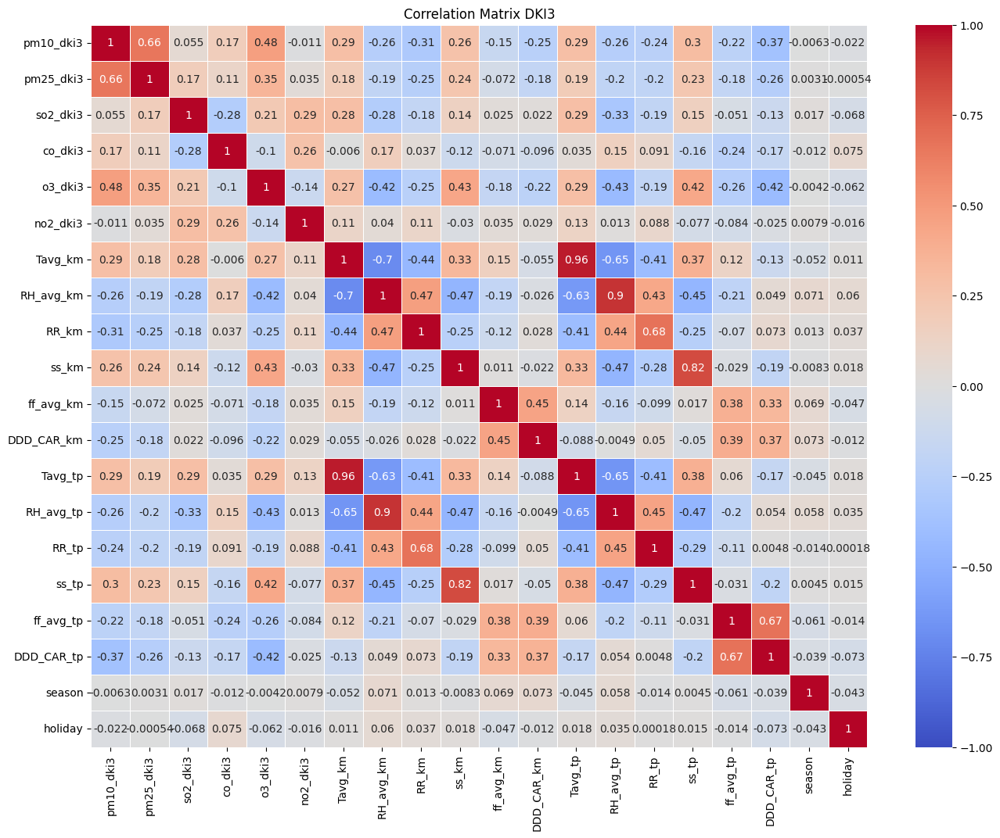

In [184]:
plt.figure(figsize=(16,12))
sns.heatmap(dataset_dki3.corr(), annot=True, cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Matrix DKI3')
plt.show()

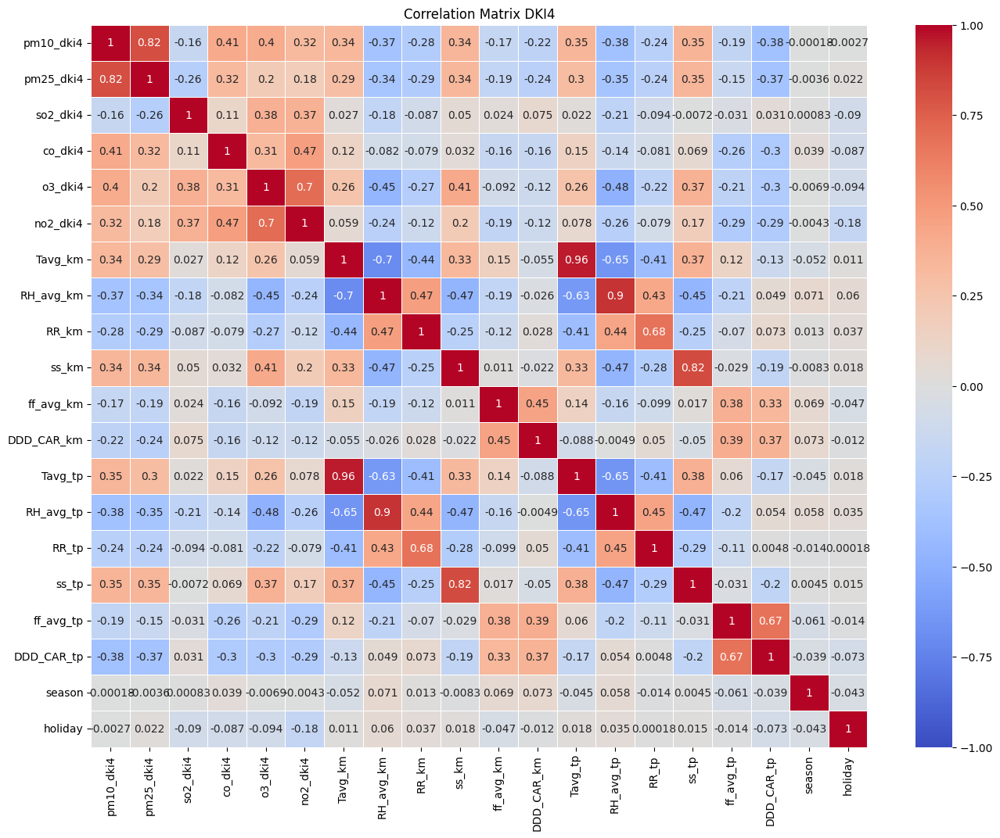

In [185]:
plt.figure(figsize=(16,12))
sns.heatmap(dataset_dki4.corr(), annot=True, cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Matrix DKI4')
plt.show()

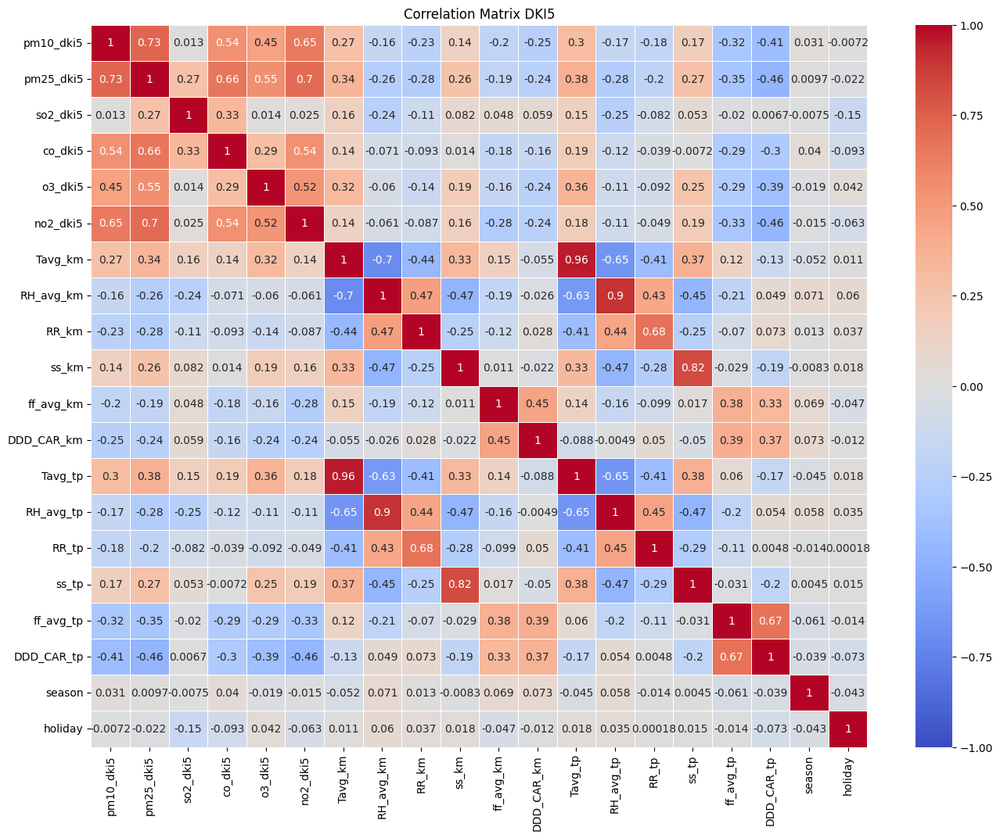

In [186]:
plt.figure(figsize=(16,12))
sns.heatmap(dataset_dki5.corr(), annot=True, cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Matrix DKI5')
plt.show()

# pilihan variable terhadap pm2.5
polusi (punya korelasi positif):
- pm10
- co
- o3
- no2

cuaca (punya korelasi negatifm, kecuali ss):
- Tavg
- RH
- RR
- ss (korelasi positif)